In [1]:
import pandas as pd
import numpy as np
import os
import fcsparser
import matplotlib.pyplot as plt 
import fcswrite
import random 


In [2]:
def fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
               spectrum_channels,scalex,sum_method = "median"):
    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(2)
    plt.hist(data[peak_channel], edgecolor="black", bins=500) 
    plt.yscale('log')
    if scalex:
        plt.xscale('log')
    plt.axvspan(min, max, alpha=0.5, color='red')
    plt.title(filename+'\n'+peak_channel)
    plt.show()

    data_sub = data.loc[(data[peak_channel]>min) & (data[peak_channel]<max)]
    data_sub = data_sub[chn_names]
    if sample_data:
        if len(data_sub)>sample_size:
            random.seed(123)
            data_sub = data_sub.sample(n=sample_size, replace=False, random_state=1)
    print(f"len(data_sub): {len(data_sub)}")
    fcswrite.write_fcs(filename=Output_dir+"/"+filename,
                        chn_names=chn_names,
                        data=data_sub)
    data_sub.to_pickle(Output_dir+"/"+filename+".pkl")  
    
    spectrum_data = data_sub[spectrum_channels]
    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(2)
    spectrum_line = np.mean(spectrum_data, axis=0)
    if sum_method == "median":
        spectrum_line[:] = np.median(spectrum_data, axis=0)
    plt.plot(spectrum_line)
    plt.title(filename)
    plt.xticks(rotation = 90)
    plt.show()

def gating(data,x_chan,y_chan,x_min,x_max,y_min,y_max,x_scale,y_scale):

    if len(data)>1000:
        random.seed(123)
        data_sample = data.sample(n=1000, replace=False, random_state=1)
    else:
        data_sample = data

    f = plt.figure()
    f.set_figwidth(6)
    f.set_figheight(4)
    plt.scatter(x = data_sample[x_chan],y =data_sample[y_chan],s = 1) 
    if y_scale:
        plt.yscale('log')
    if x_scale:
        plt.xscale('log')
    rectangle = plt.Rectangle(xy = (x_min,y_min), width = (x_max-x_min), height = (y_max-y_min), fc='None',ec="grey")
    plt.gca().add_patch(rectangle)
    #plt.axvspan(xmin = x_min,xmax = x_max,ymin = y_min,ymax = y_max,alpha=0.5, color='red')
    plt.show()

    data_sub = data.loc[(data[x_chan]>x_min) & (data[x_chan]<x_max)]
    data_sub = data_sub.loc[(data_sub[y_chan]>y_min) & (data_sub[y_chan]<y_max)]
    return(data_sub) 

In [3]:
#Set Data dir and Output dir
Data_dir = 'E:/ResidualModel/extra_13_fcs_subset/Data'
Output_dir = 'E:/ResidualModel/extra_13_fcs_subset/Output'
#Data_list = os.listdir(Data_dir)

In [5]:
#prepare channel ids
path = Data_dir+"/scc_Aurora5L/AlexaFluor700.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
spectrum_channels = data.columns[list(range(1,17))+list(range(19,35))+list(range(39,71))]
full_channels = data.columns

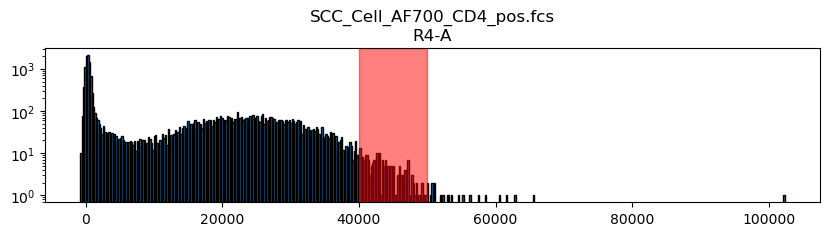

len(data_sub): 210


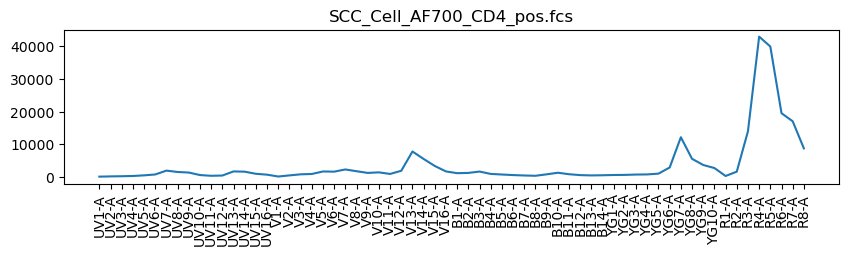

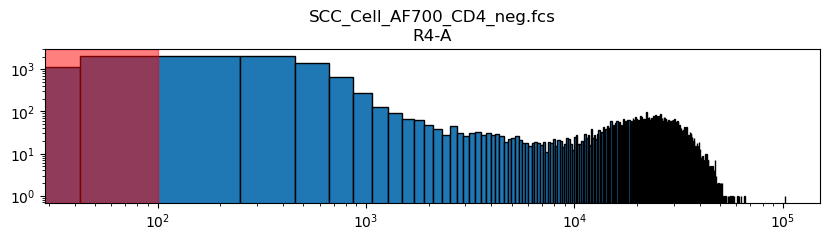

len(data_sub): 786


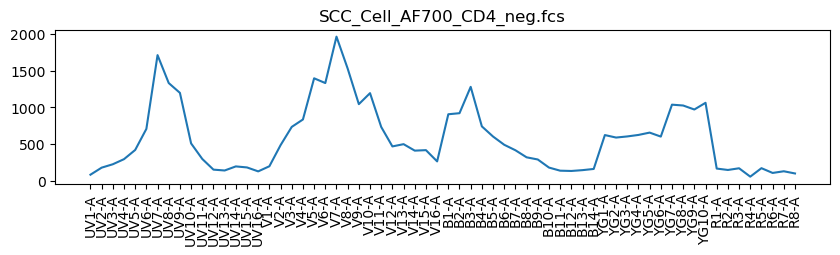

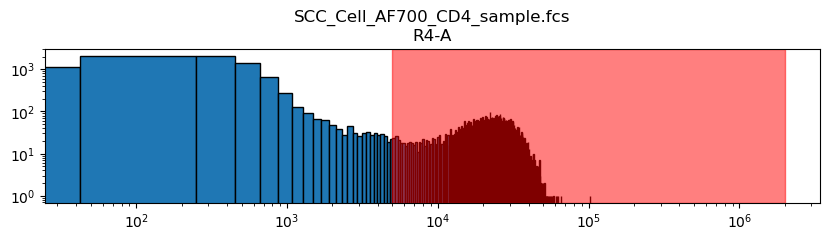

len(data_sub): 7353


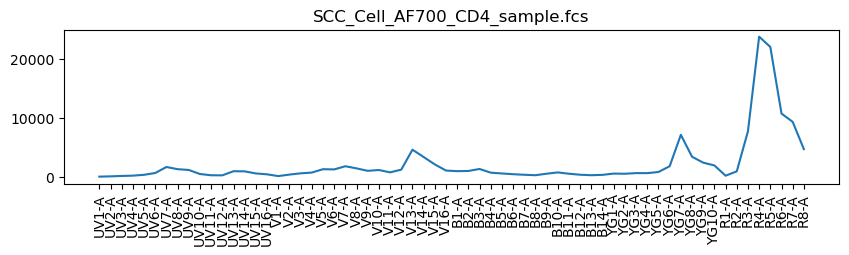

In [153]:
path = Data_dir+"/scc_Aurora5L/AlexaFluor700.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R4-A'

min = 40000
max = 50000
filename = 'SCC_Cell_AF700_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 0
max = 100
filename = 'SCC_Cell_AF700_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 5000
max = 2000000
filename = 'SCC_Cell_AF700_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

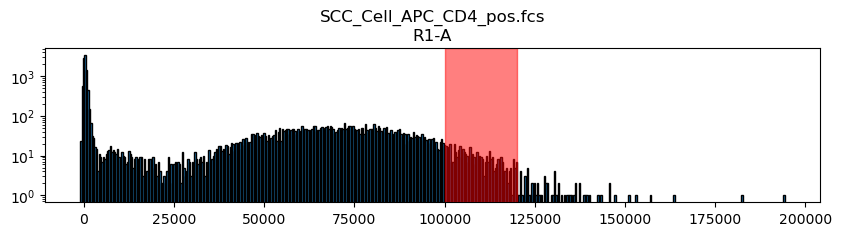

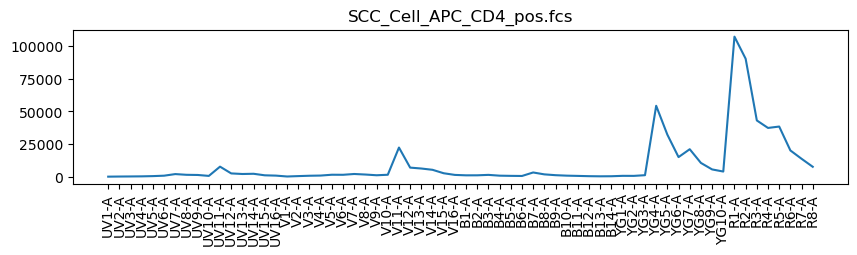

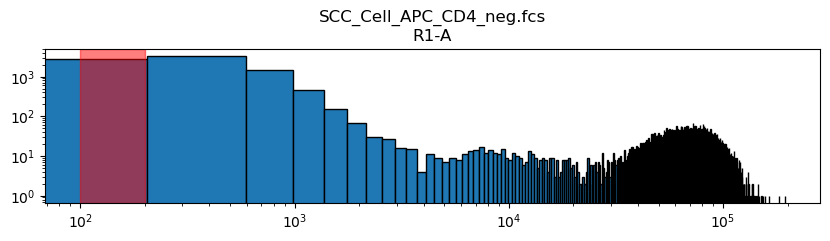

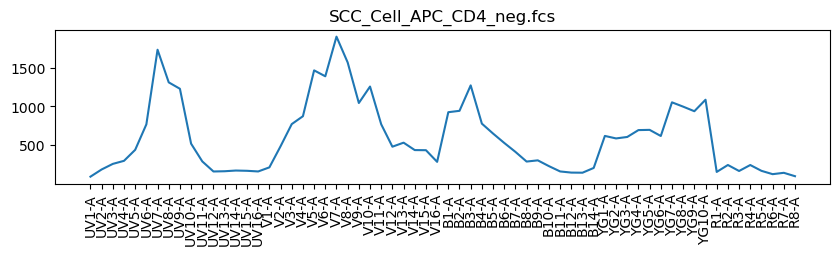

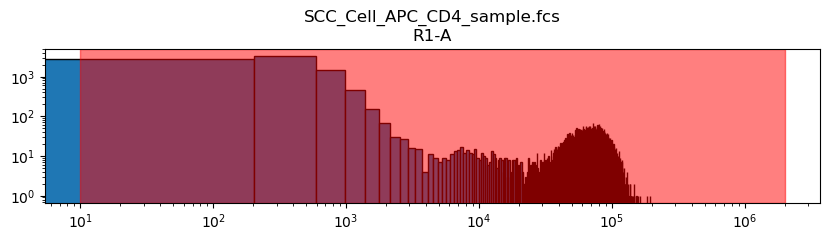

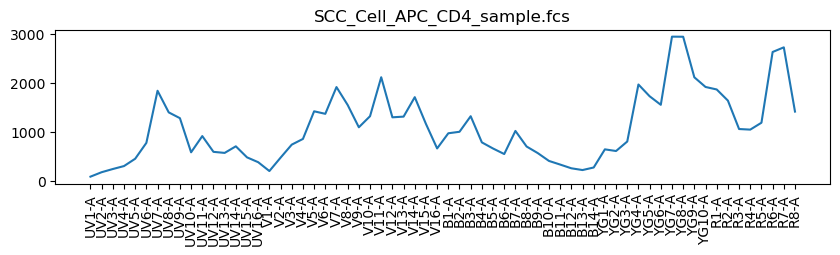

In [6]:
path = Data_dir+"/scc_Aurora5L/APC.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R1-A'

min = 100000
max = 120000
filename = 'SCC_Cell_APC_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_APC_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_APC_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

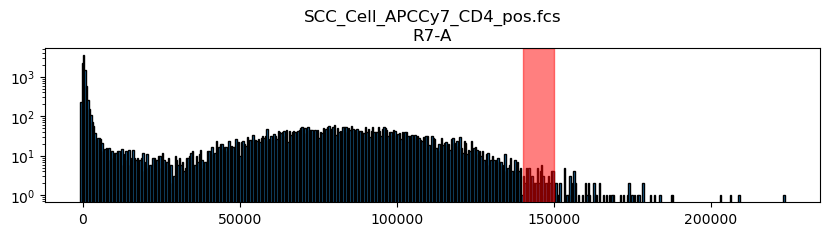

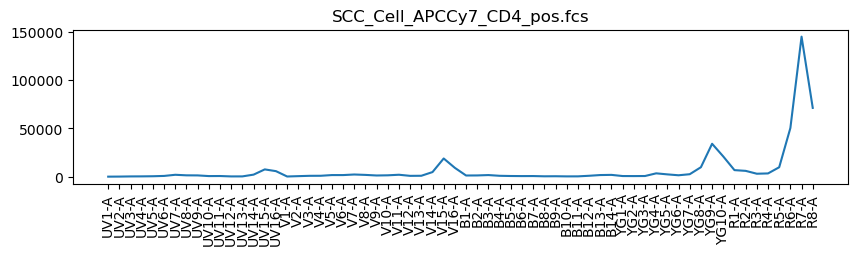

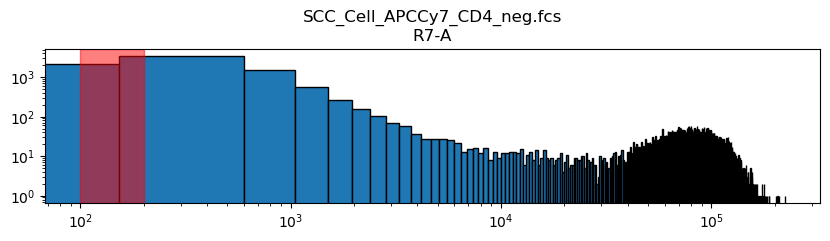

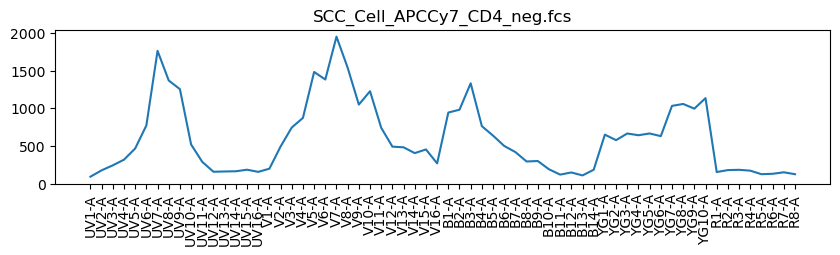

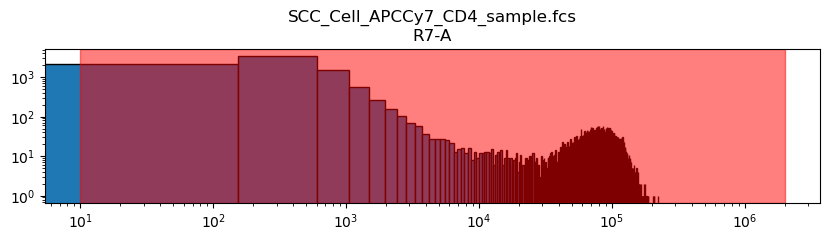

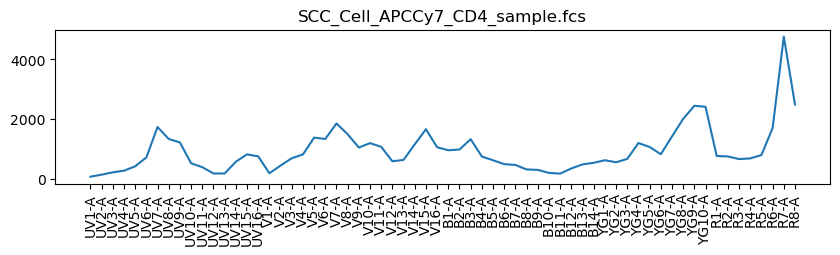

In [8]:
path = Data_dir+"/scc_Aurora5L/APCCy7.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R7-A'

min = 140000
max = 150000
filename = 'SCC_Cell_APCCy7_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_APCCy7_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_APCCy7_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

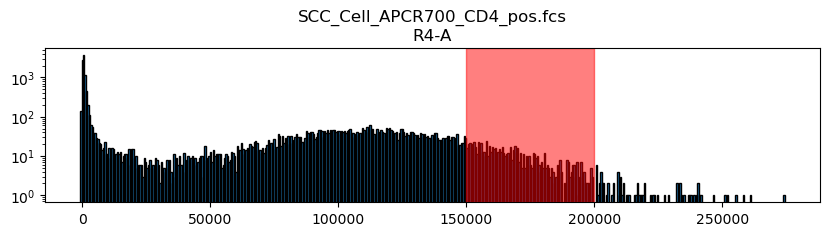

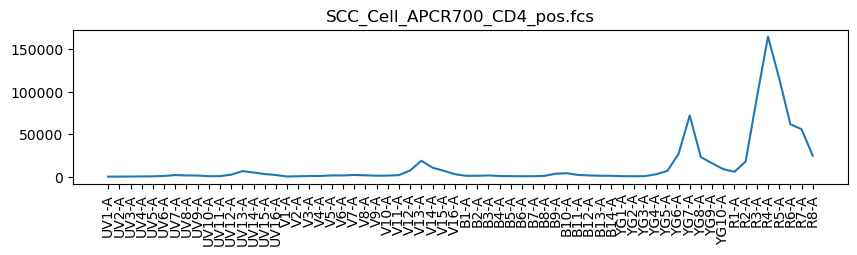

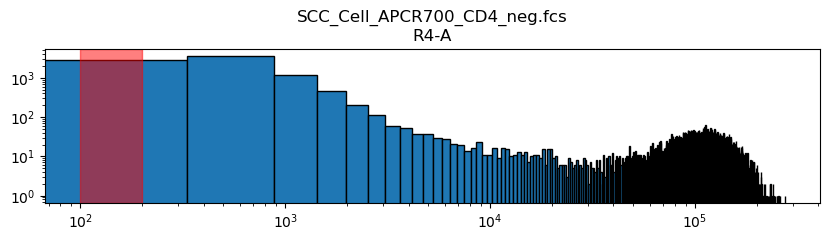

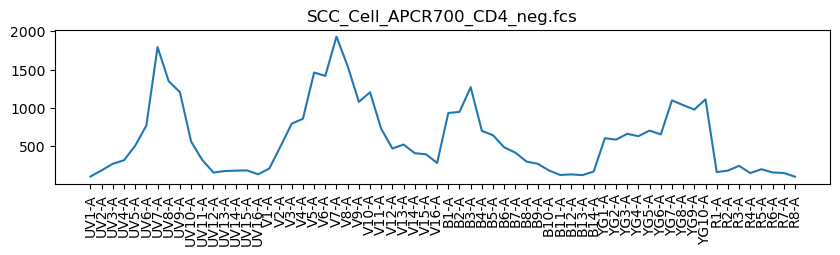

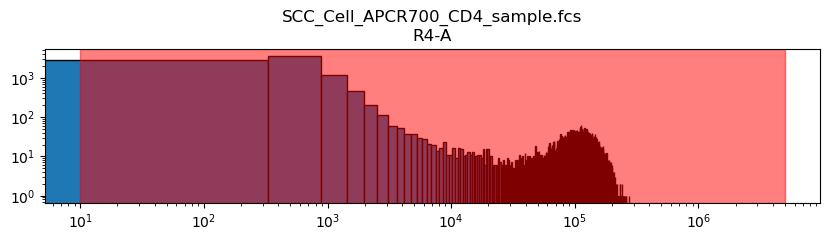

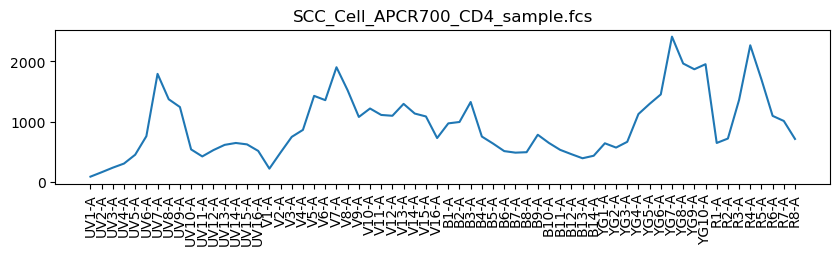

In [10]:
path = Data_dir+"/scc_Aurora5L/APCR700.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R4-A'

min = 150000
max = 200000
filename = 'SCC_Cell_APCR700_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_APCR700_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 5000000
filename = 'SCC_Cell_APCR700_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

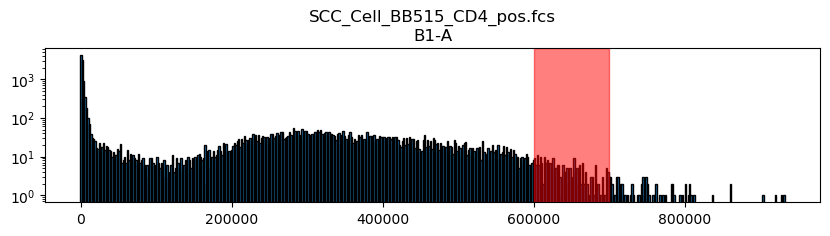

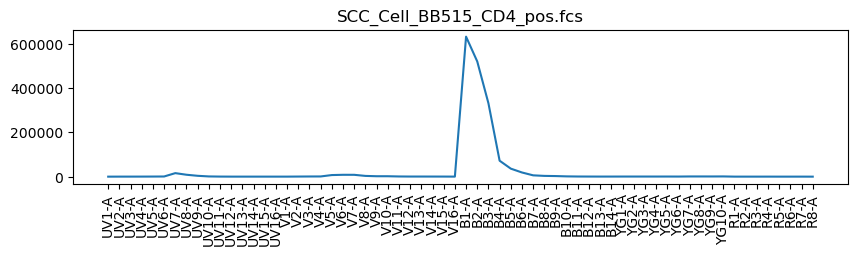

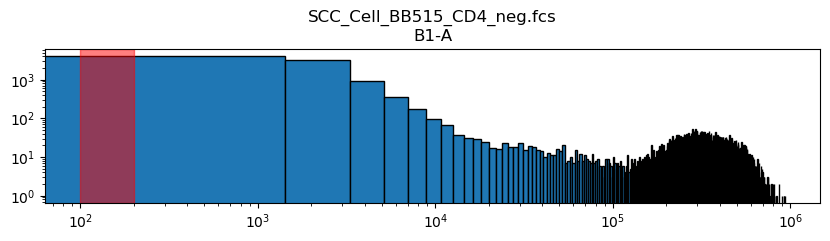

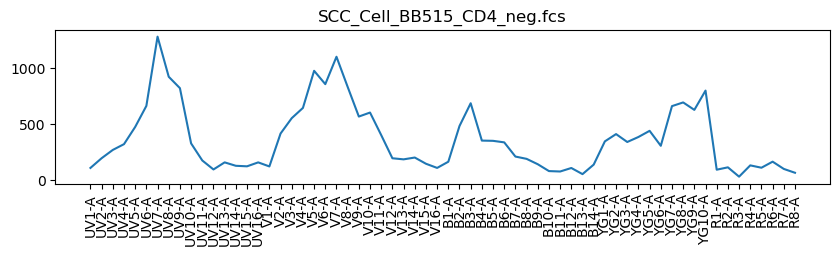

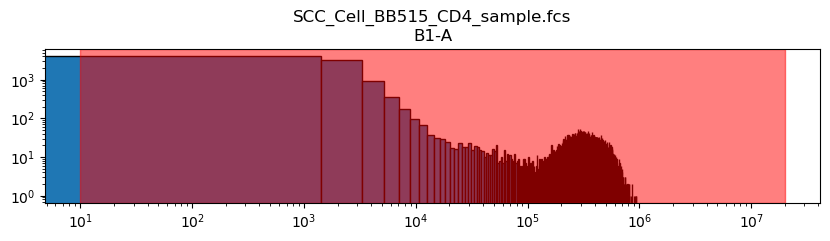

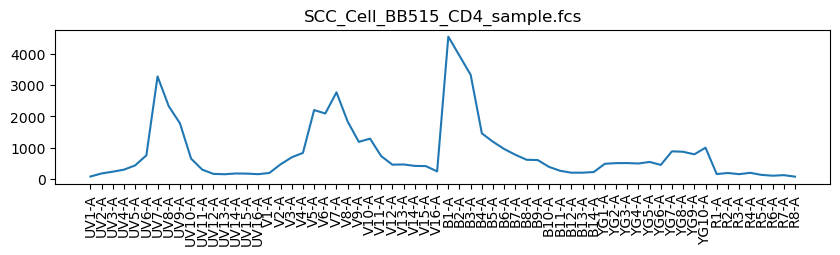

In [12]:
path = Data_dir+"/scc_Aurora5L/BB515.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B1-A'

min = 600000
max = 700000
filename = 'SCC_Cell_BB515_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BB515_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 20000000
filename = 'SCC_Cell_BB515_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

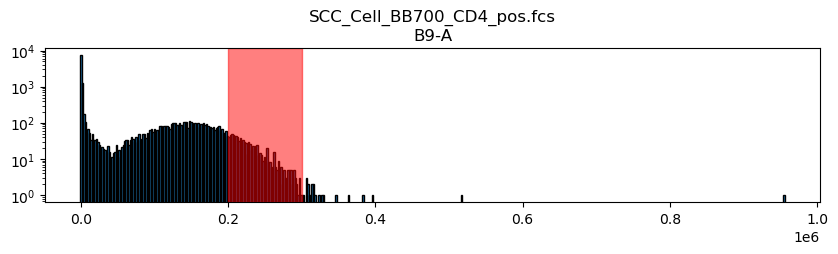

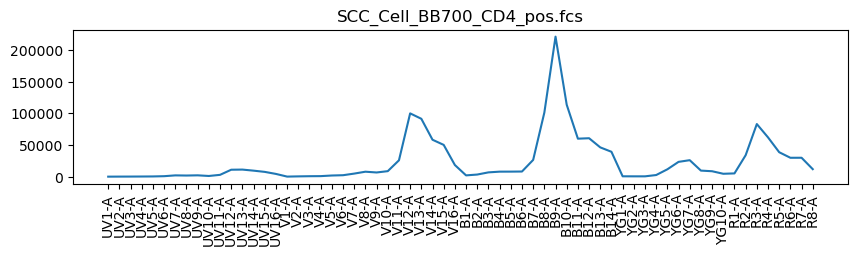

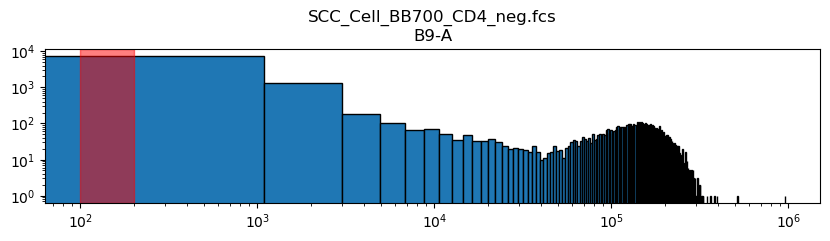

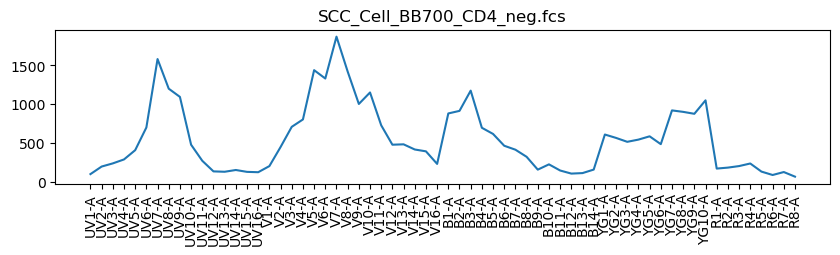

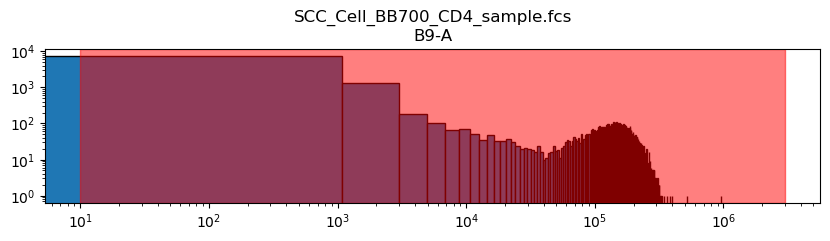

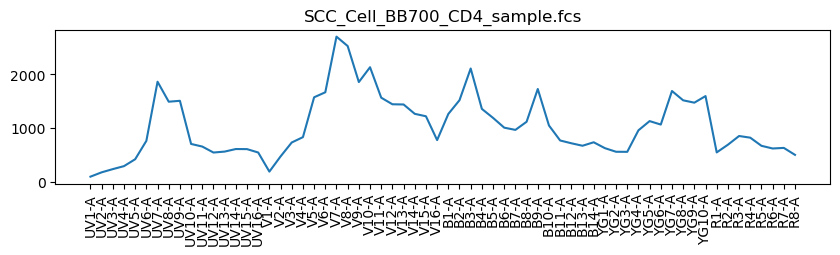

In [15]:
path = Data_dir+"/scc_Aurora5L/BB700.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B9-A'

min = 200000
max = 300000
filename = 'SCC_Cell_BB700_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BB700_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 3000000
filename = 'SCC_Cell_BB700_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

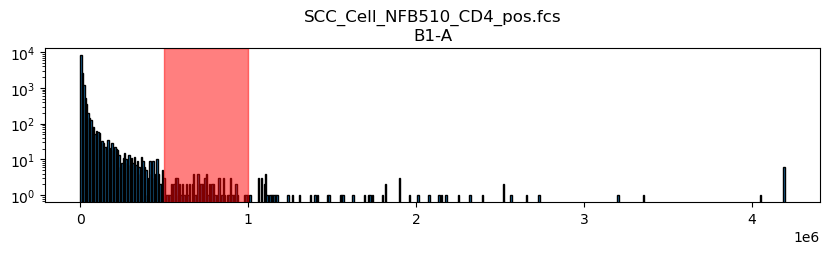

len(data_sub): 87


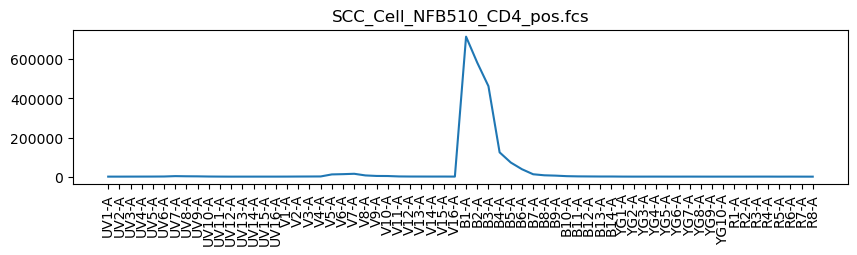

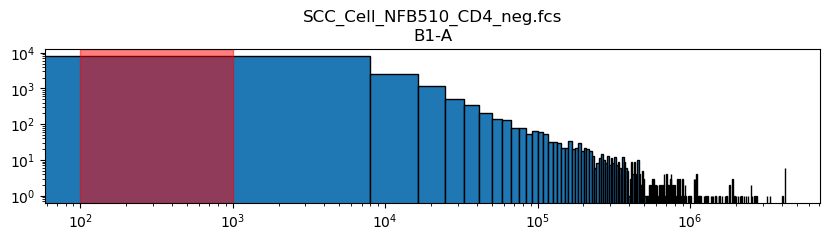

len(data_sub): 3236


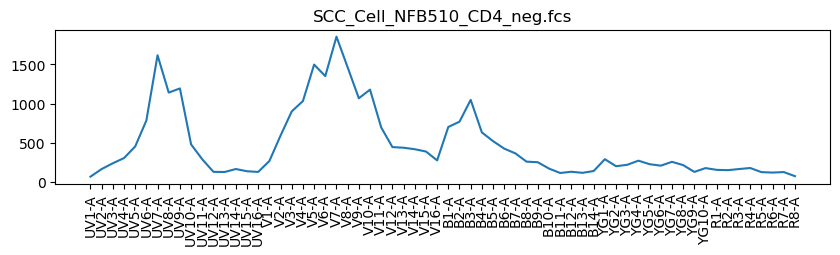

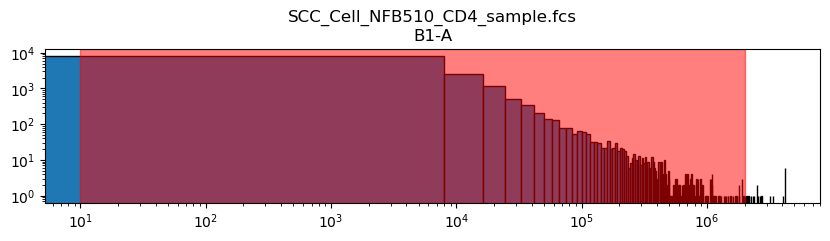

len(data_sub): 14425


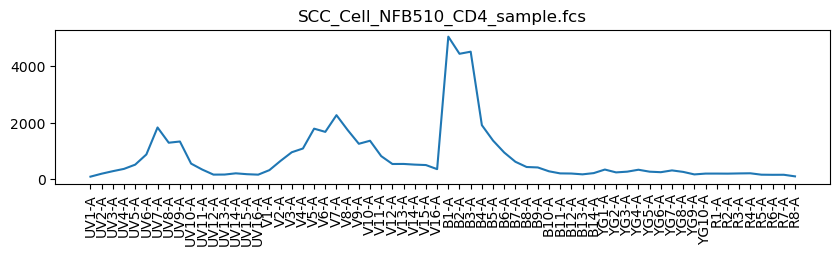

In [7]:
path = Data_dir+"/scc_Aurora5L/Blue510.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B1-A'

min = 500000
max = 1000000
filename = 'SCC_Cell_NFB510_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_NFB510_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFB510_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

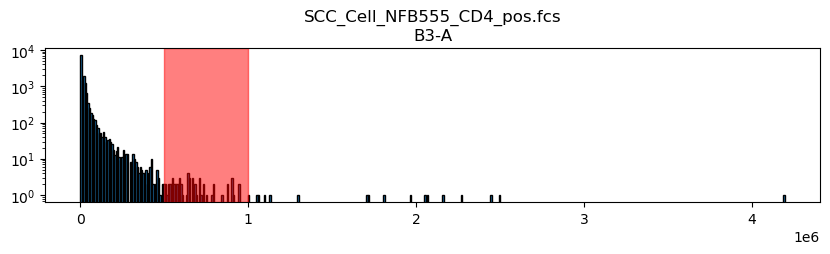

len(data_sub): 60


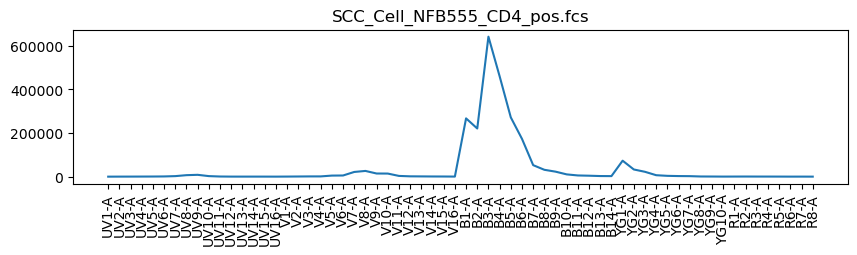

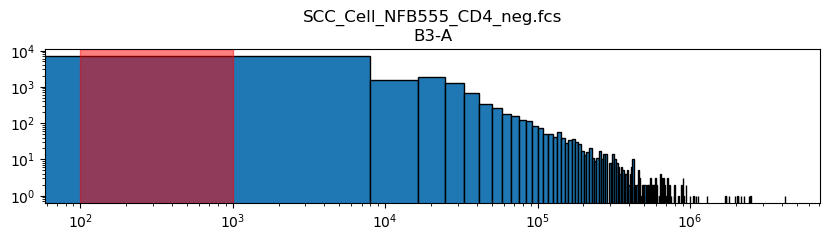

len(data_sub): 1166


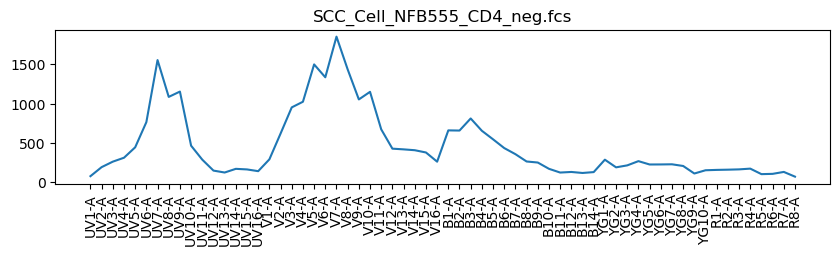

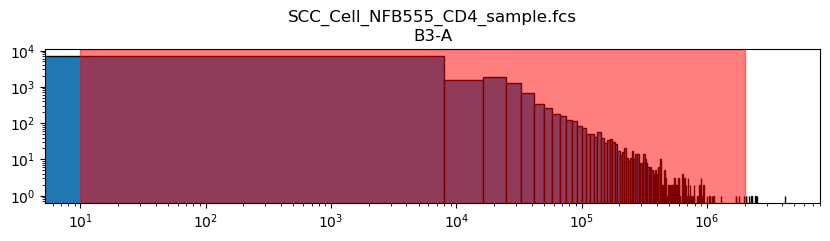

len(data_sub): 14607


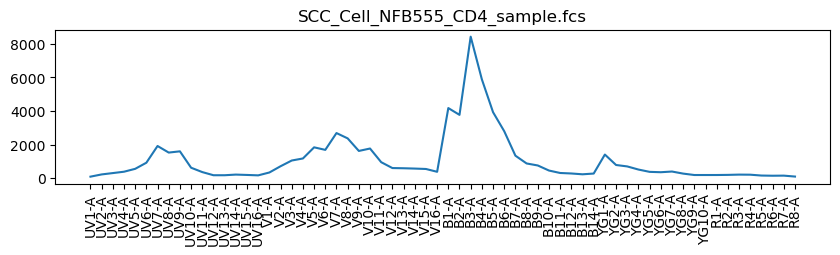

In [13]:
path = Data_dir+"/scc_Aurora5L/Blue555.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B3-A'

min = 500000
max = 1000000
filename = 'SCC_Cell_NFB555_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_NFB555_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFB555_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

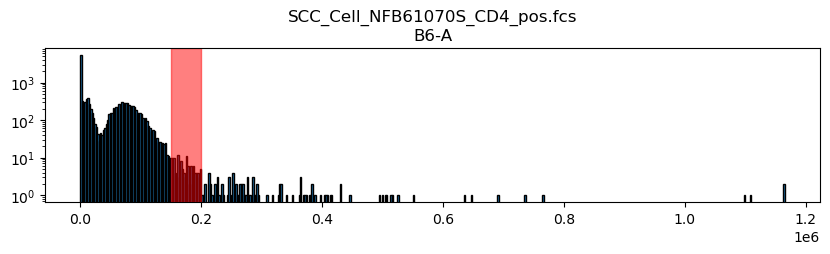

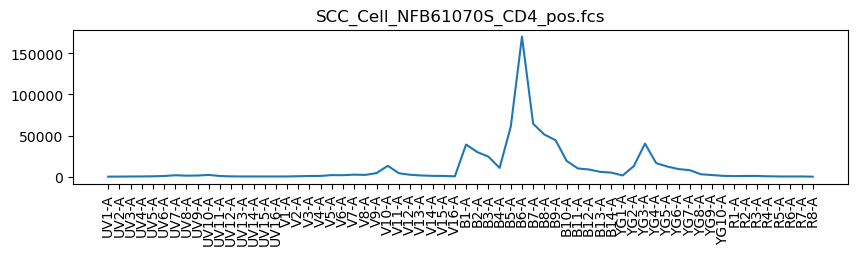

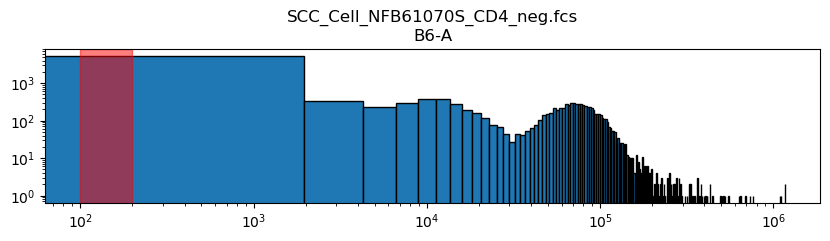

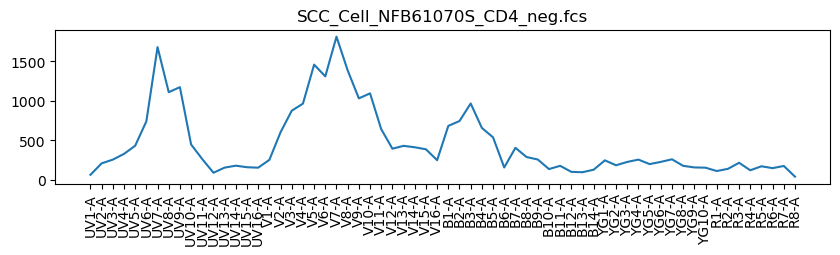

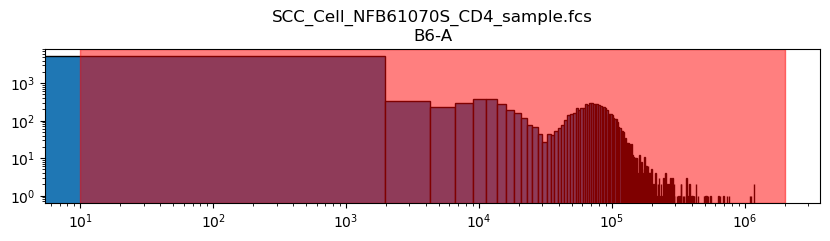

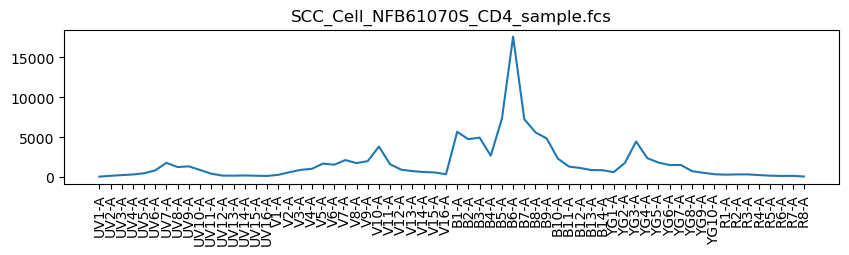

In [25]:
path = Data_dir+"/scc_Aurora5L/Blue61070S.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B6-A'

min = 150000
max = 200000
filename = 'SCC_Cell_NFB61070S_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_NFB61070S_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFB61070S_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

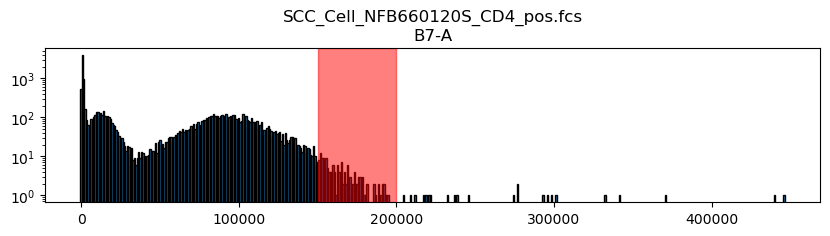

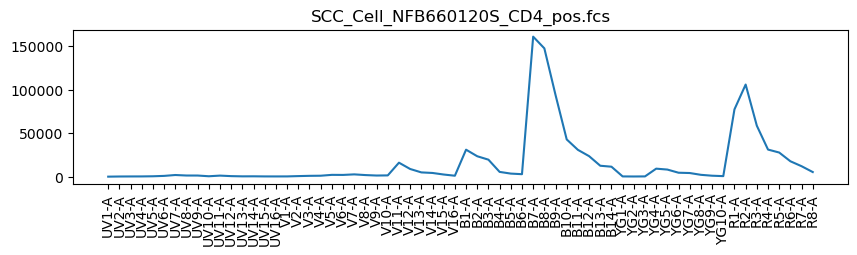

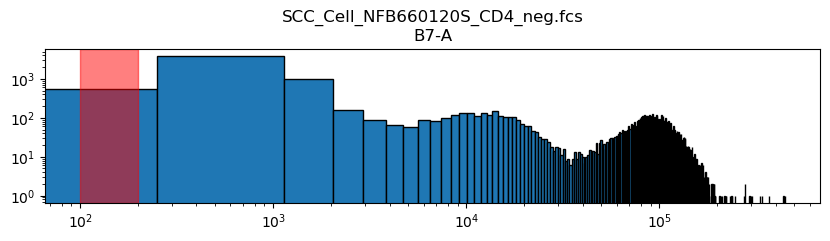

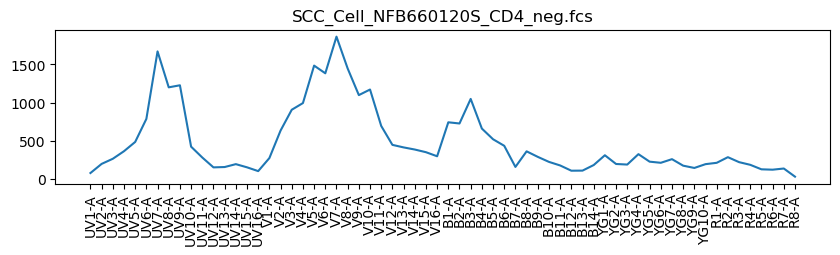

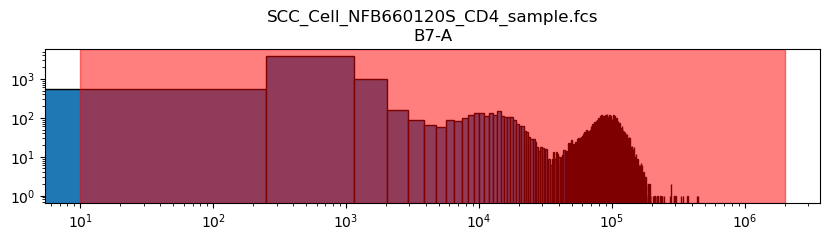

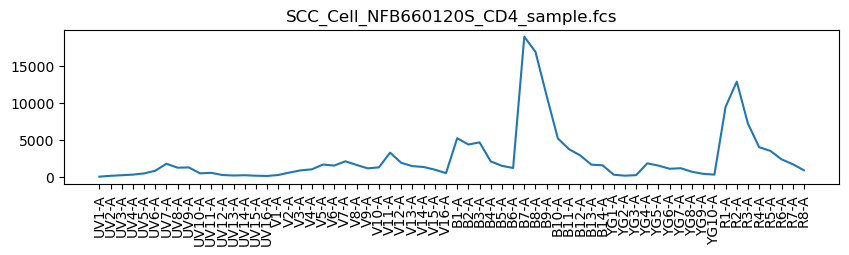

In [27]:
path = Data_dir+"/scc_Aurora5L/Blue660120S.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B7-A'

min = 150000
max = 200000
filename = 'SCC_Cell_NFB660120S_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_NFB660120S_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFB660120S_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

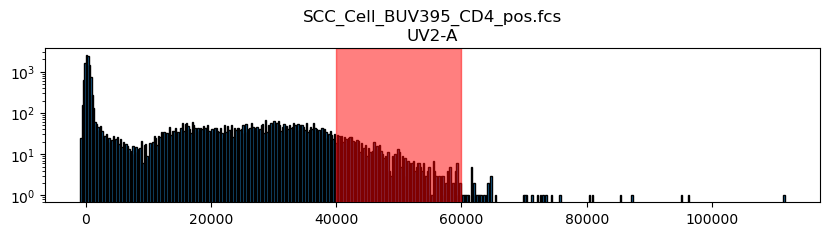

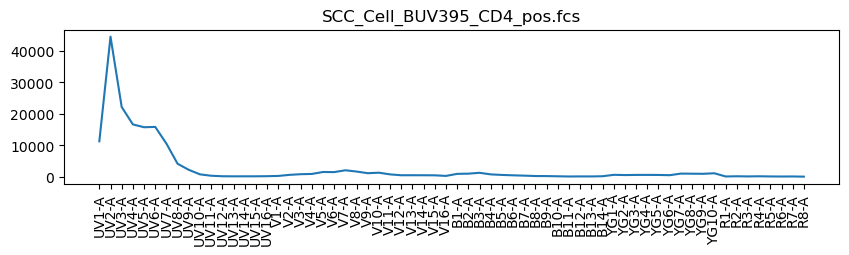

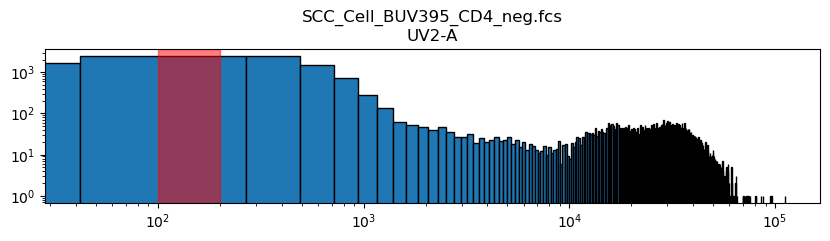

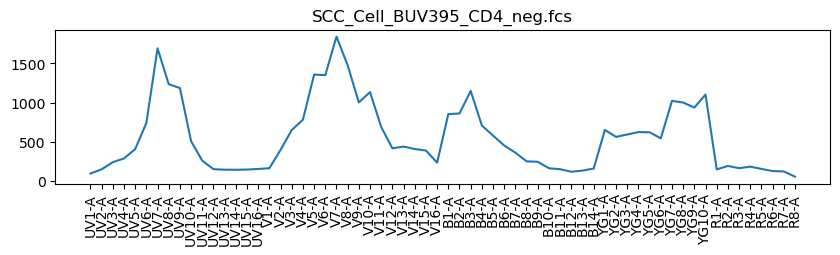

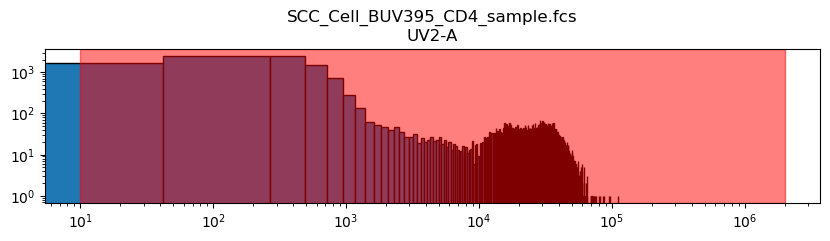

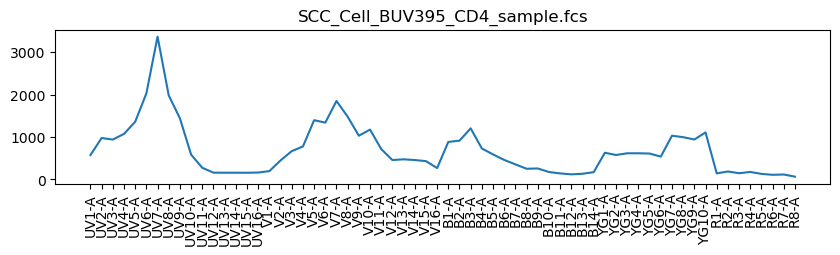

In [30]:
path = Data_dir+"/scc_Aurora5L/BUV395.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'UV2-A'

min = 40000
max = 60000
filename = 'SCC_Cell_BUV395_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BUV395_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BUV395_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

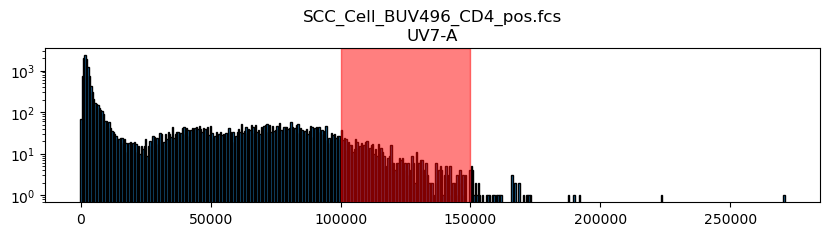

len(data_sub): 769


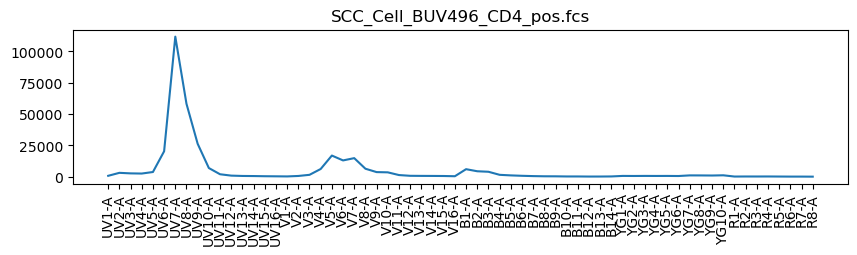

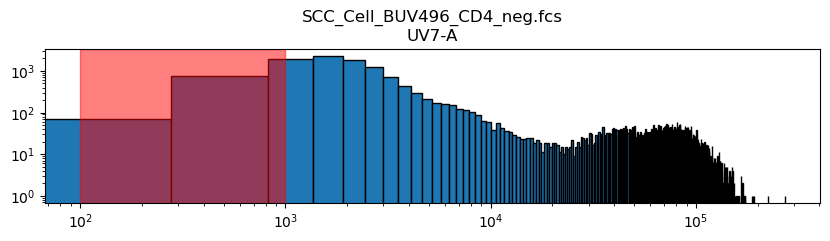

len(data_sub): 1329


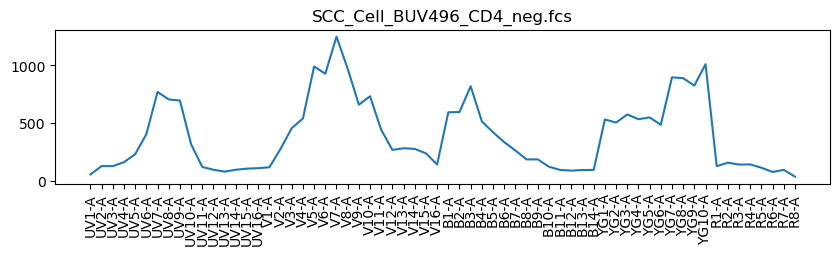

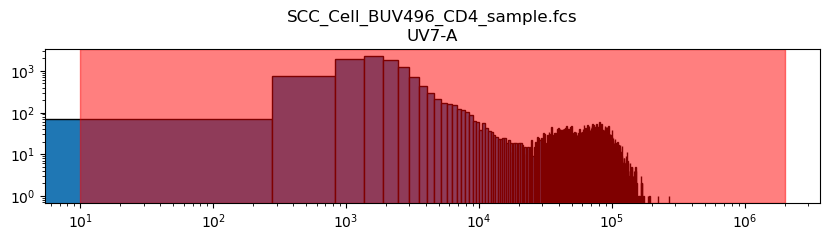

len(data_sub): 17146


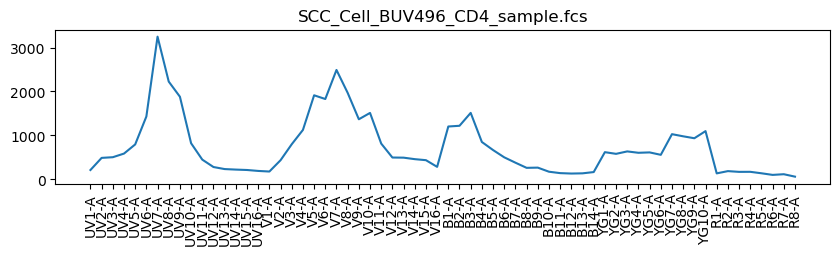

In [14]:
path = Data_dir+"/scc_Aurora5L/BUV496.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'UV7-A'

min = 100000
max = 150000
filename = 'SCC_Cell_BUV496_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_BUV496_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BUV496_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

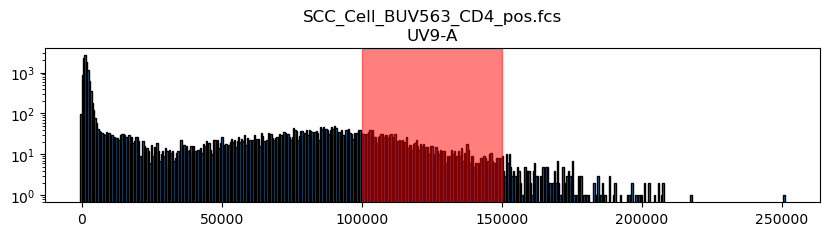

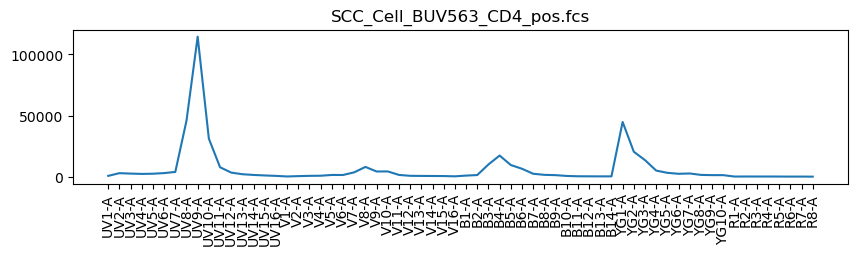

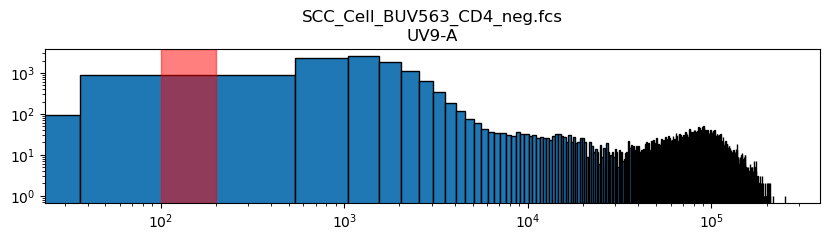

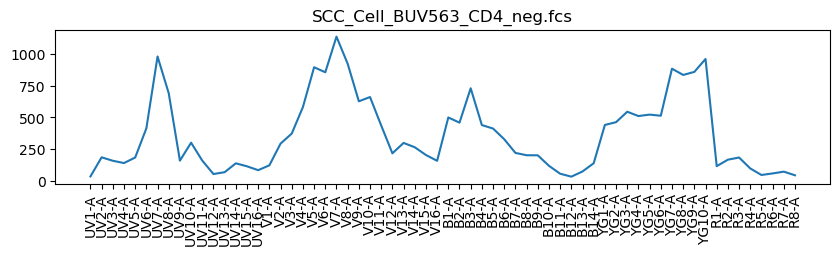

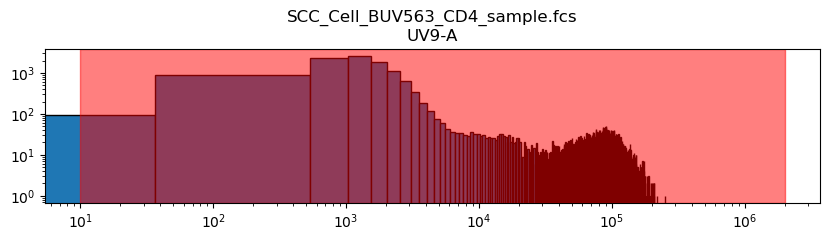

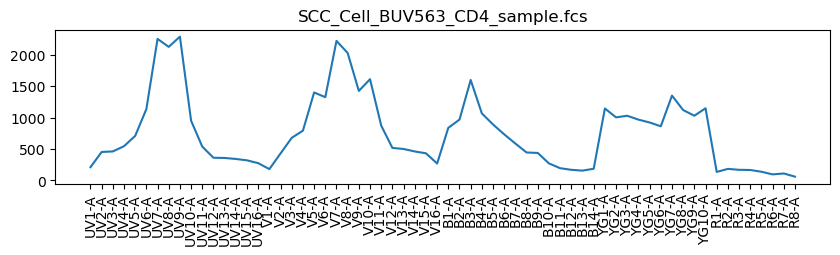

In [34]:
path = Data_dir+"/scc_Aurora5L/BUV563.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'UV9-A'

min = 100000
max = 150000
filename = 'SCC_Cell_BUV563_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BUV563_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BUV563_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

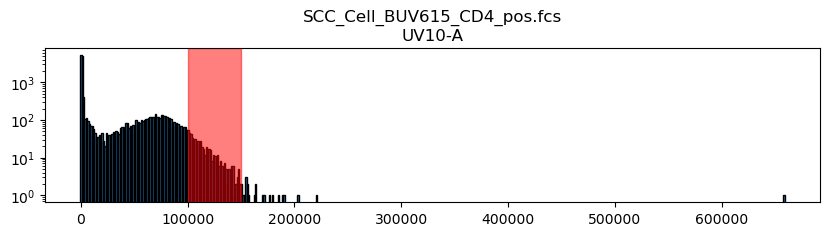

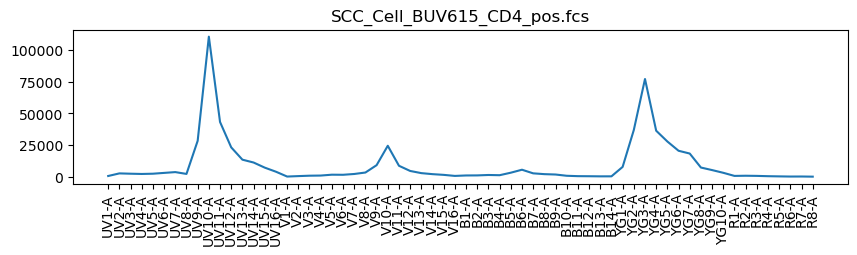

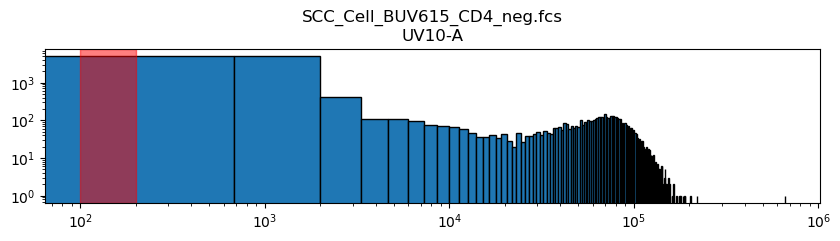

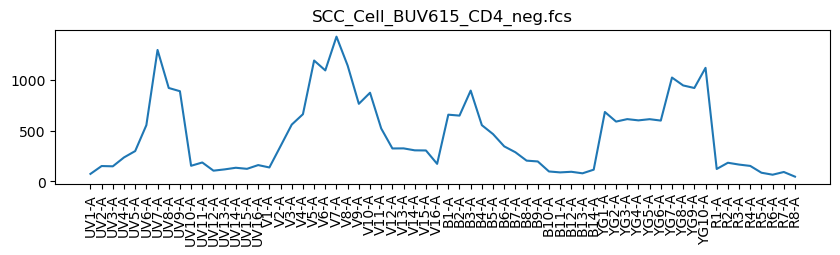

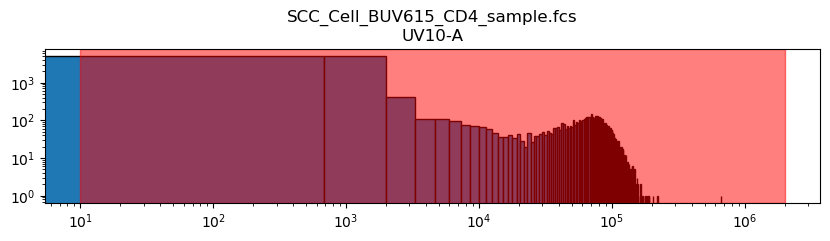

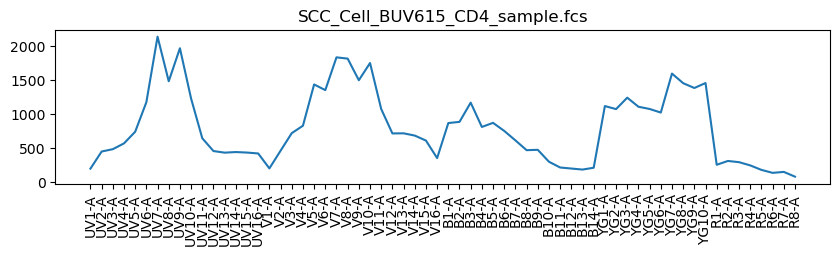

In [37]:
path = Data_dir+"/scc_Aurora5L/BUV615.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'UV10-A'

min = 100000
max = 150000
filename = 'SCC_Cell_BUV615_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BUV615_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BUV615_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

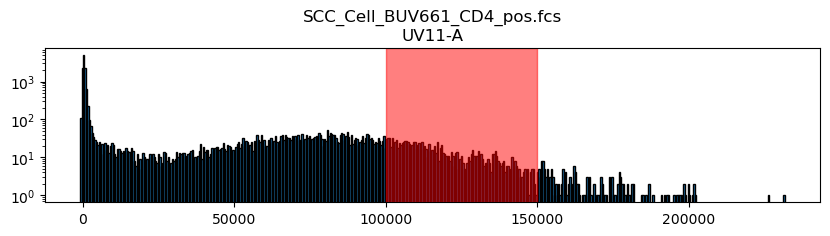

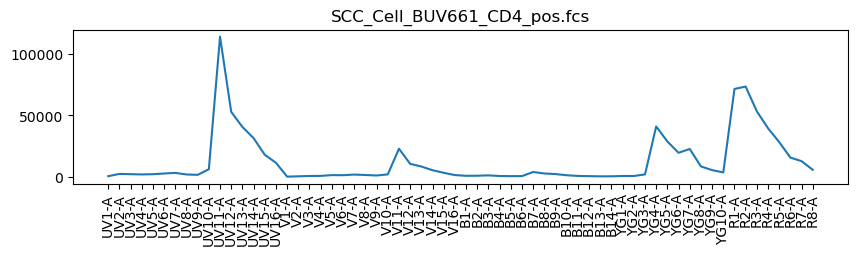

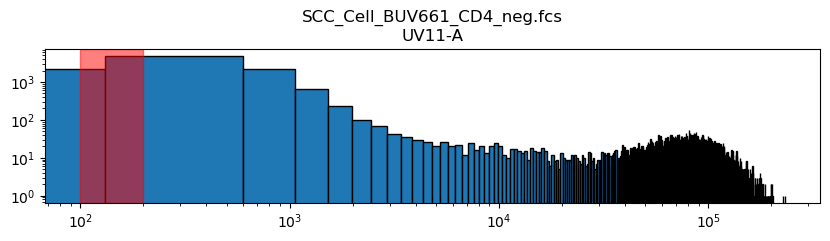

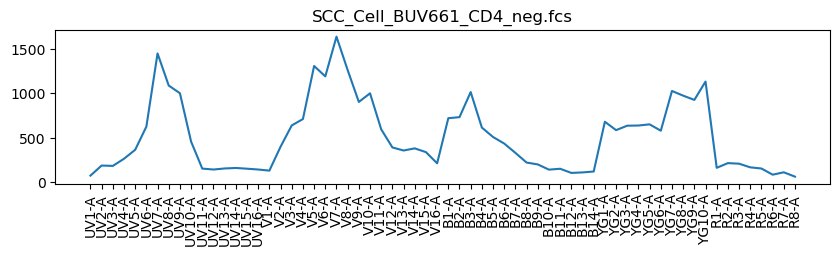

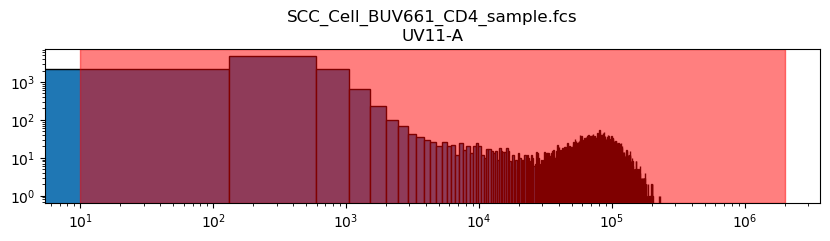

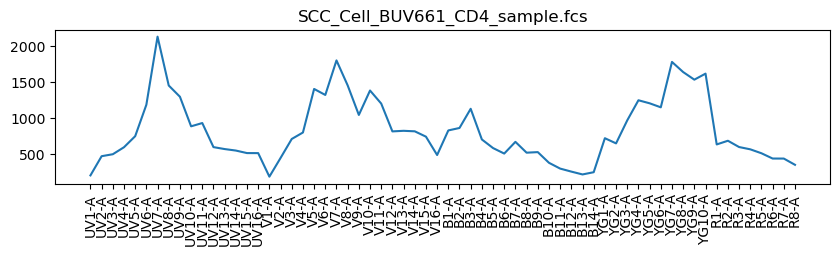

In [39]:
path = Data_dir+"/scc_Aurora5L/BUV661.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'UV11-A'

min = 100000
max = 150000
filename = 'SCC_Cell_BUV661_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BUV661_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BUV661_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

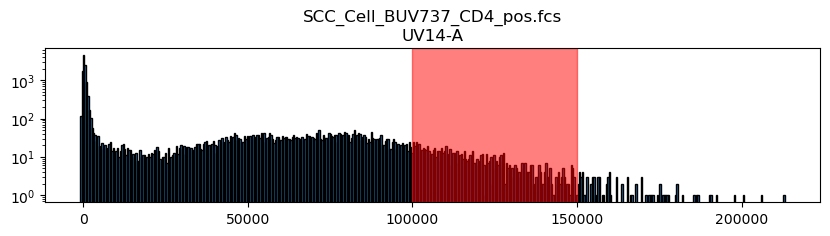

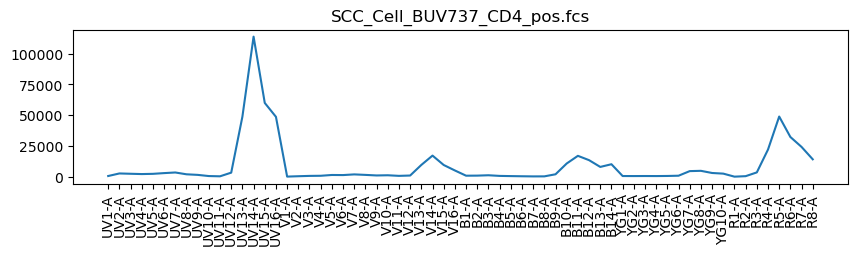

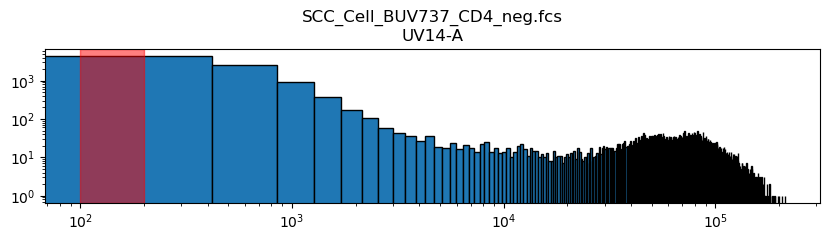

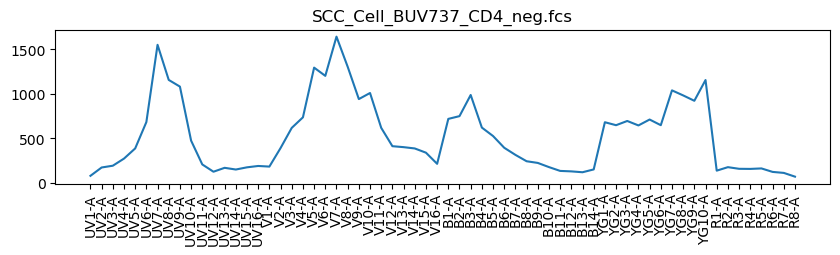

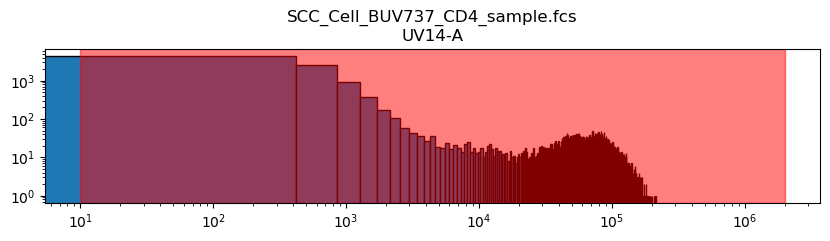

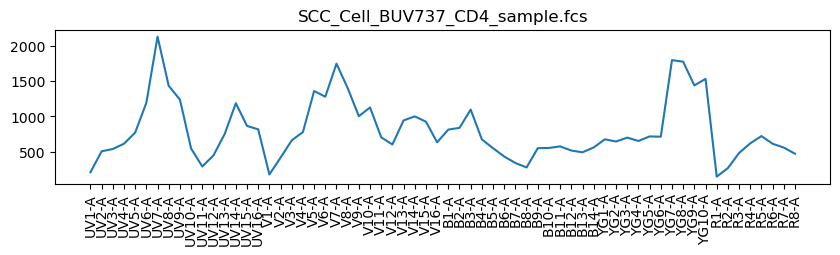

In [41]:
path = Data_dir+"/scc_Aurora5L/BUV737.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'UV14-A'

min = 100000
max = 150000
filename = 'SCC_Cell_BUV737_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BUV737_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BUV737_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

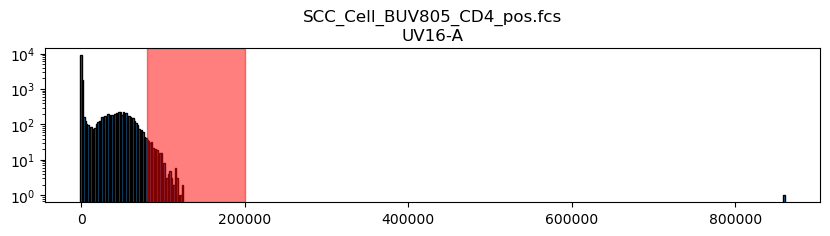

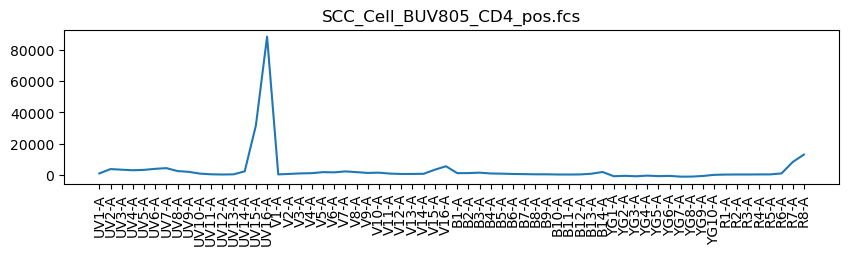

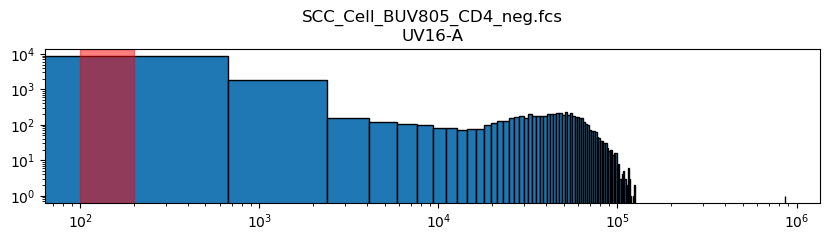

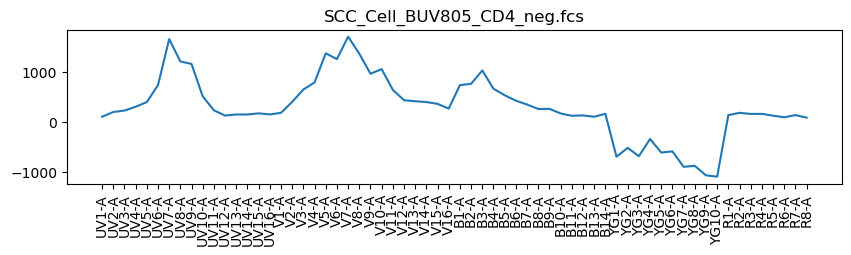

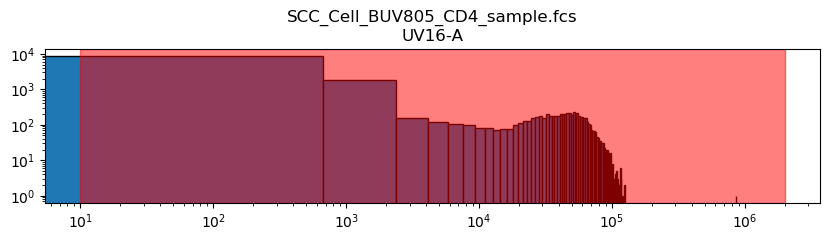

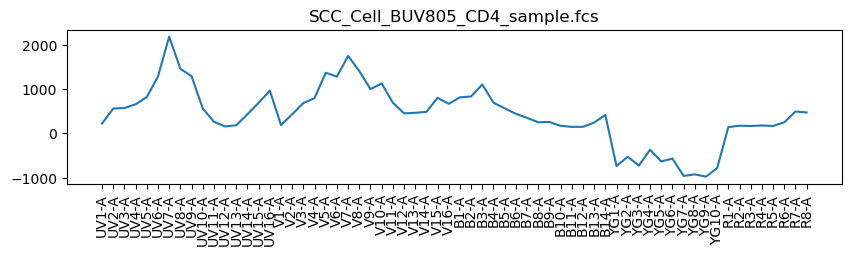

In [45]:
path = Data_dir+"/scc_Aurora5L/BUV805.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'UV16-A'

min = 80000
max = 200000
filename = 'SCC_Cell_BUV805_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BUV805_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BUV805_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

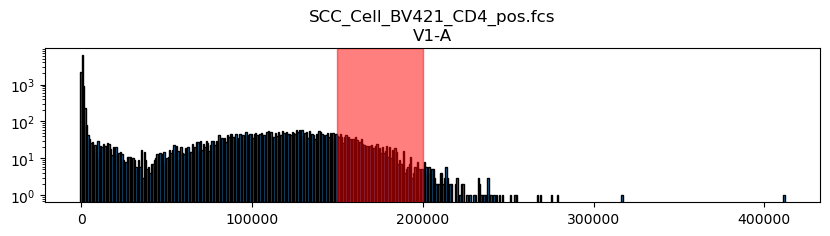

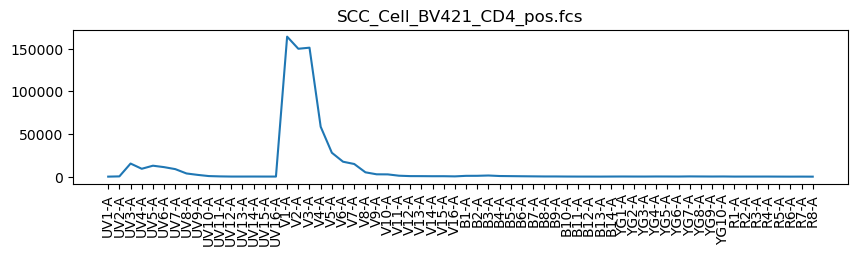

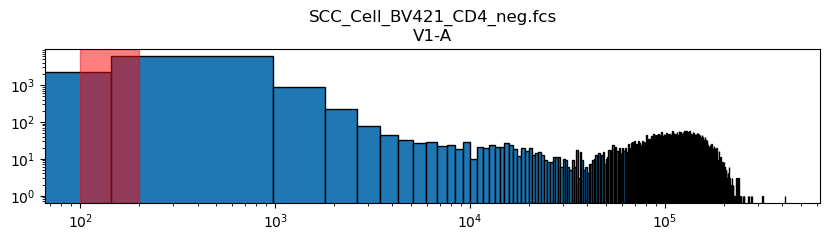

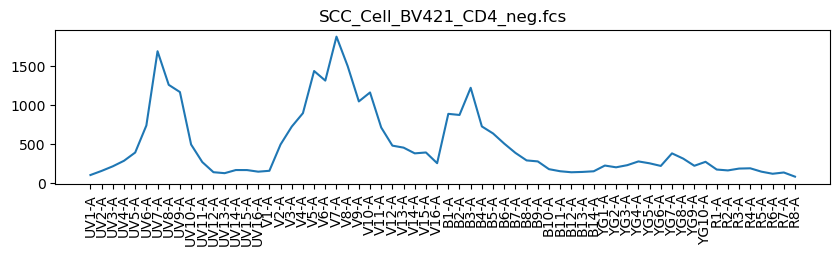

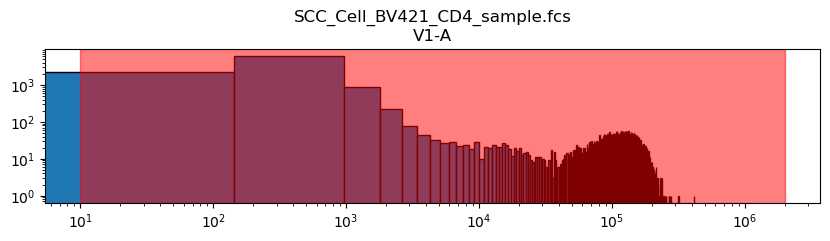

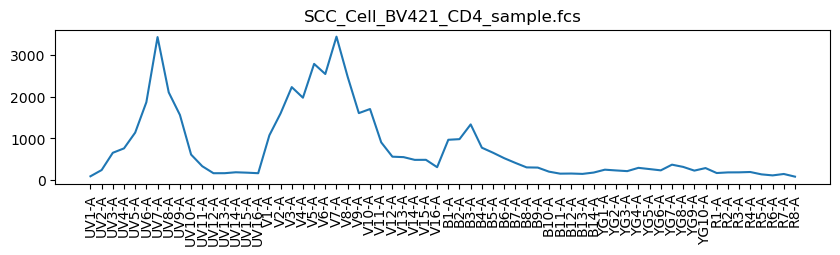

In [47]:
path = Data_dir+"/scc_Aurora5L/BV421.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V1-A'

min = 150000
max = 200000
filename = 'SCC_Cell_BV421_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BV421_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BV421_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

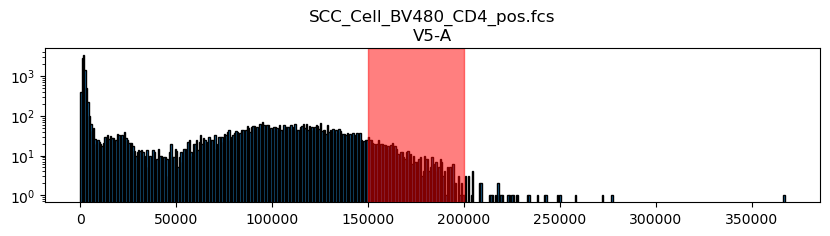

len(data_sub): 699


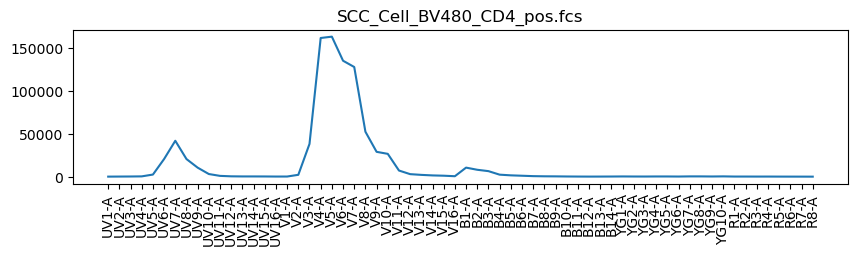

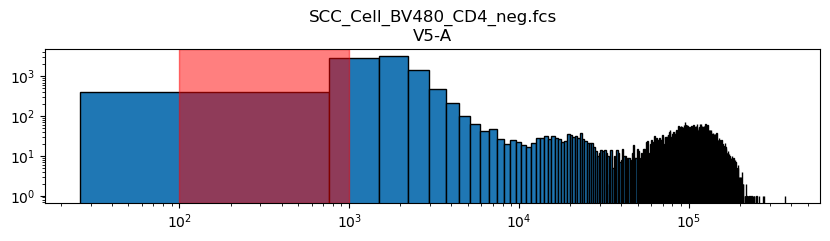

len(data_sub): 998


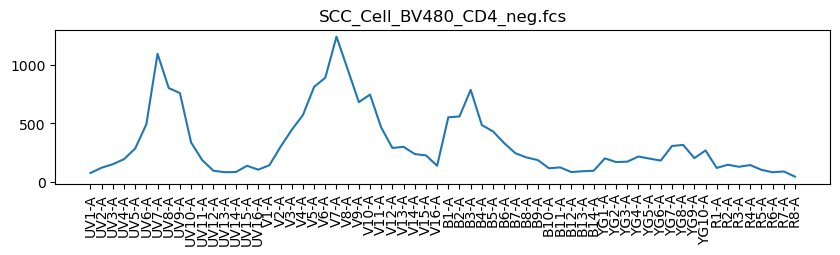

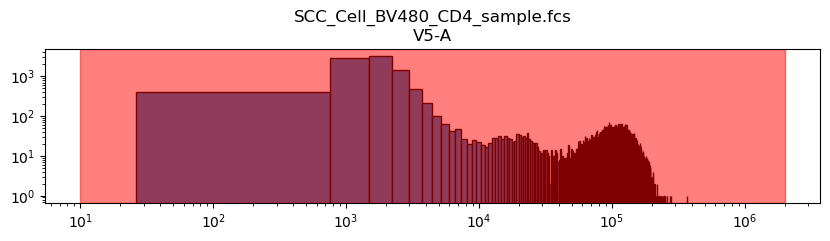

len(data_sub): 16031


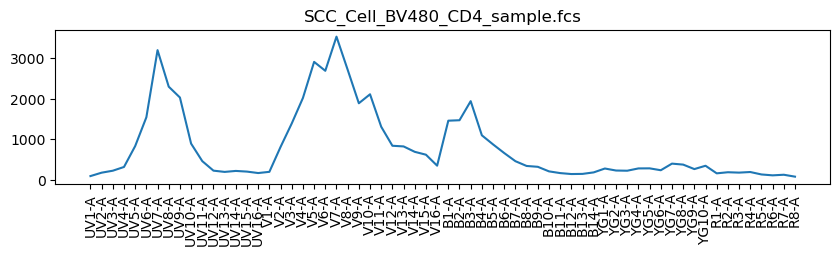

In [10]:
path = Data_dir+"/scc_Aurora5L/BV480.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V5-A'

min = 150000
max = 200000
filename = 'SCC_Cell_BV480_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_BV480_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BV480_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

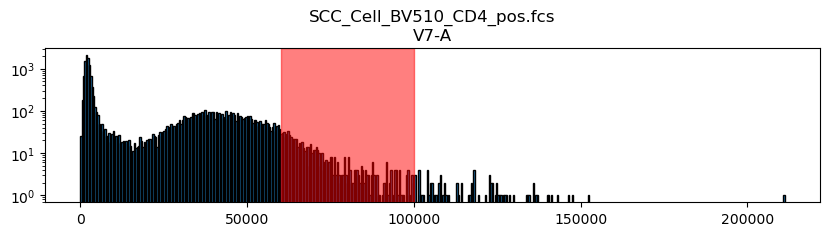

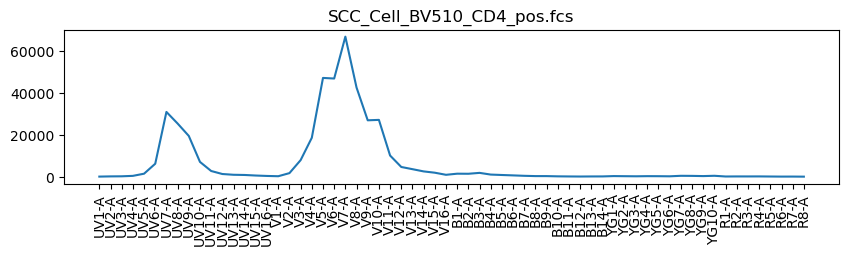

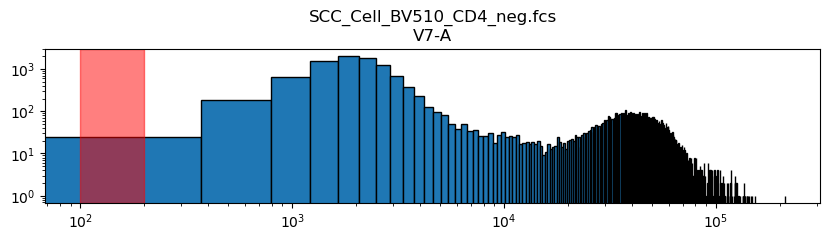

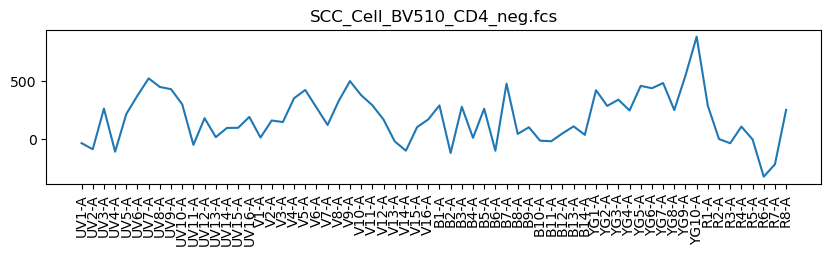

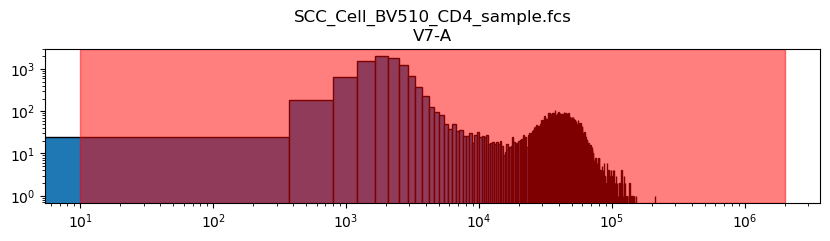

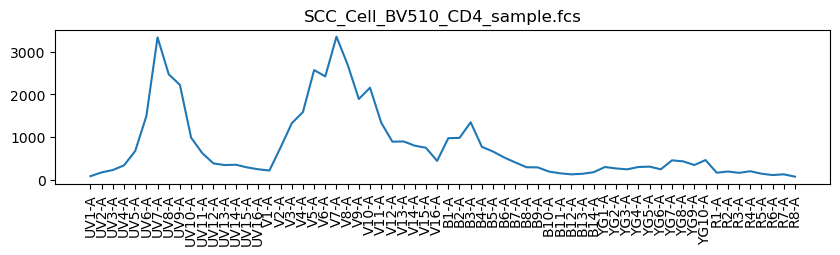

In [51]:
path = Data_dir+"/scc_Aurora5L/BV510.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V7-A'

min = 60000
max = 100000
filename = 'SCC_Cell_BV510_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BV510_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BV510_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

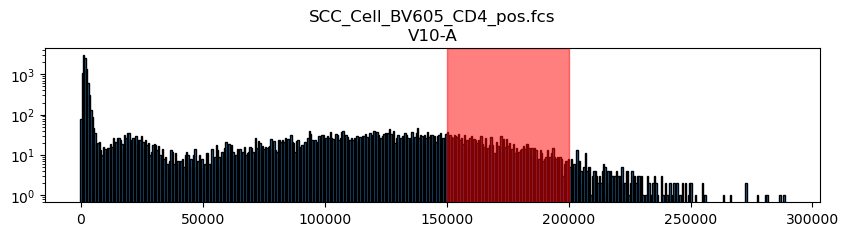

len(data_sub): 1485


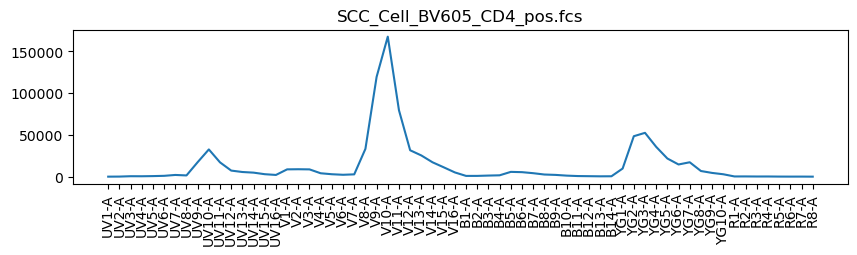

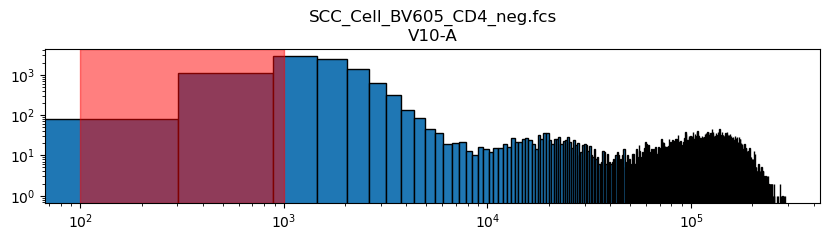

len(data_sub): 1651


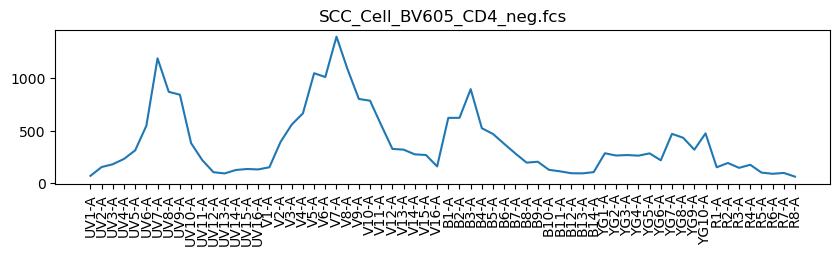

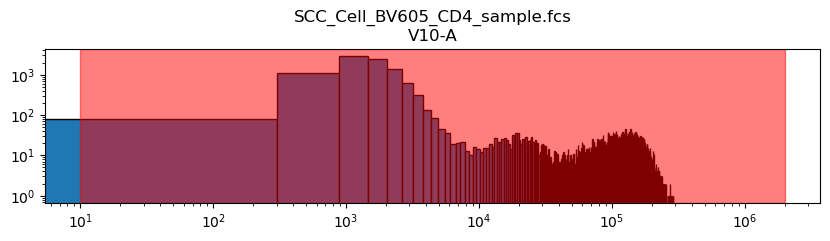

len(data_sub): 16218


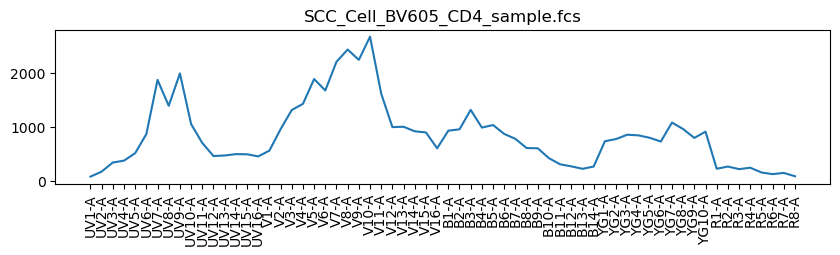

In [15]:
path = Data_dir+"/scc_Aurora5L/BV605.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V10-A'

min = 150000
max = 200000
filename = 'SCC_Cell_BV605_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_BV605_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BV605_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

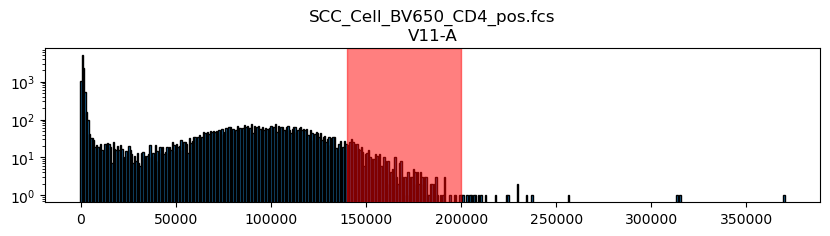

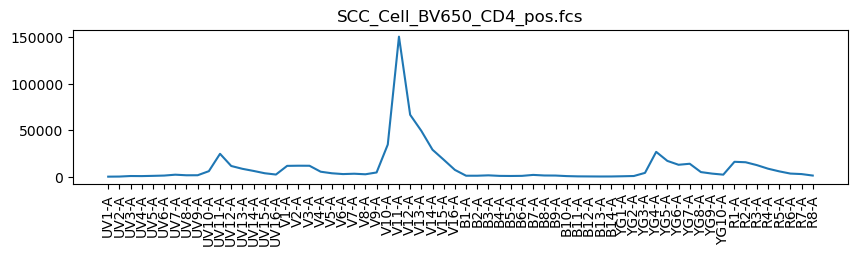

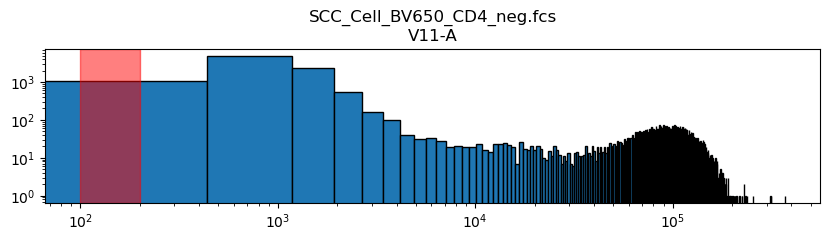

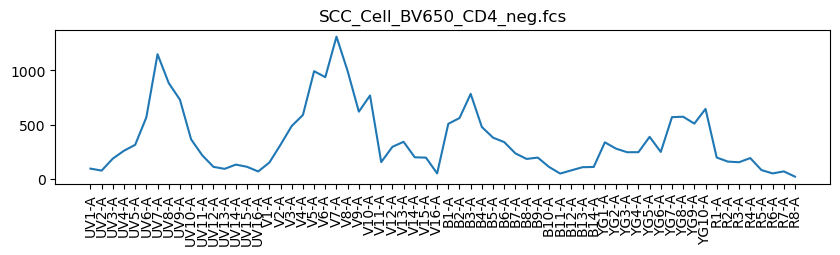

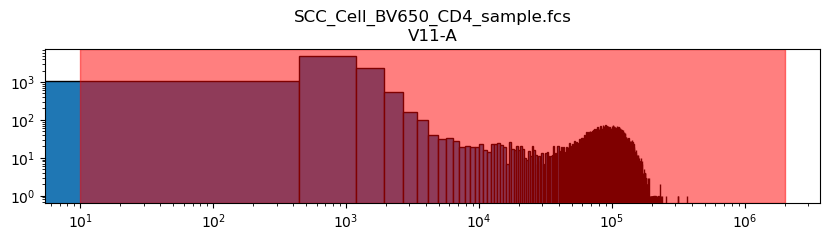

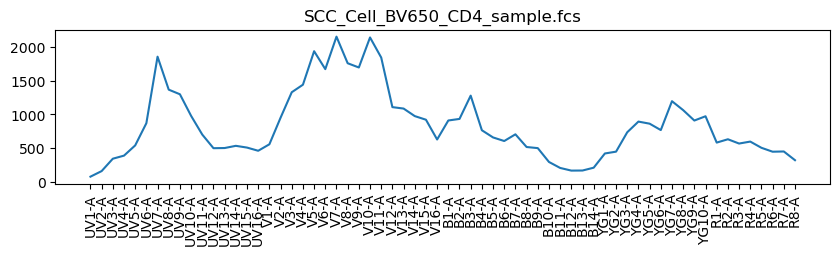

In [55]:
path = Data_dir+"/scc_Aurora5L/BV650.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V11-A'

min = 140000
max = 200000
filename = 'SCC_Cell_BV650_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BV650_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BV650_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

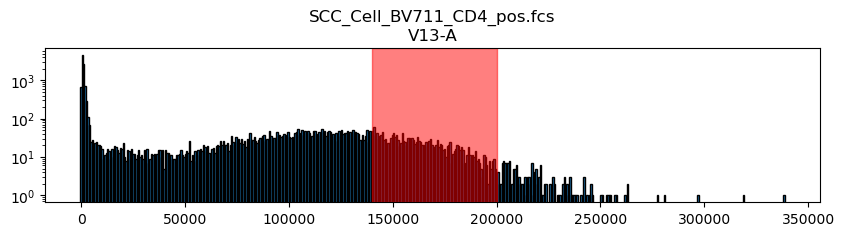

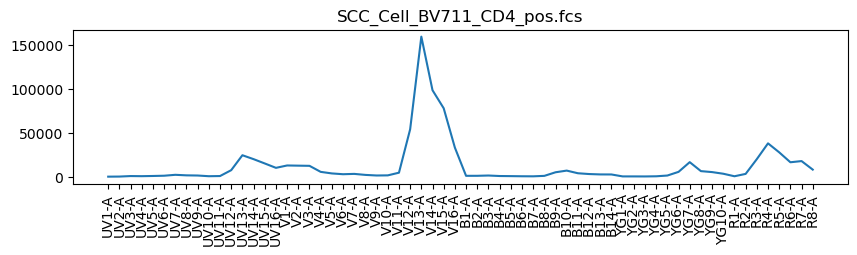

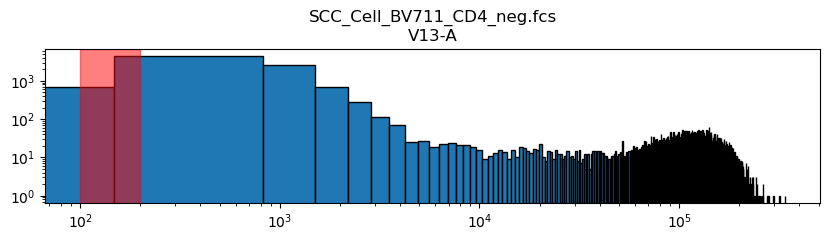

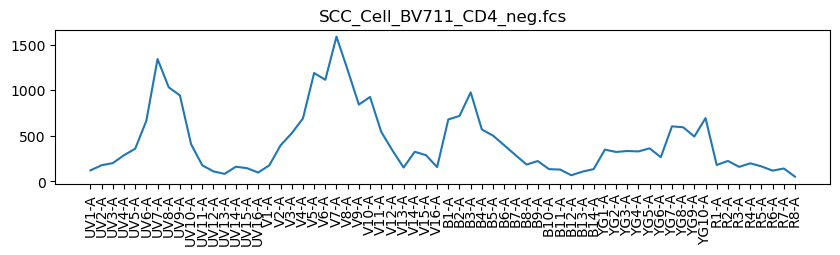

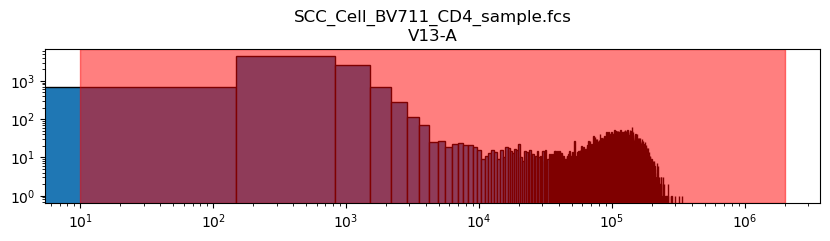

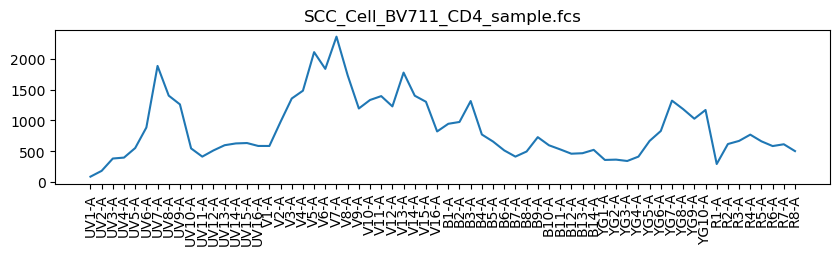

In [57]:
path = Data_dir+"/scc_Aurora5L/BV711.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V13-A'

min = 140000
max = 200000
filename = 'SCC_Cell_BV711_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BV711_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BV711_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

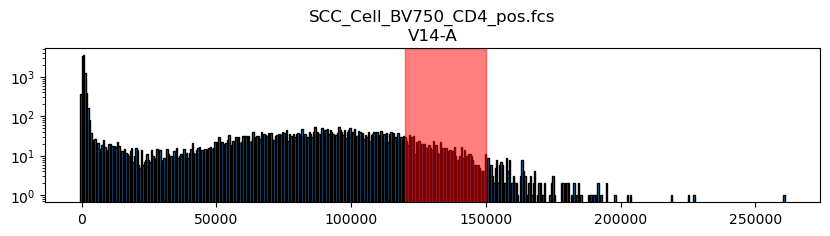

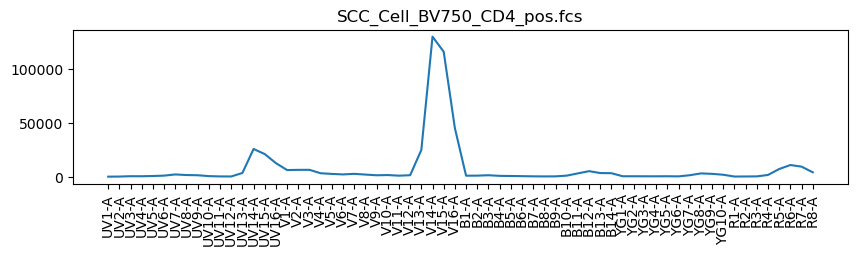

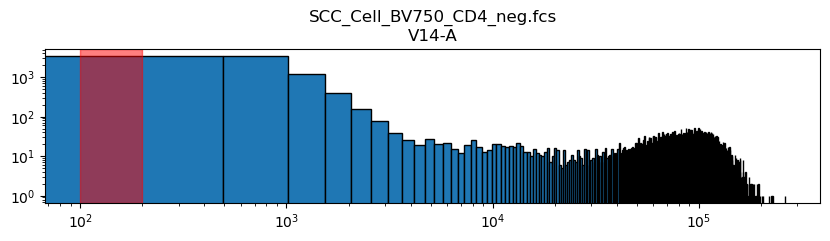

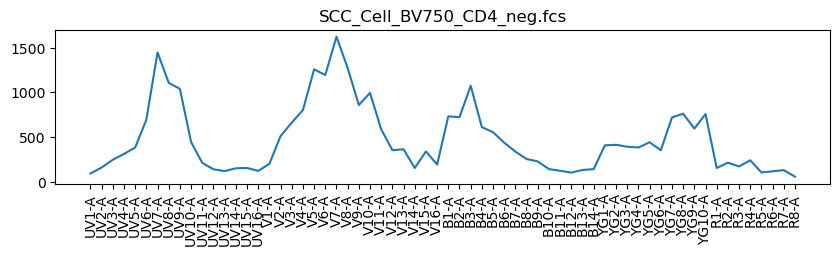

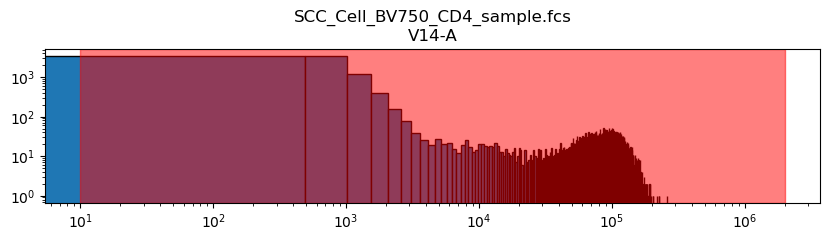

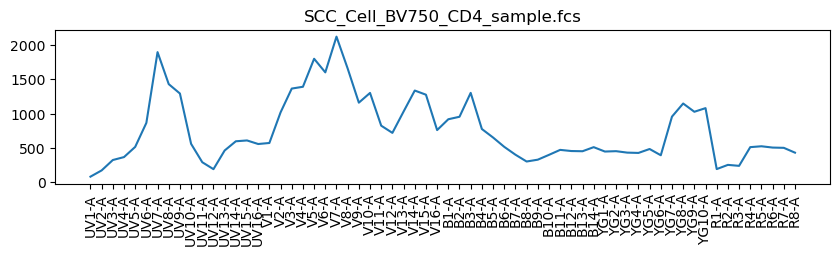

In [59]:
path = Data_dir+"/scc_Aurora5L/BV750.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V14-A'

min = 120000
max = 150000
filename = 'SCC_Cell_BV750_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BV750_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BV750_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

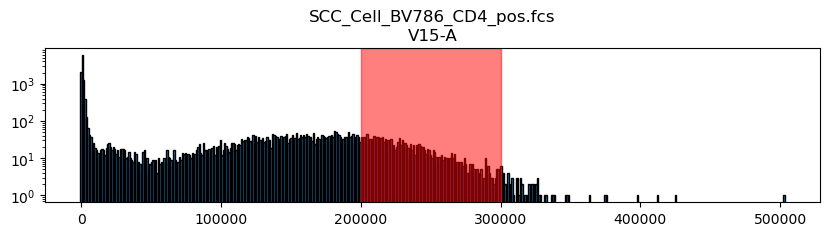

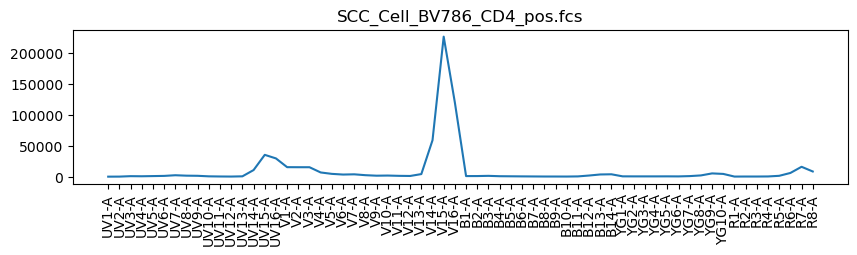

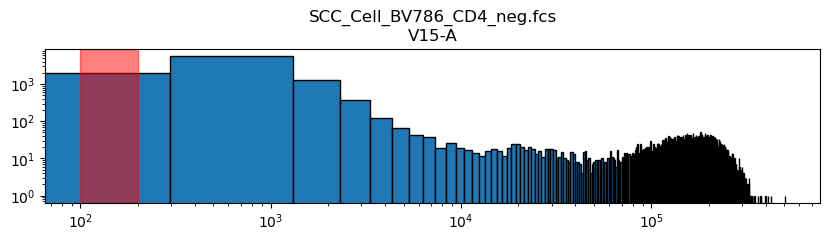

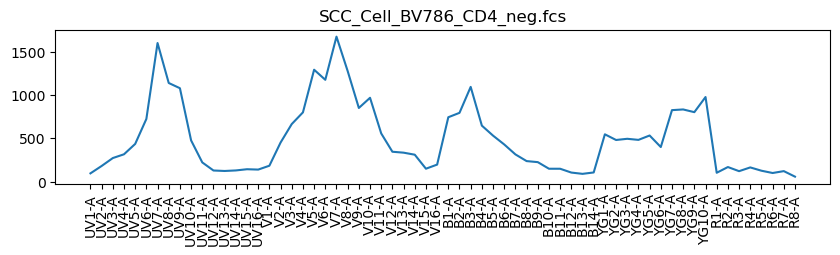

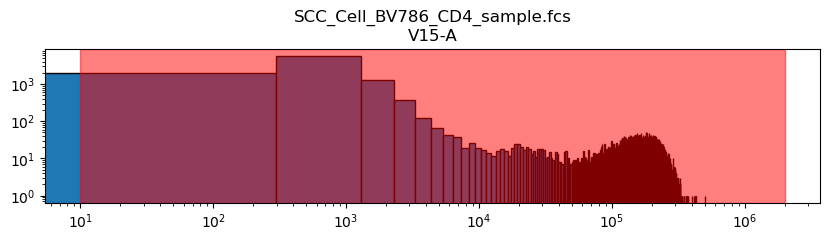

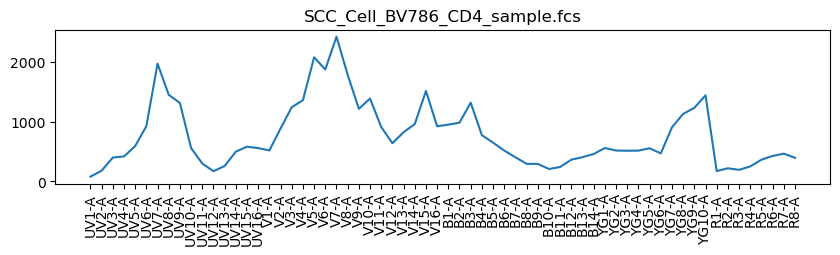

In [61]:
path = Data_dir+"/scc_Aurora5L/BV786.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V15-A'

min = 200000
max = 300000
filename = 'SCC_Cell_BV786_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_BV786_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_BV786_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

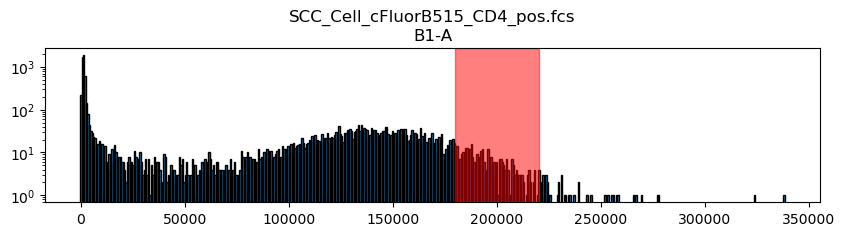

len(data_sub): 344


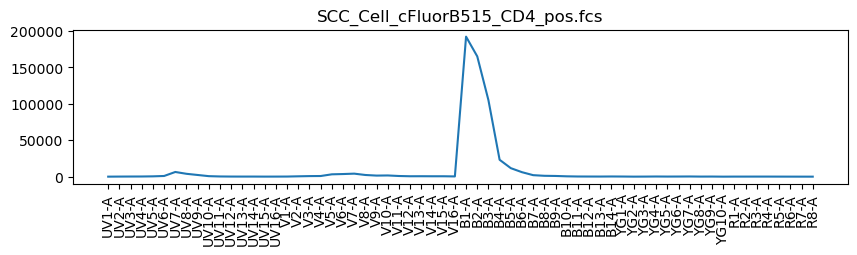

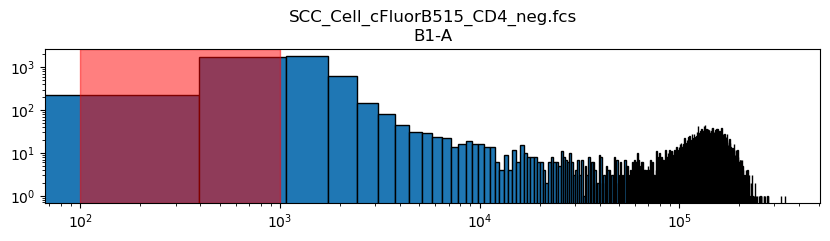

len(data_sub): 1650


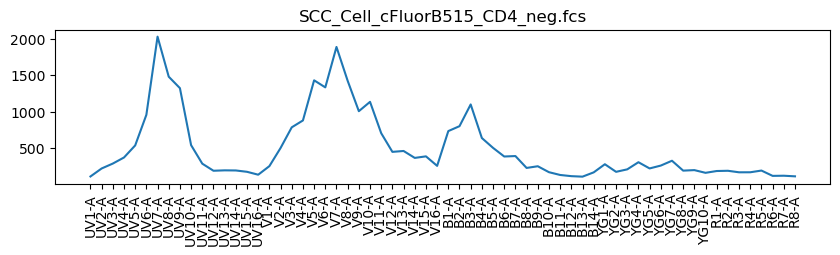

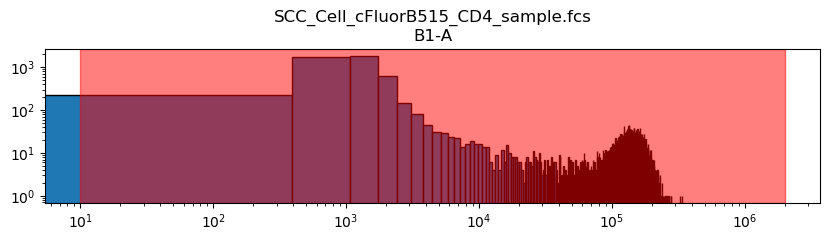

len(data_sub): 8952


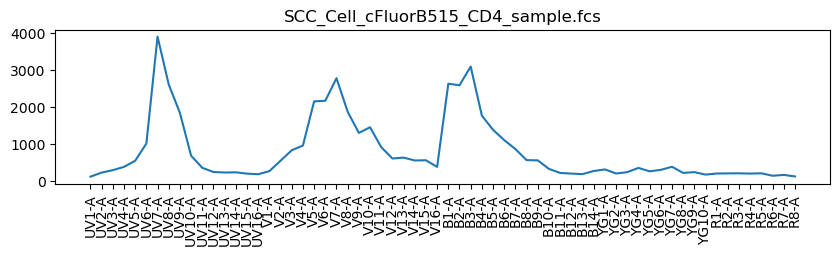

In [16]:
path = Data_dir+"/scc_Aurora5L/cFluorB515.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B1-A'

min = 180000
max = 220000
filename = 'SCC_Cell_cFluorB515_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_cFluorB515_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorB515_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

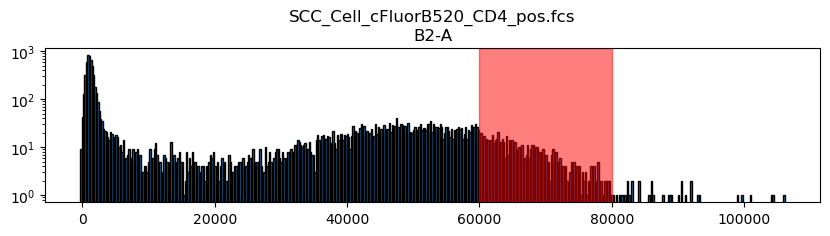

len(data_sub): 684


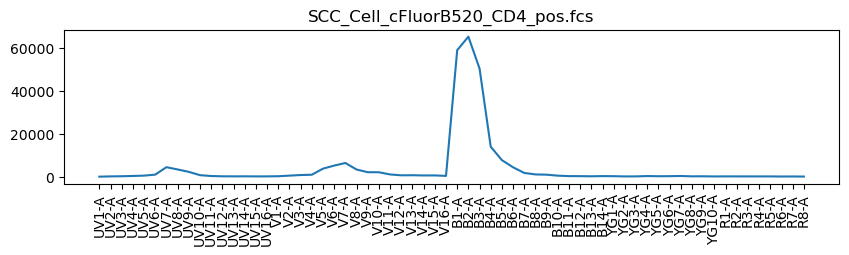

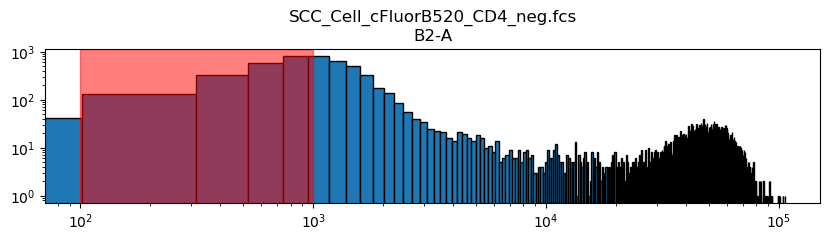

len(data_sub): 2049


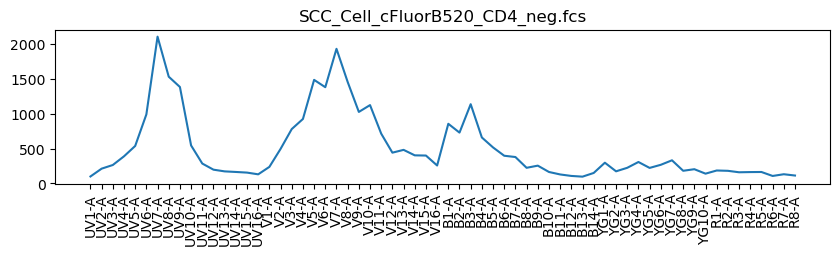

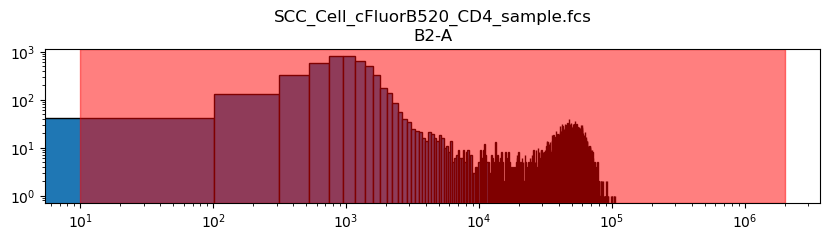

len(data_sub): 9030


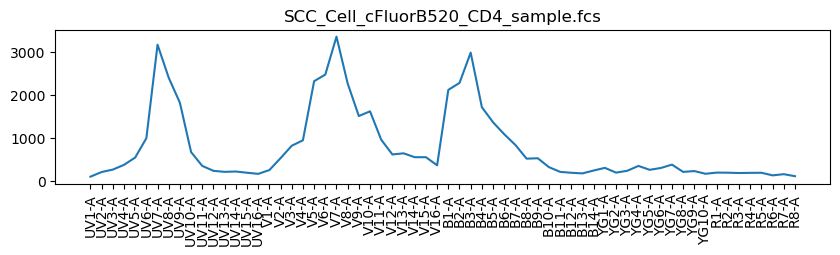

In [20]:
path = Data_dir+"/scc_Aurora5L/cFluorB520.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B2-A'

min = 60000
max = 80000
filename = 'SCC_Cell_cFluorB520_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_cFluorB520_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorB520_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

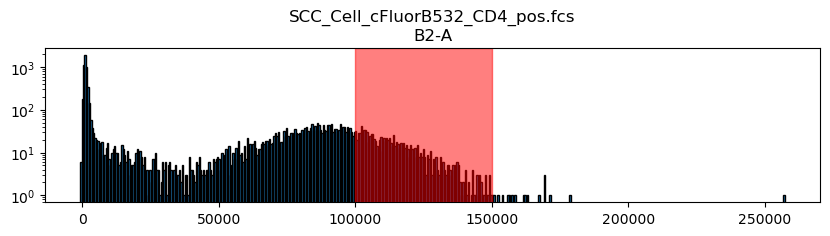

len(data_sub): 1091


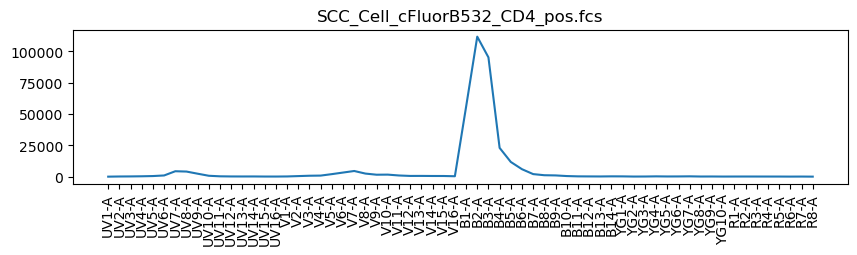

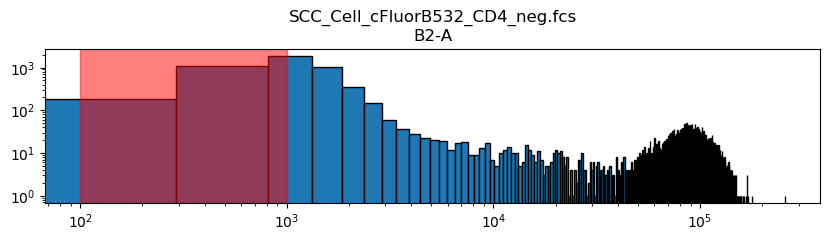

len(data_sub): 1953


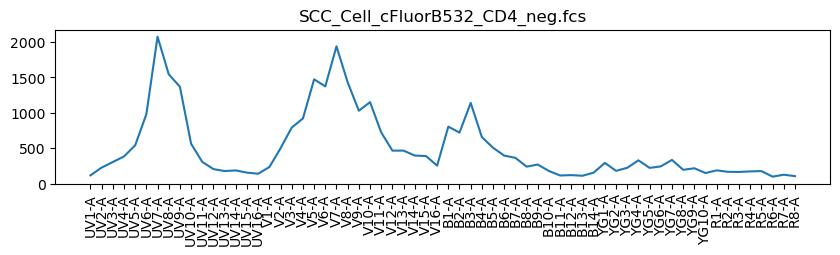

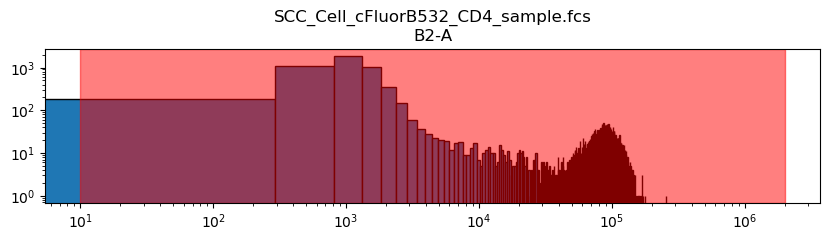

len(data_sub): 8893


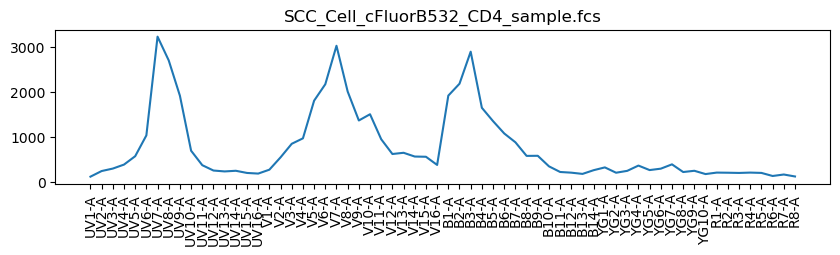

In [18]:
path = Data_dir+"/scc_Aurora5L/cFluorB532.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B2-A'

min = 100000
max = 150000
filename = 'SCC_Cell_cFluorB532_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_cFluorB532_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorB532_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

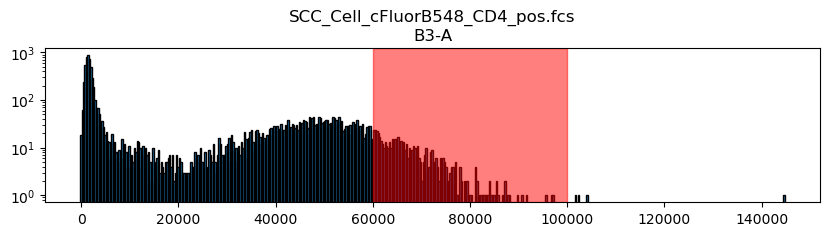

len(data_sub): 587


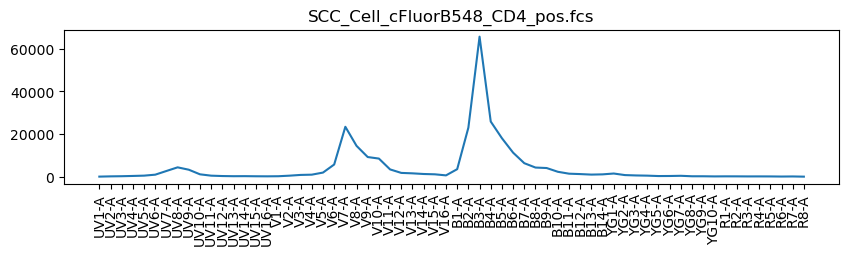

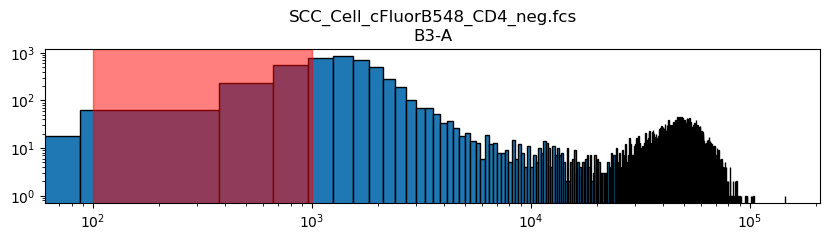

len(data_sub): 963


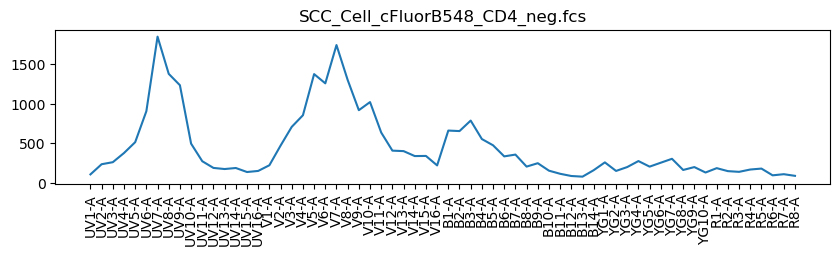

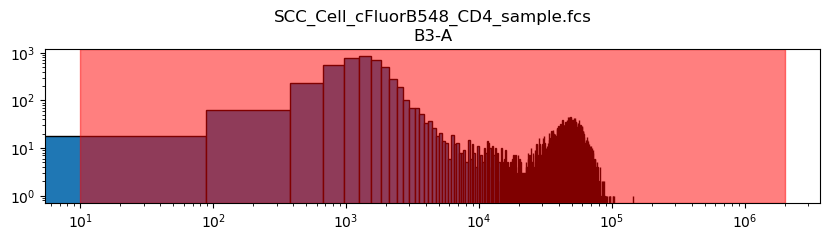

len(data_sub): 8519


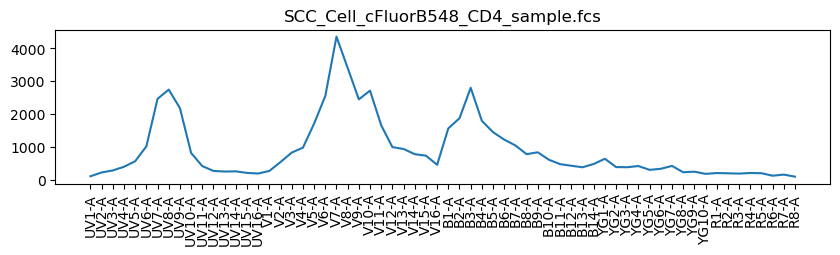

In [11]:
path = Data_dir+"/scc_Aurora5L/cFluorB548.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B3-A'

min = 60000
max = 100000
filename = 'SCC_Cell_cFluorB548_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_cFluorB548_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorB548_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

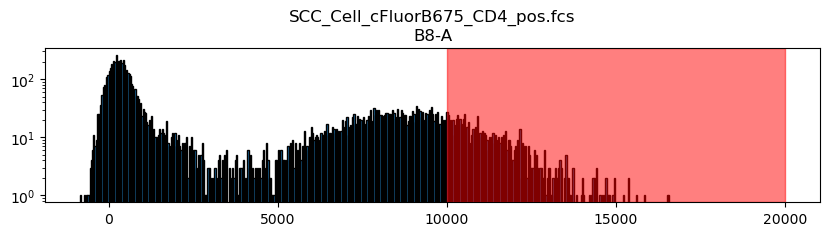

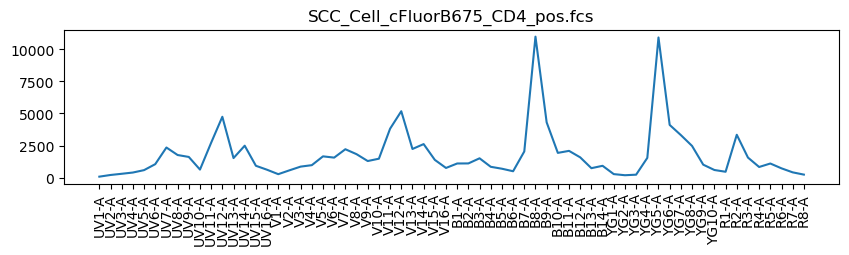

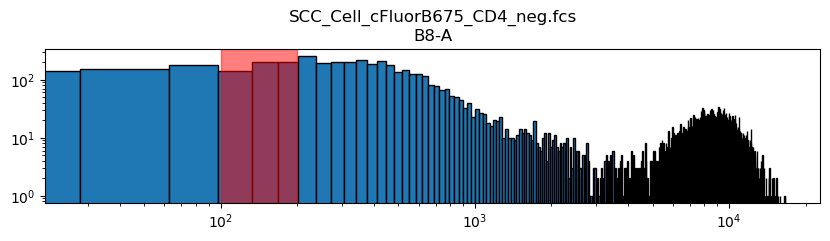

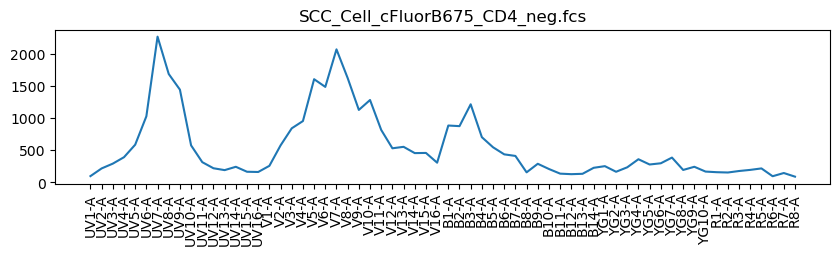

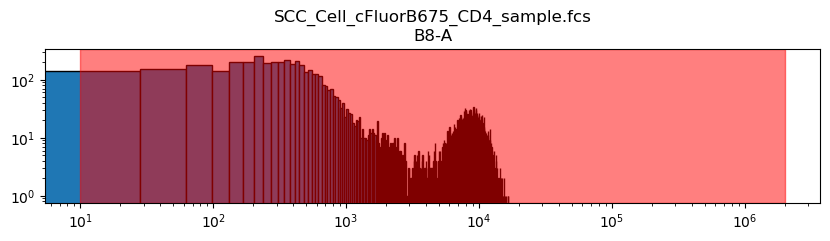

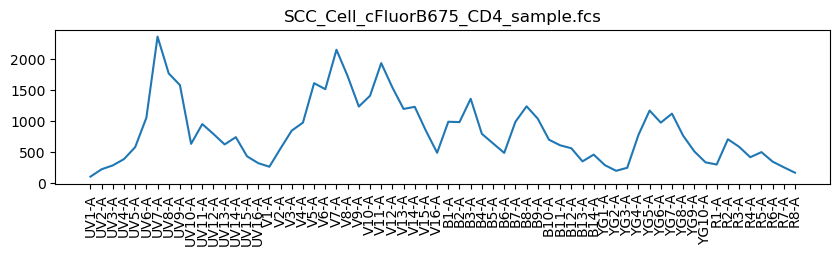

In [72]:
path = Data_dir+"/scc_Aurora5L/cFluorB675.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B8-A'

min = 10000
max = 20000
filename = 'SCC_Cell_cFluorB675_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorB675_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorB675_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

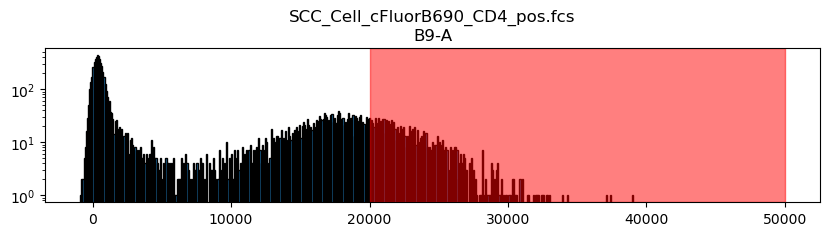

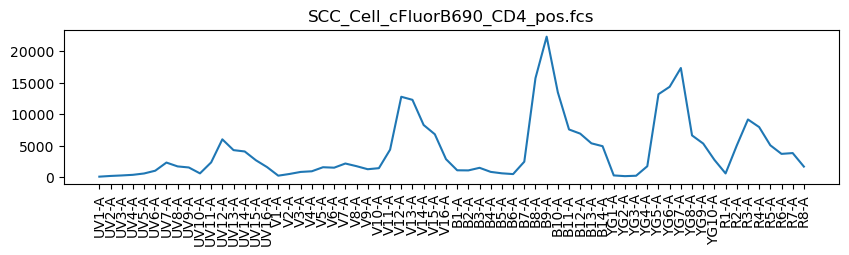

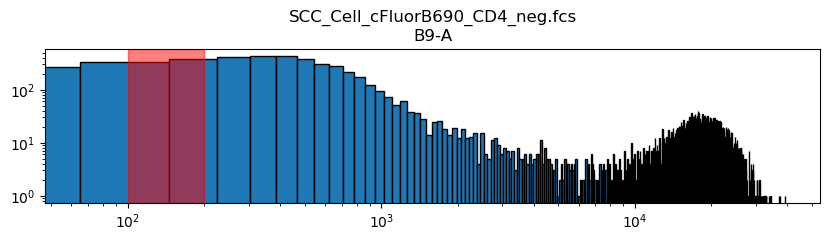

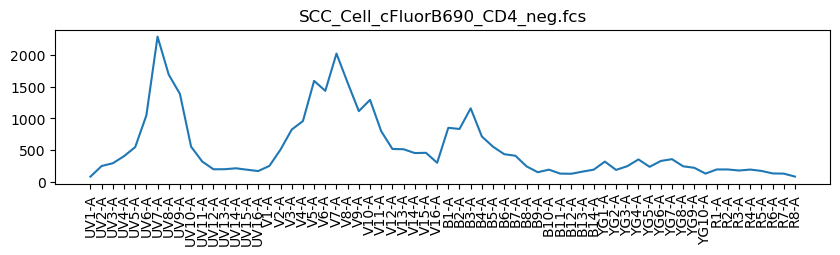

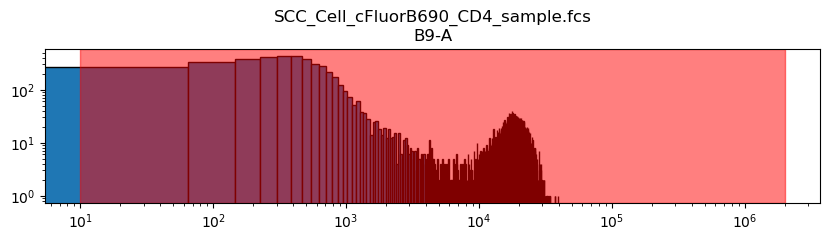

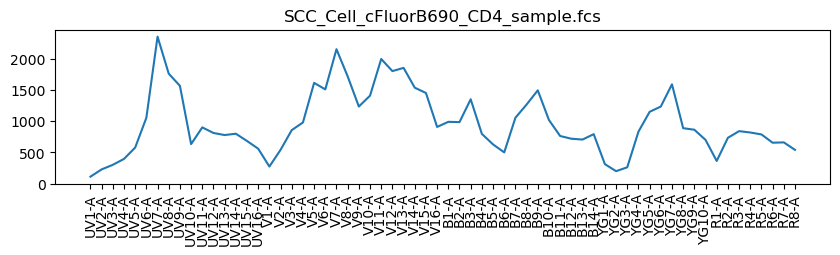

In [74]:
path = Data_dir+"/scc_Aurora5L/cFluorB690.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B9-A'

min = 20000
max = 50000
filename = 'SCC_Cell_cFluorB690_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorB690_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorB690_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

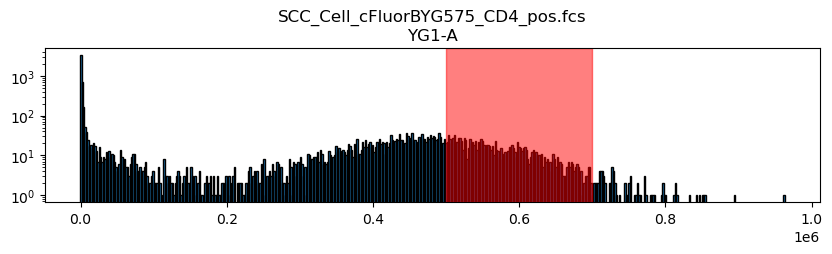

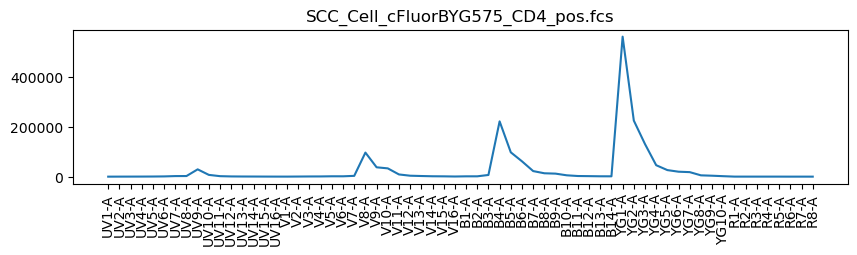

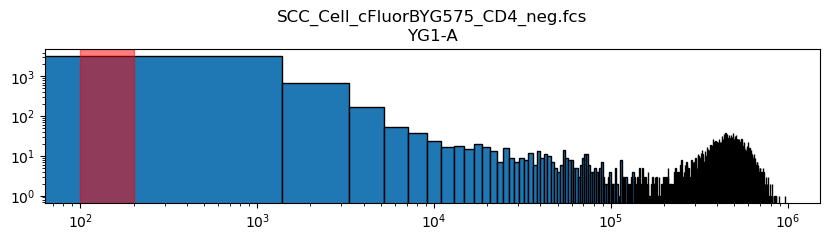

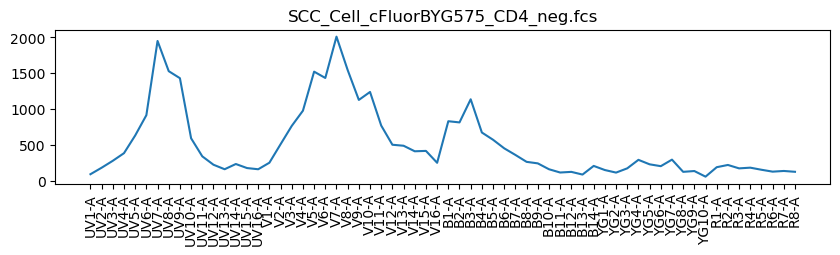

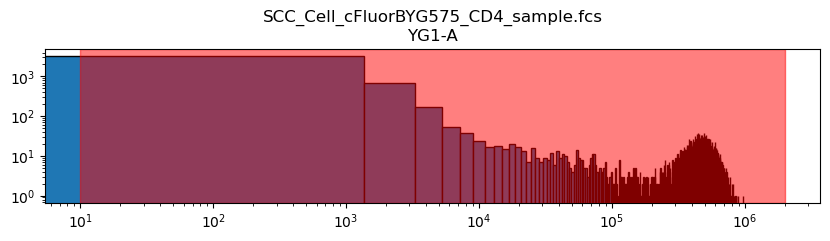

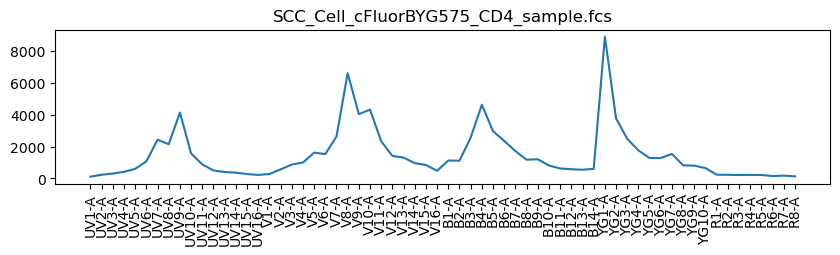

In [76]:
path = Data_dir+"/scc_Aurora5L/cFluorBYG575.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG1-A'

min = 500000
max = 700000
filename = 'SCC_Cell_cFluorBYG575_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorBYG575_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorBYG575_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

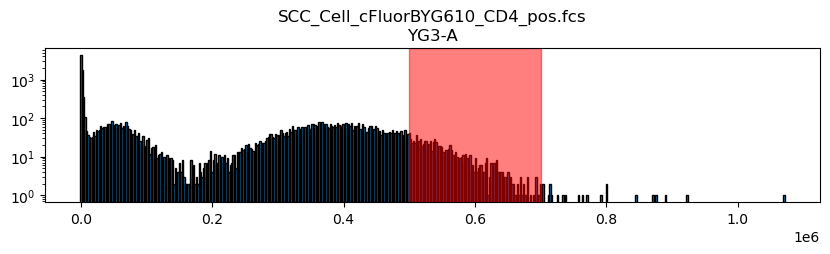

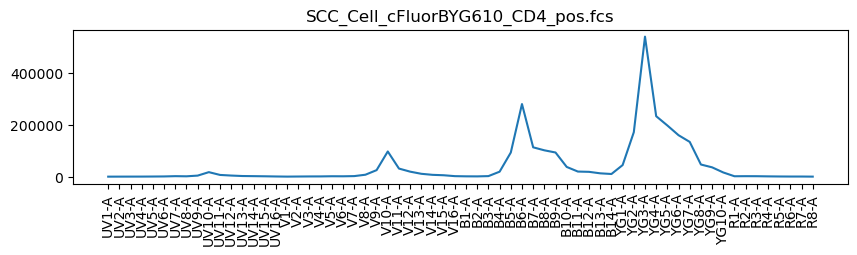

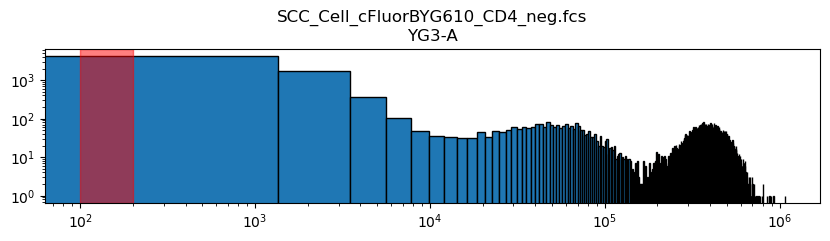

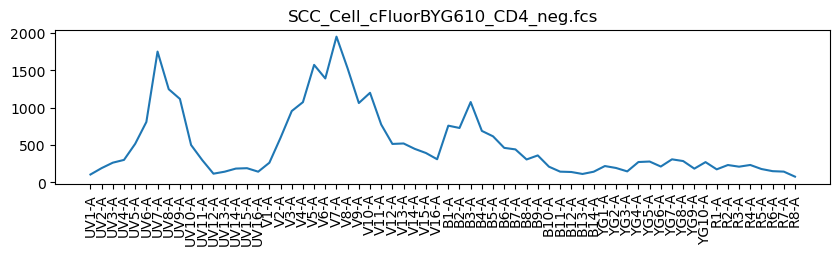

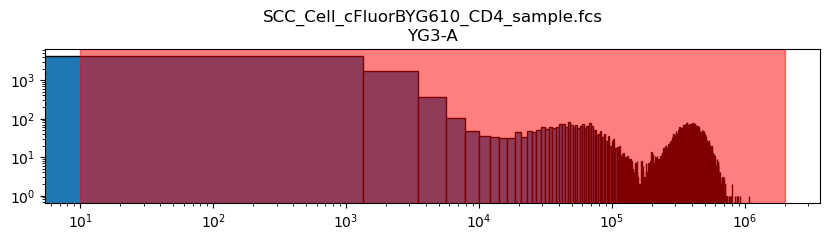

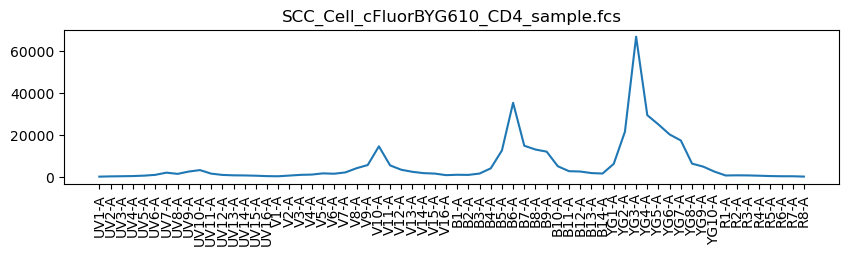

In [78]:
path = Data_dir+"/scc_Aurora5L/cFluorBYG610.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG3-A'

min = 500000
max = 700000
filename = 'SCC_Cell_cFluorBYG610_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorBYG610_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorBYG610_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

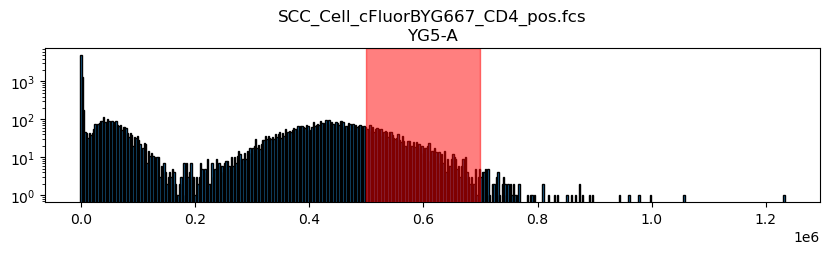

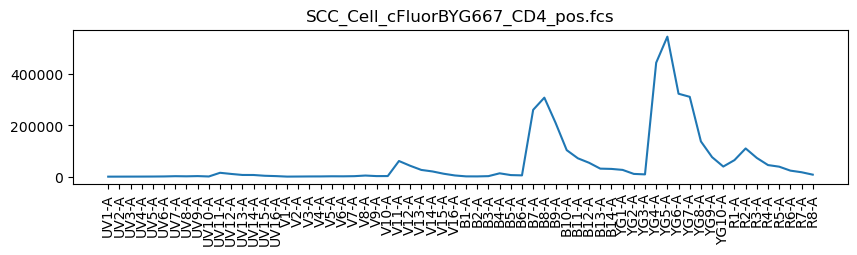

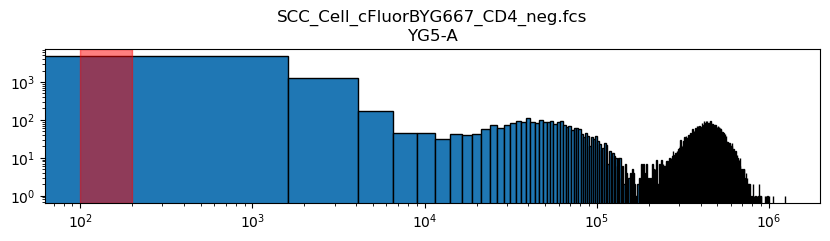

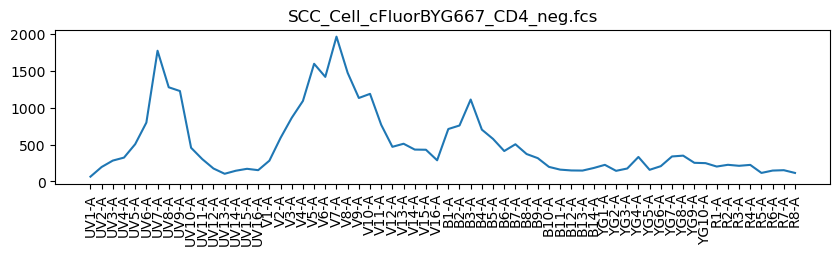

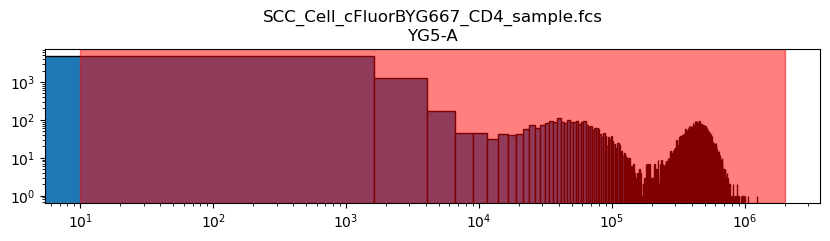

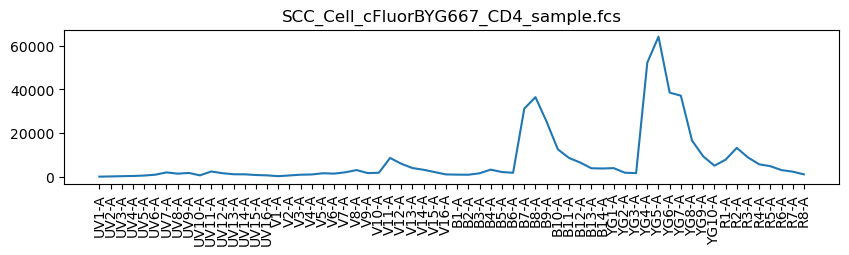

In [80]:
path = Data_dir+"/scc_Aurora5L/cFluorBYG667.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG5-A'

min = 500000
max = 700000
filename = 'SCC_Cell_cFluorBYG667_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorBYG667_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorBYG667_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

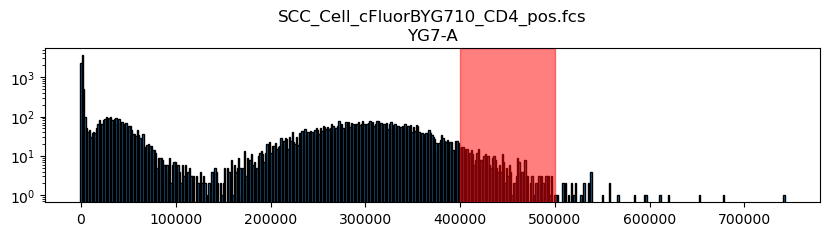

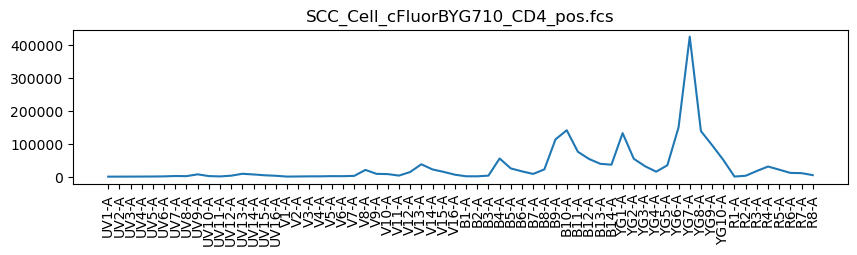

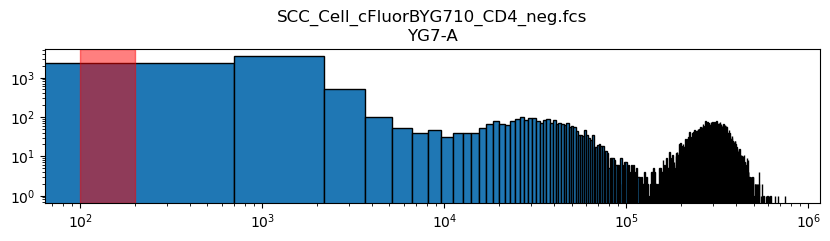

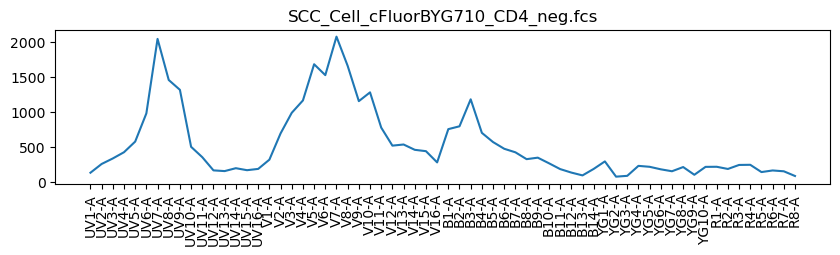

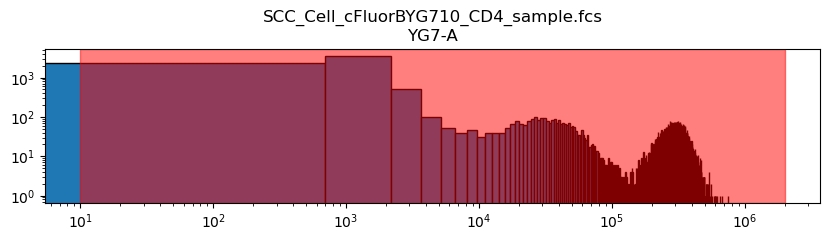

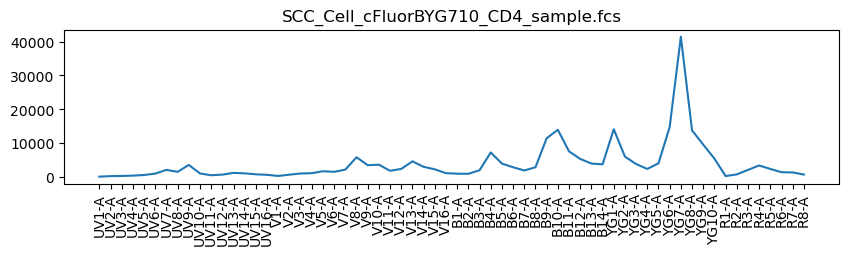

In [82]:
path = Data_dir+"/scc_Aurora5L/cFluorBYG710.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG7-A'

min = 400000
max = 500000
filename = 'SCC_Cell_cFluorBYG710_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorBYG710_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorBYG710_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

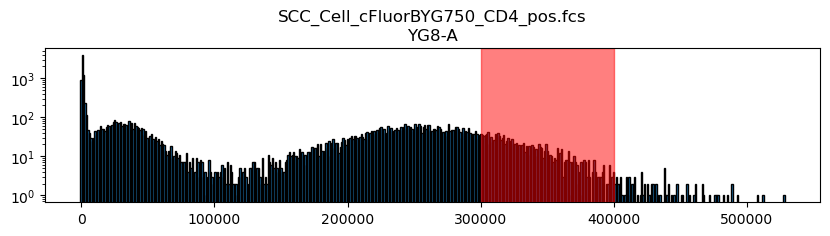

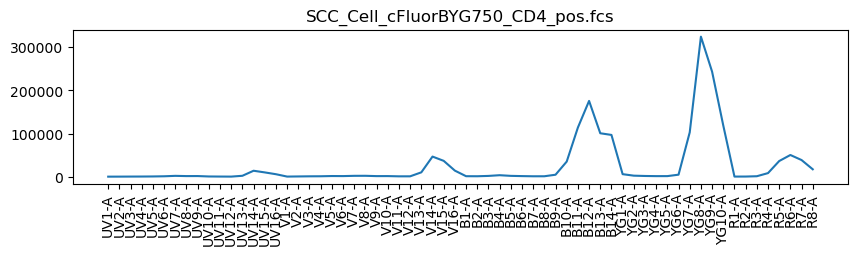

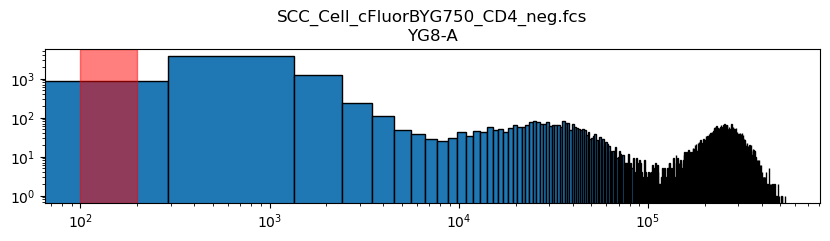

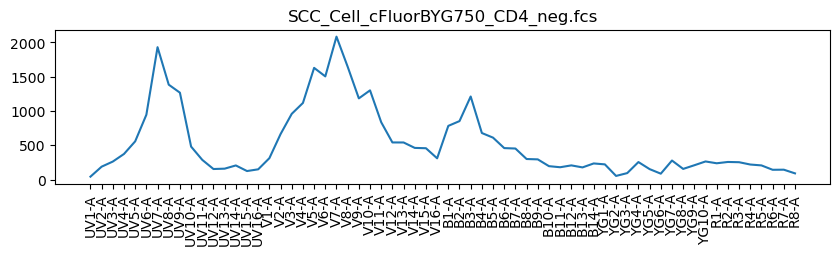

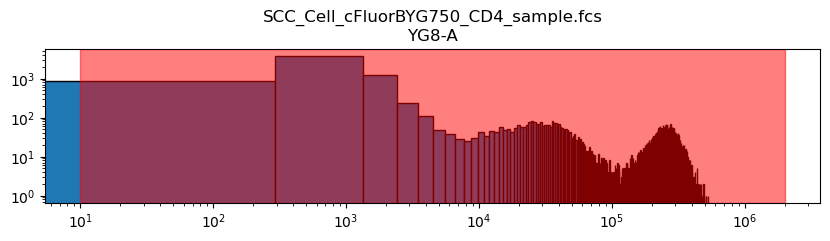

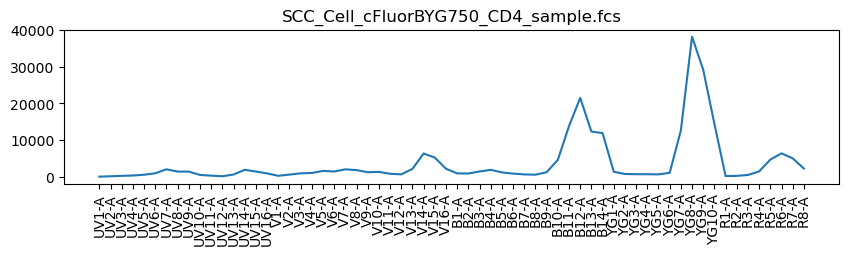

In [84]:
path = Data_dir+"/scc_Aurora5L/cFluorBYG750.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG8-A'

min = 300000
max = 400000
filename = 'SCC_Cell_cFluorBYG750_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorBYG750_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorBYG750_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

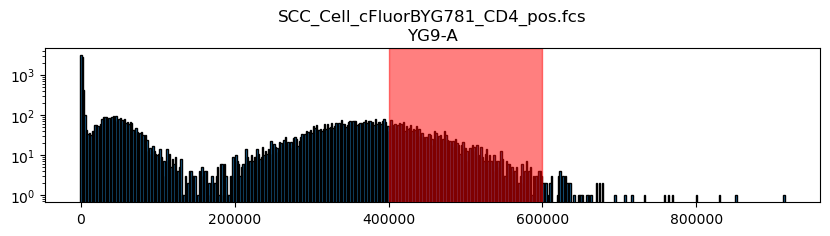

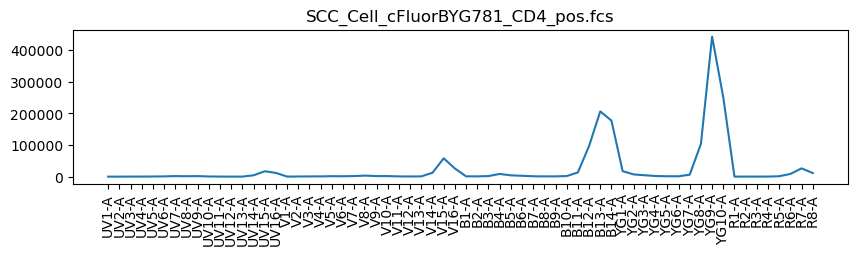

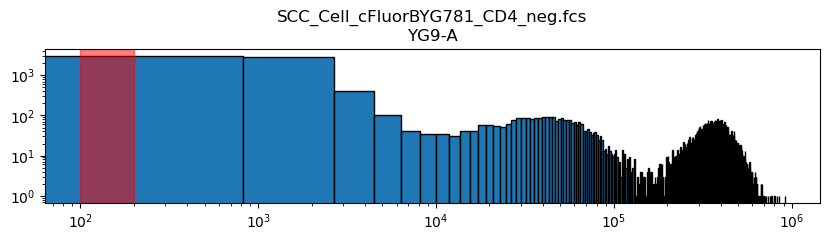

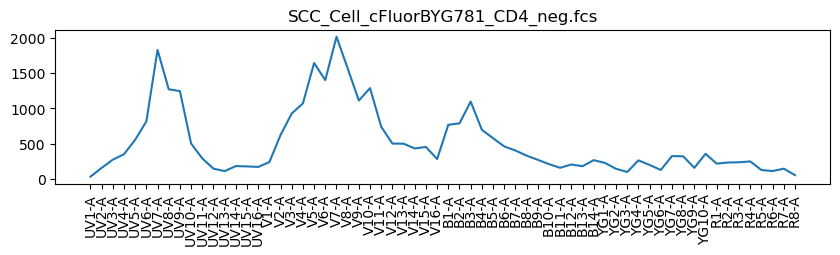

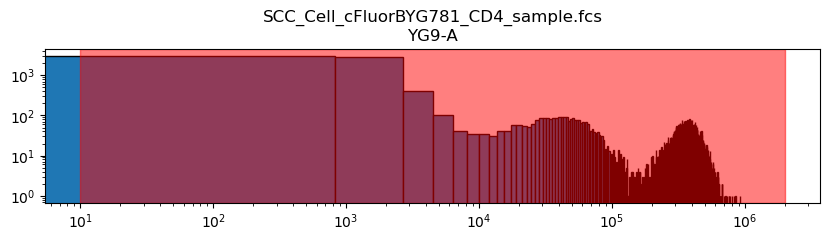

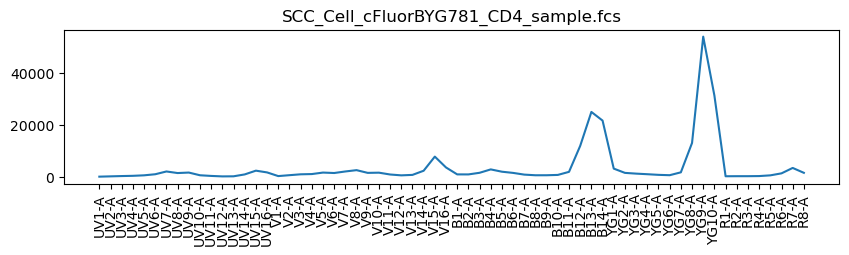

In [86]:
path = Data_dir+"/scc_Aurora5L/cFluorBYG781.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG9-A'

min = 400000
max = 600000
filename = 'SCC_Cell_cFluorBYG781_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorBYG781_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorBYG781_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

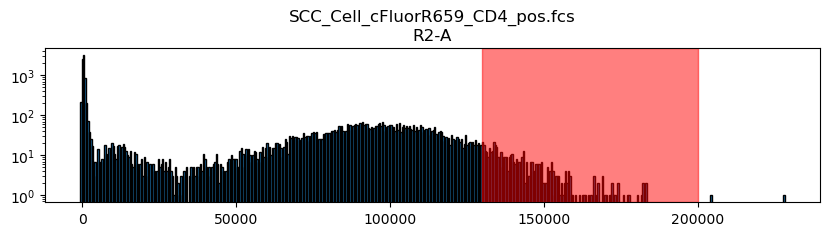

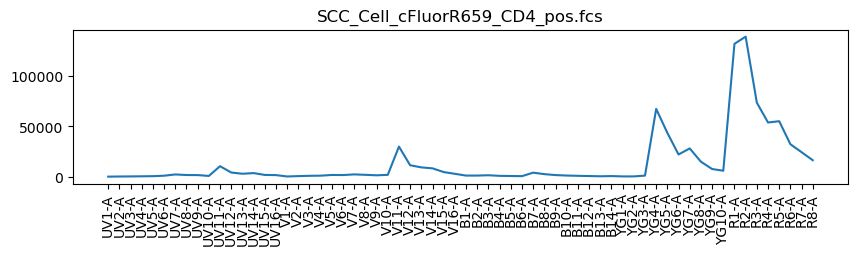

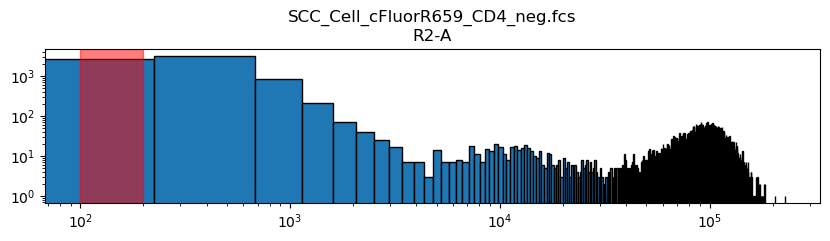

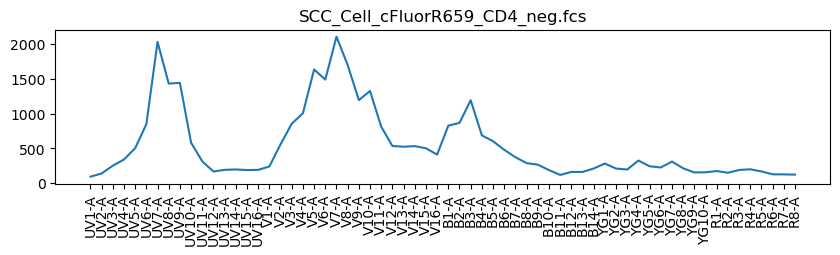

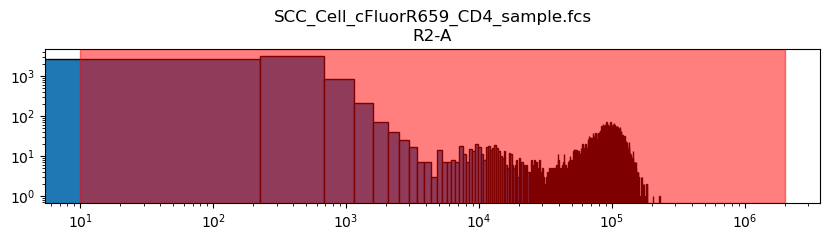

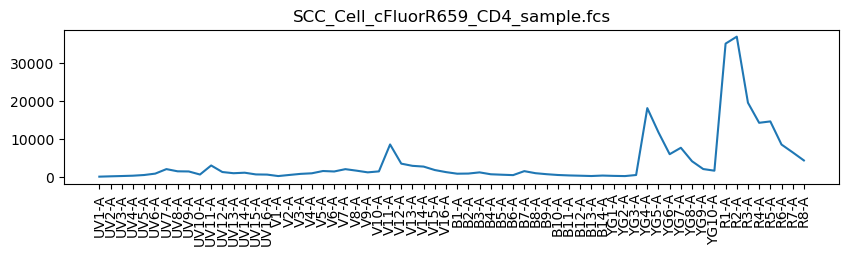

In [88]:
path = Data_dir+"/scc_Aurora5L/cFluorR659.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R2-A'

min = 130000
max = 200000
filename = 'SCC_Cell_cFluorR659_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorR659_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorR659_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

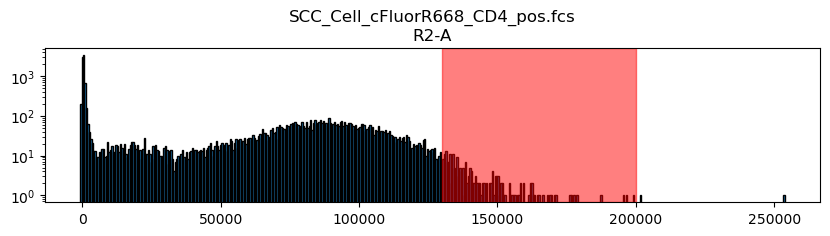

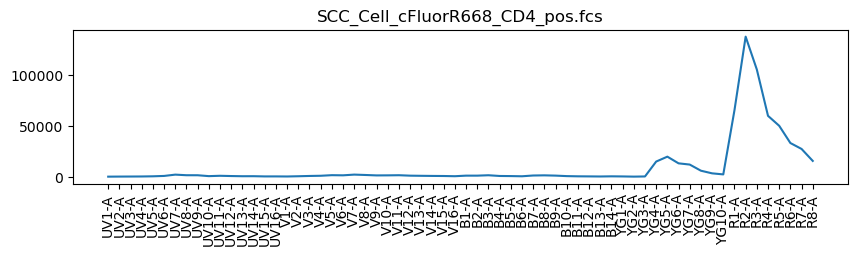

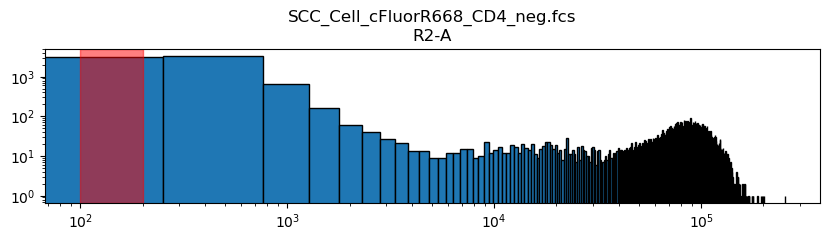

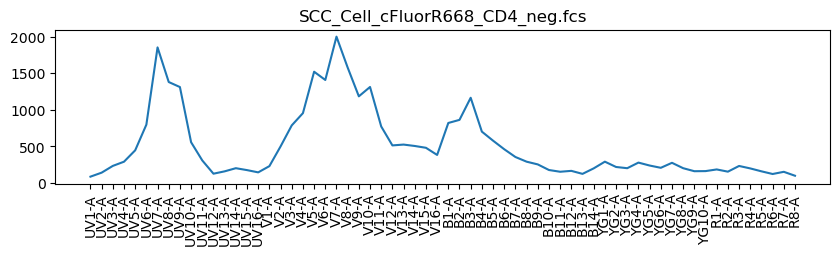

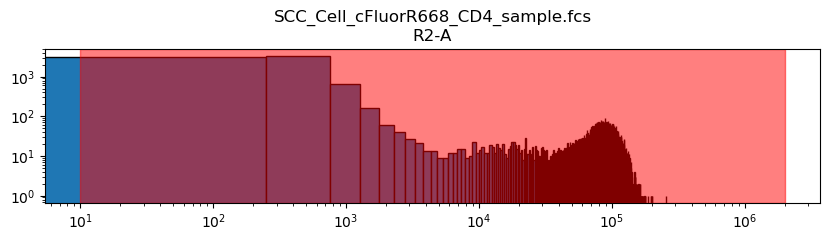

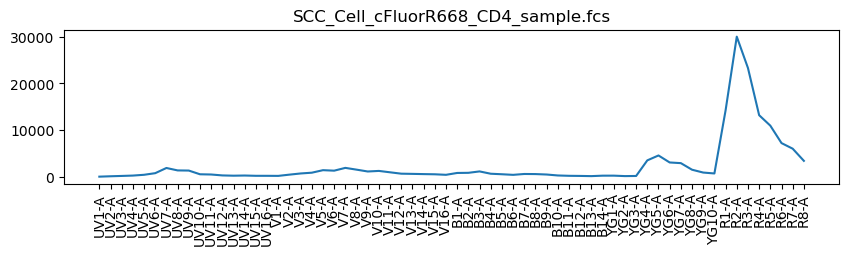

In [90]:
path = Data_dir+"/scc_Aurora5L/cFluorR668.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R2-A'

min = 130000
max = 200000
filename = 'SCC_Cell_cFluorR668_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorR668_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorR668_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

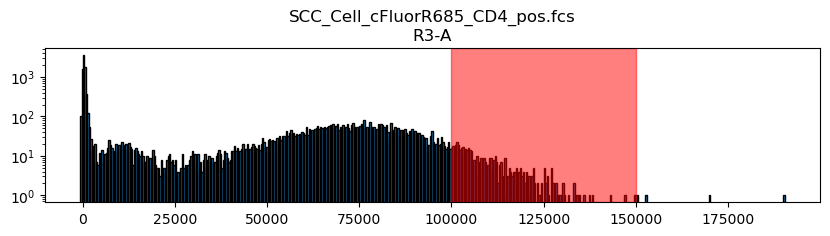

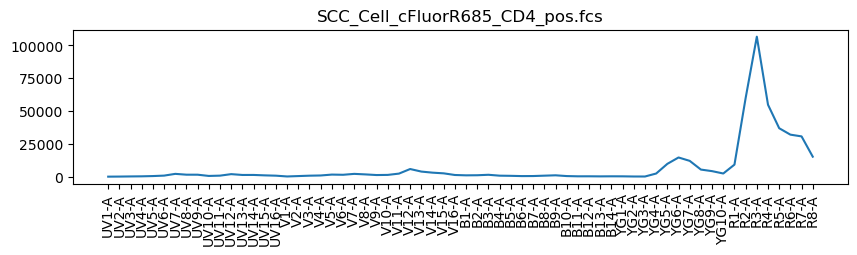

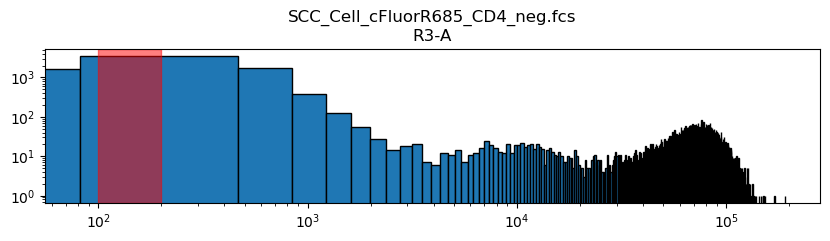

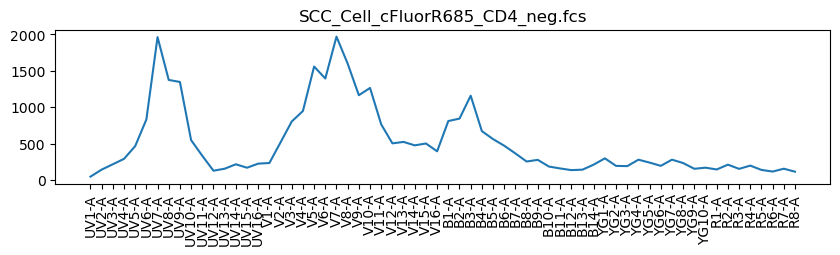

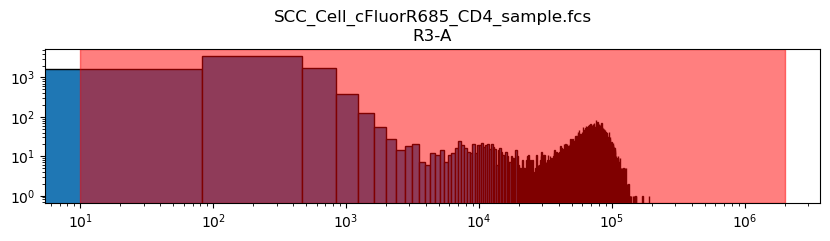

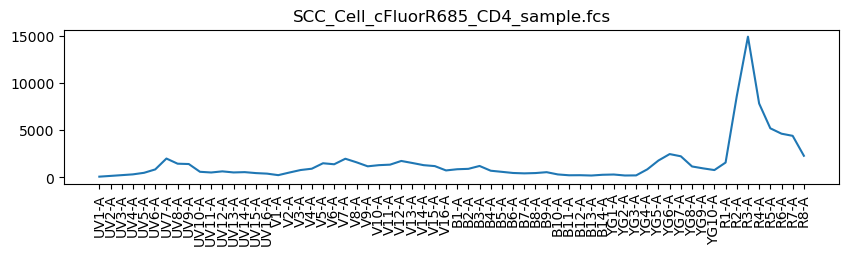

In [92]:
path = Data_dir+"/scc_Aurora5L/cFluorR685.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R3-A'

min = 100000
max = 150000
filename = 'SCC_Cell_cFluorR685_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorR685_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorR685_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

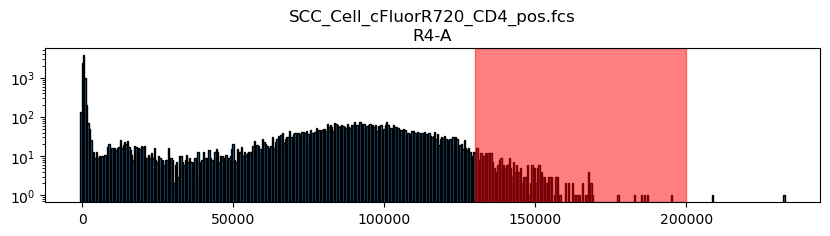

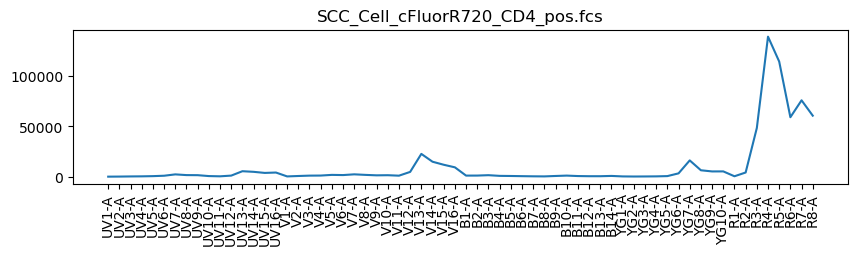

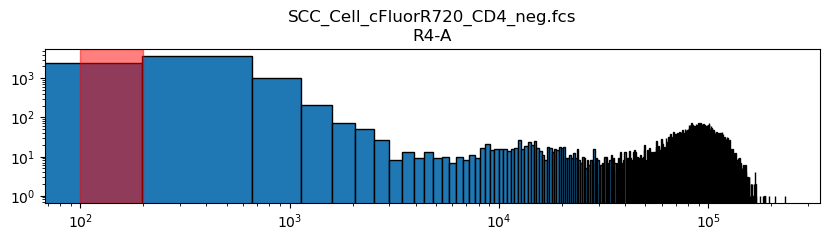

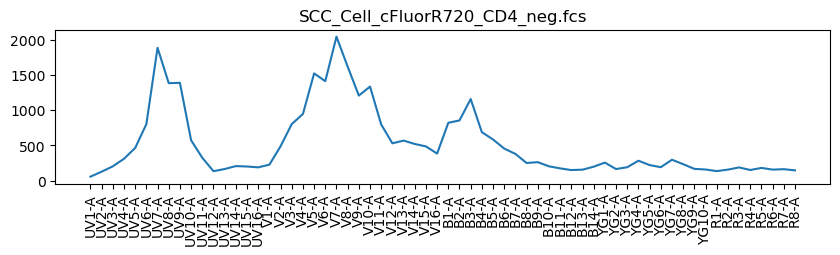

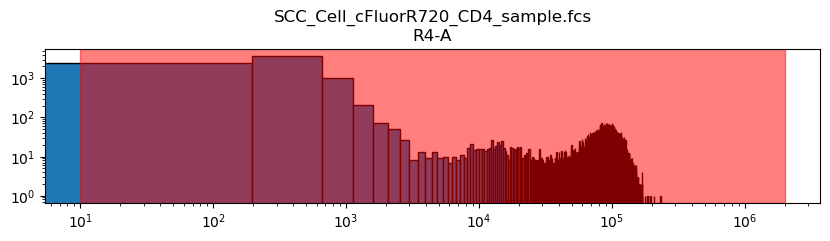

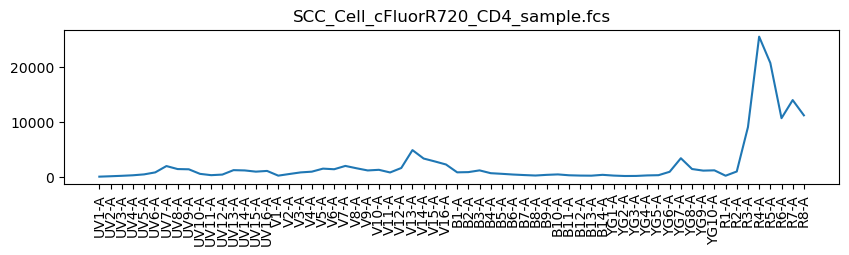

In [94]:
path = Data_dir+"/scc_Aurora5L/cFluorR720.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R4-A'

min = 130000
max = 200000
filename = 'SCC_Cell_cFluorR720_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorR720_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorR720_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

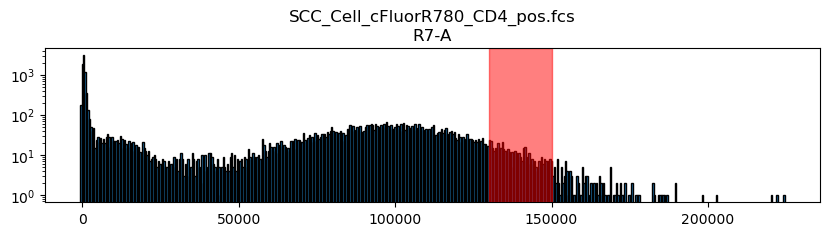

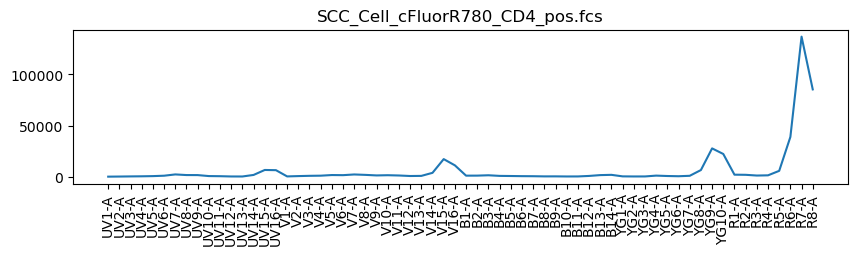

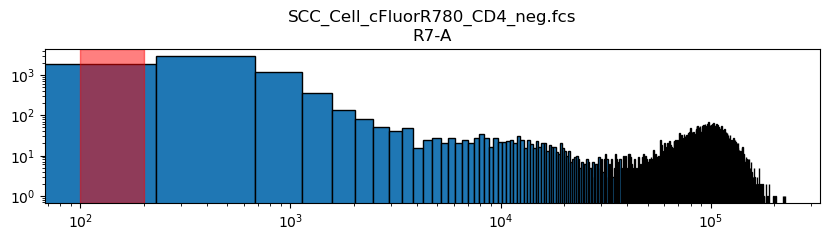

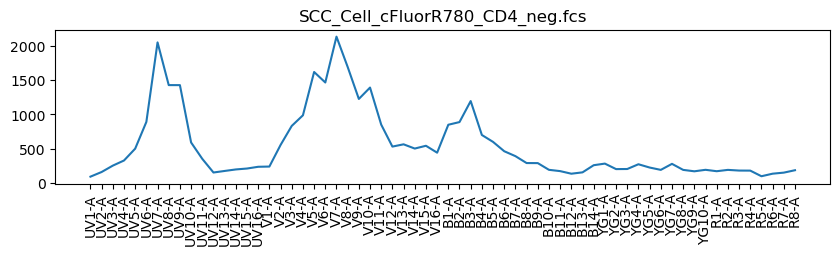

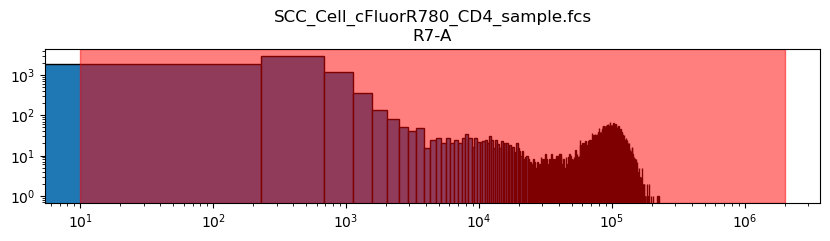

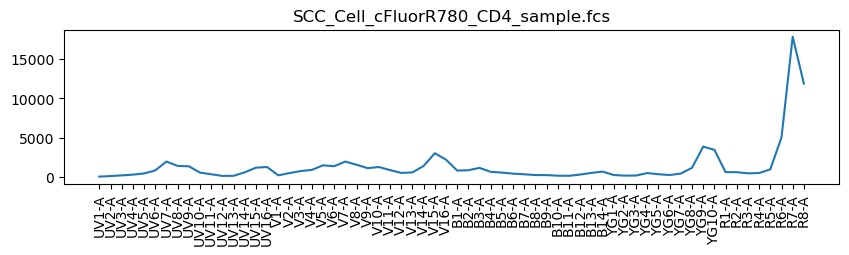

In [96]:
path = Data_dir+"/scc_Aurora5L/cFluorR780.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R7-A'

min = 130000
max = 150000
filename = 'SCC_Cell_cFluorR780_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorR780_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorR780_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

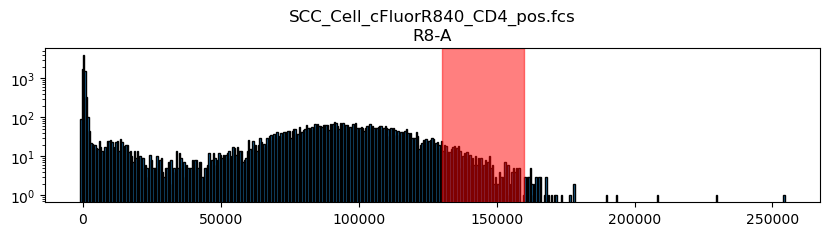

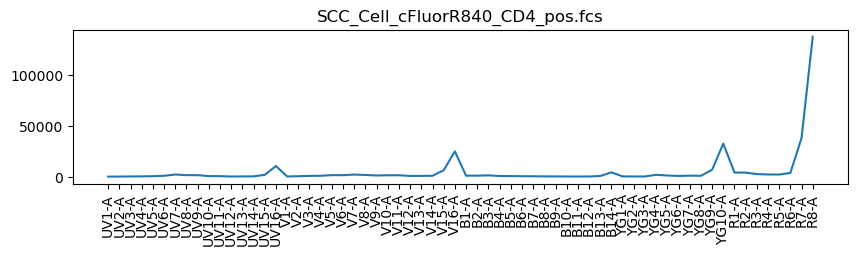

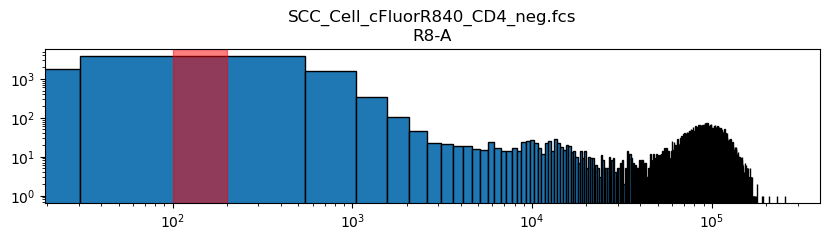

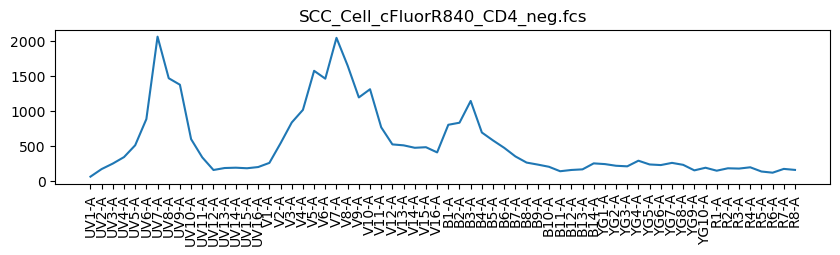

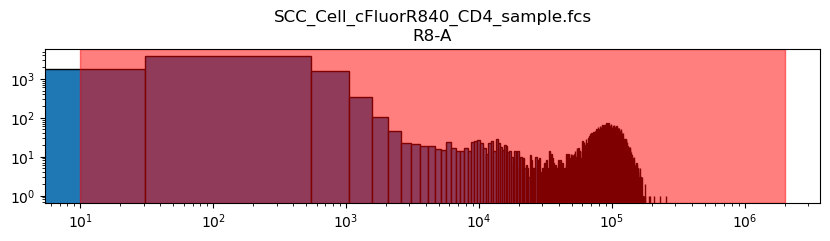

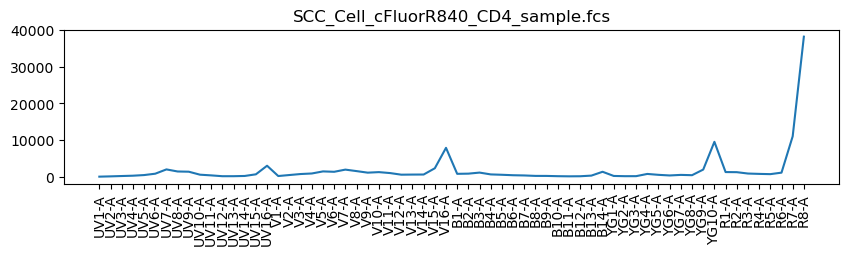

In [98]:
path = Data_dir+"/scc_Aurora5L/cFluorR840.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R8-A'

min = 130000
max = 160000
filename = 'SCC_Cell_cFluorR840_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorR840_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorR840_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

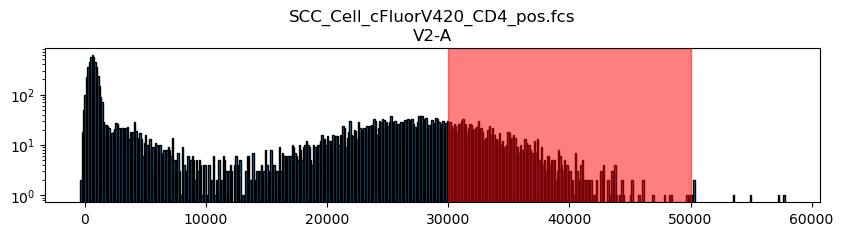

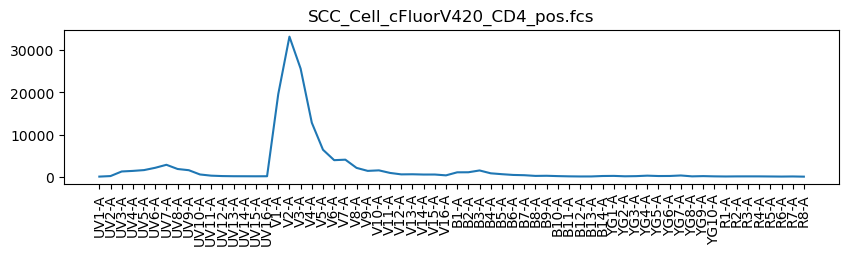

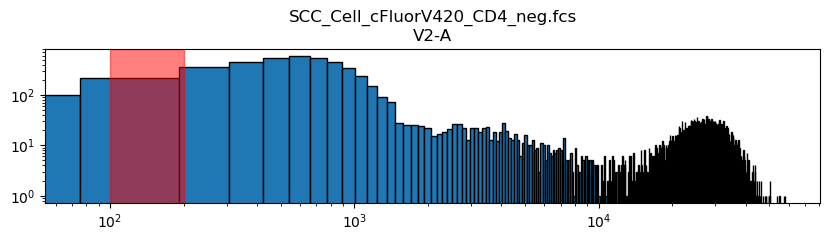

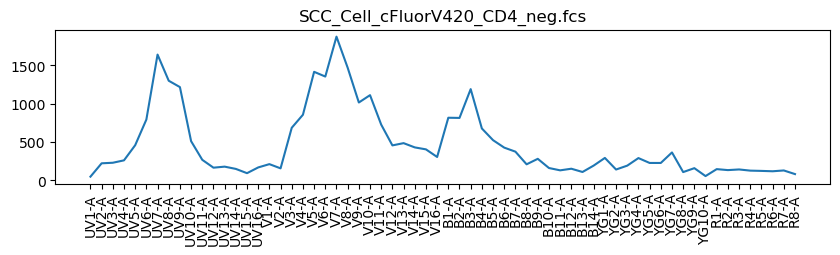

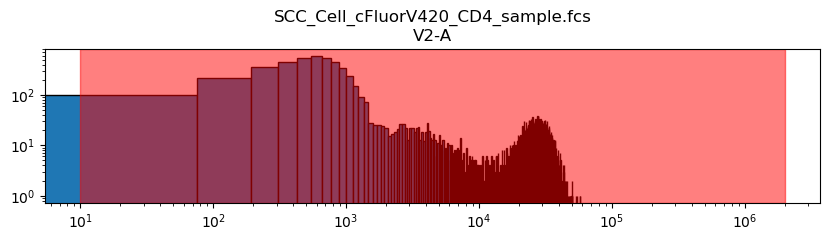

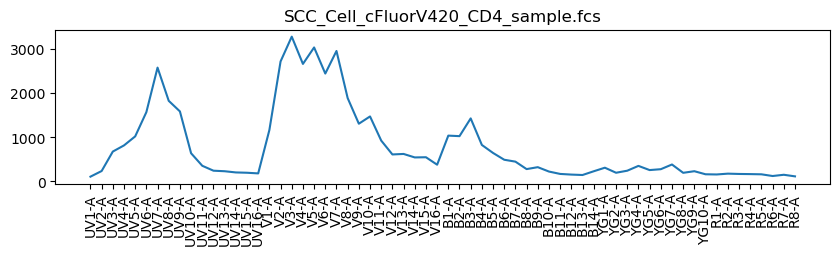

In [100]:
path = Data_dir+"/scc_Aurora5L/cFluorV420.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V2-A'

min = 30000
max = 50000
filename = 'SCC_Cell_cFluorV420_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorV420_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorV420_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

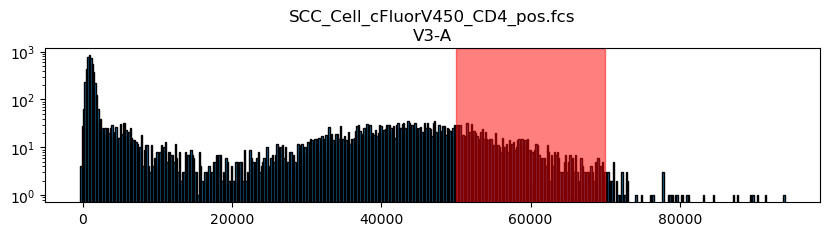

len(data_sub): 1091


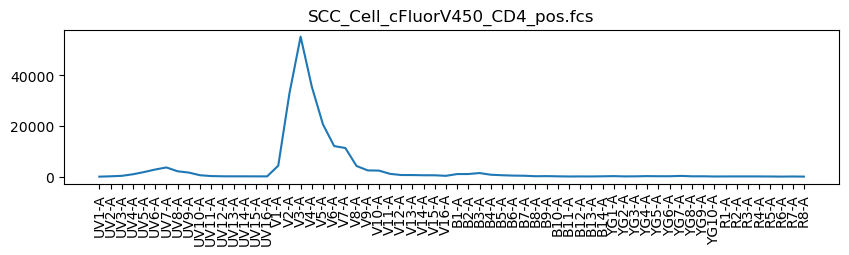

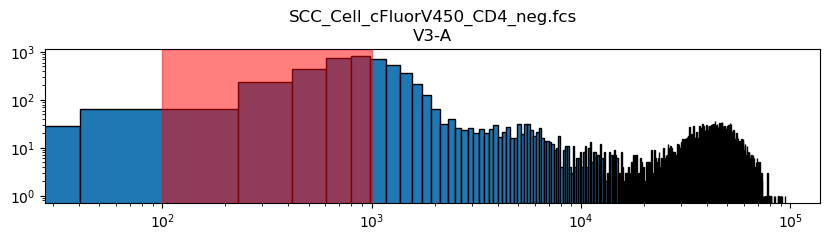

len(data_sub): 2387


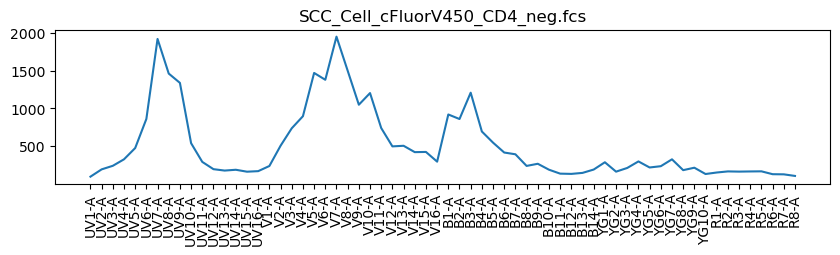

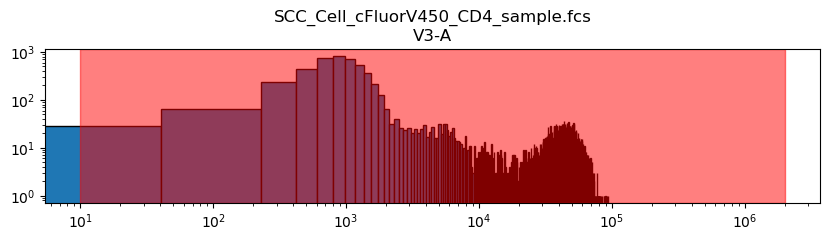

len(data_sub): 9218


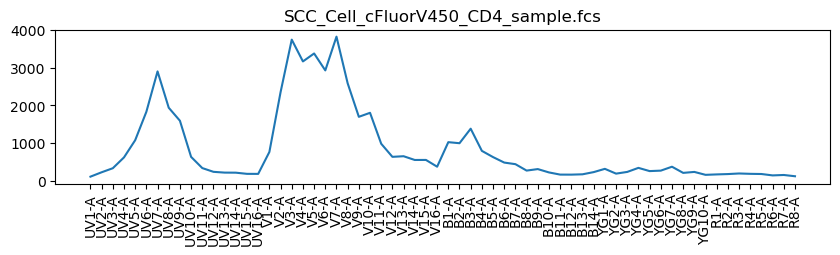

In [19]:
path = Data_dir+"/scc_Aurora5L/cFluorV450.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V3-A'

min = 50000
max = 70000
filename = 'SCC_Cell_cFluorV450_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_cFluorV450_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorV450_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

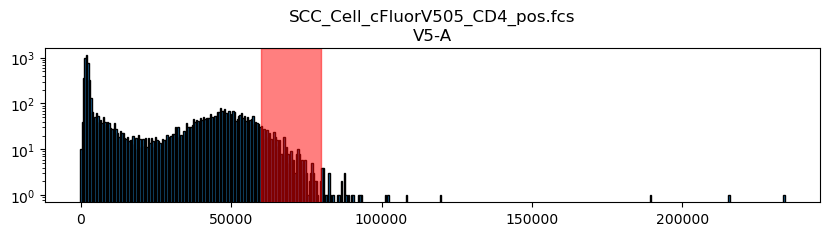

len(data_sub): 443


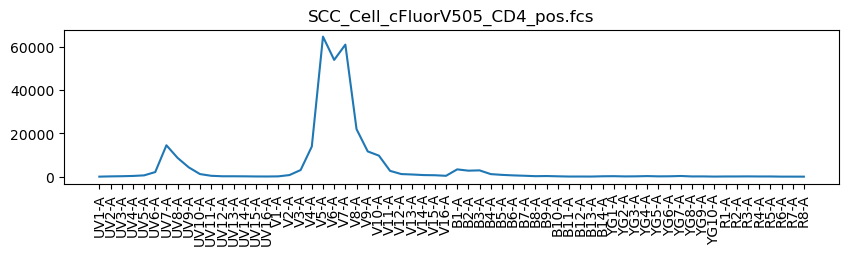

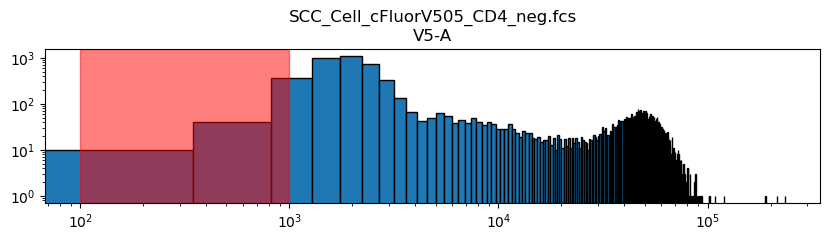

len(data_sub): 124


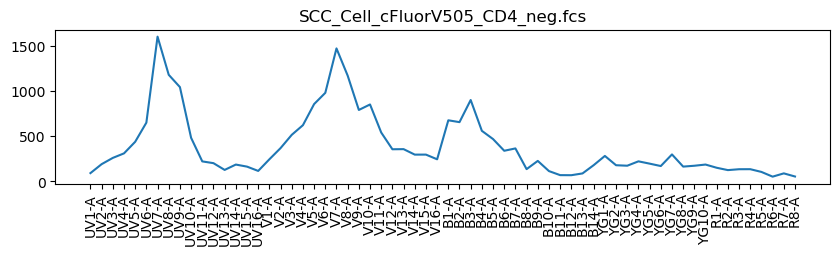

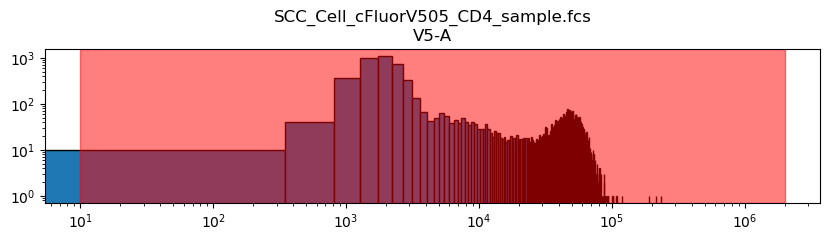

len(data_sub): 8491


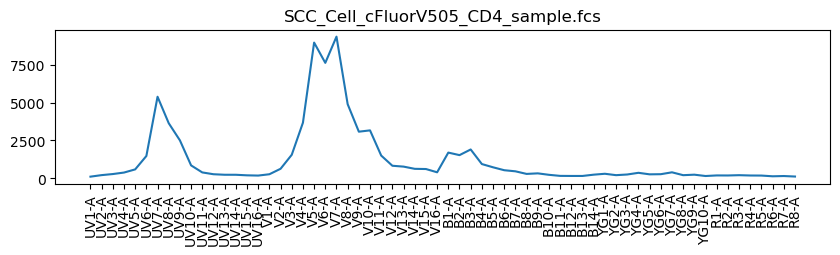

In [9]:
path = Data_dir+"/scc_Aurora5L/cFluorV505.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V5-A'

min = 60000
max = 80000
filename = 'SCC_Cell_cFluorV505_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_cFluorV505_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorV505_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

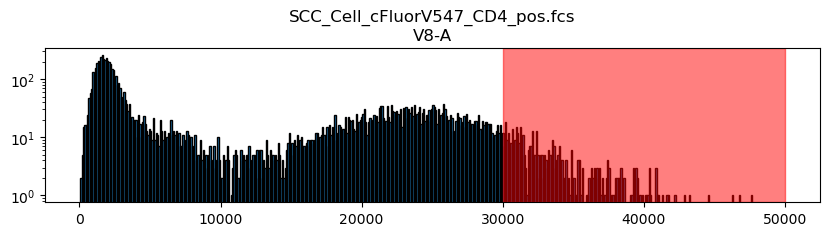

len(data_sub): 447


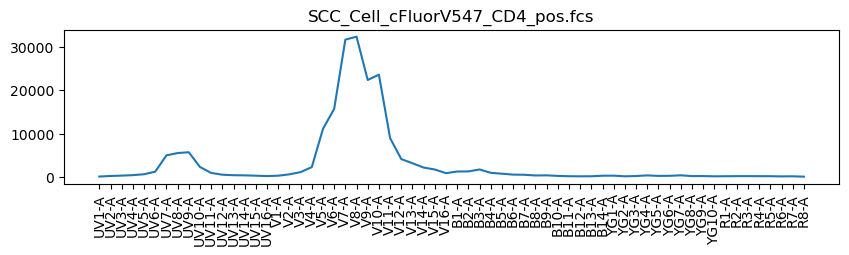

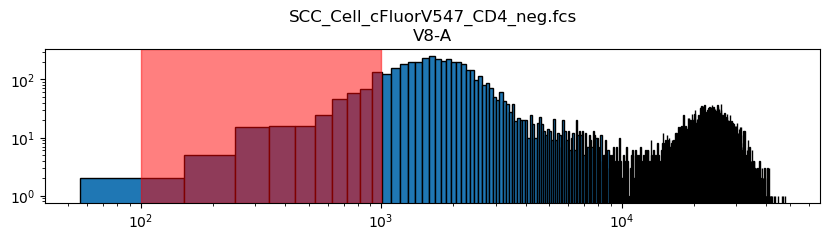

len(data_sub): 363


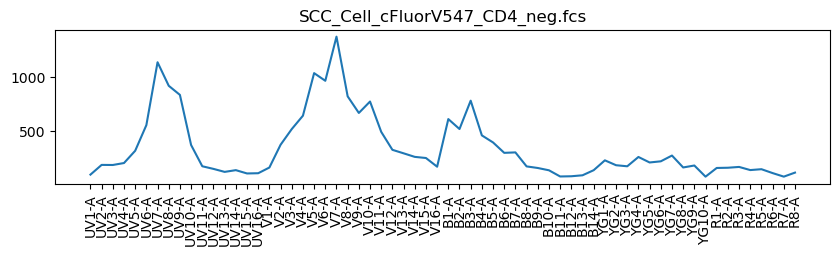

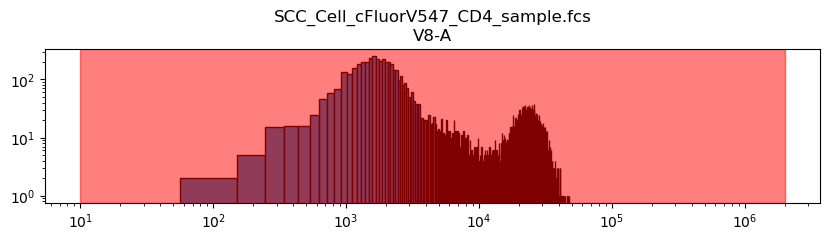

len(data_sub): 8435


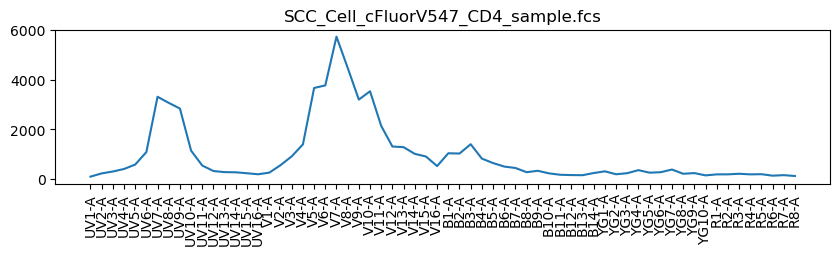

In [8]:
path = Data_dir+"/scc_Aurora5L/cFluorV547.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V8-A'

min = 30000
max = 50000
filename = 'SCC_Cell_cFluorV547_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_cFluorV547_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorV547_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

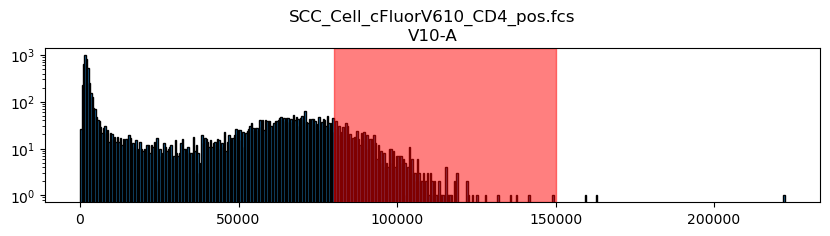

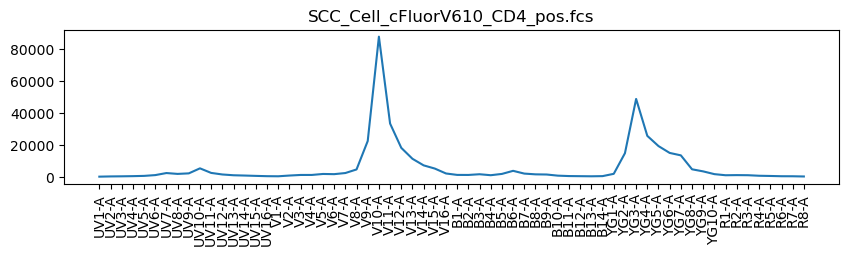

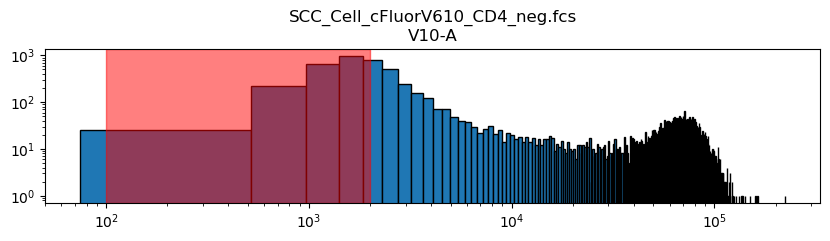

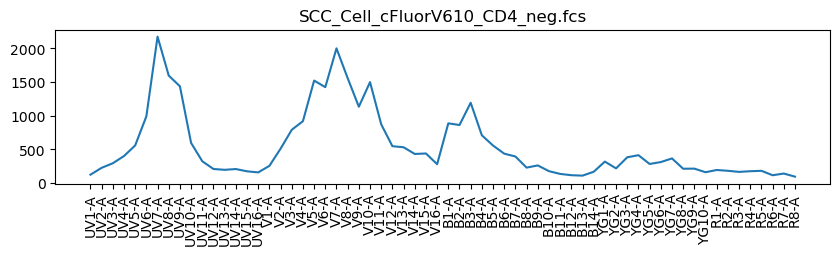

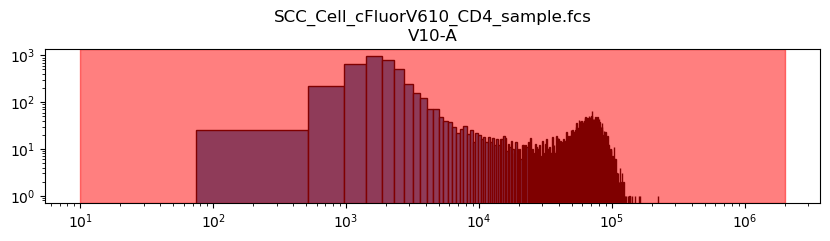

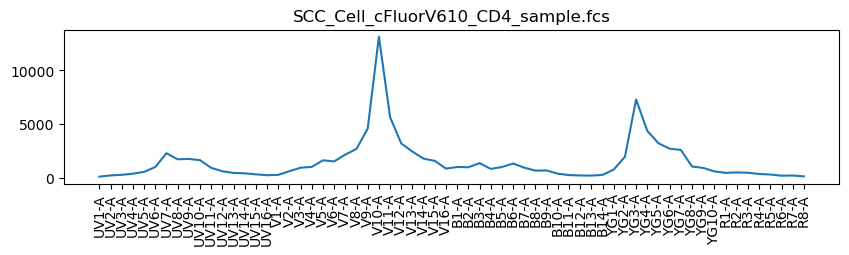

In [145]:
path = Data_dir+"/scc_Aurora5L/cFluorV610.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'V10-A'

min = 80000
max = 150000
filename = 'SCC_Cell_cFluorV610_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_Cell_cFluorV610_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorV610_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

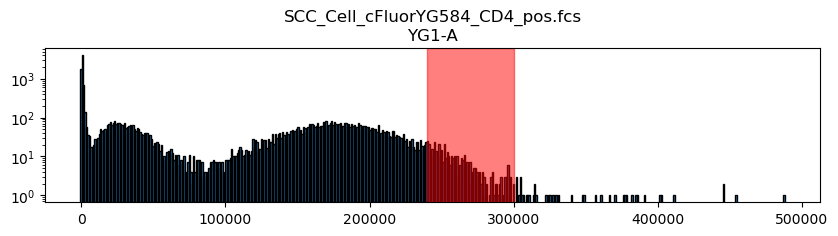

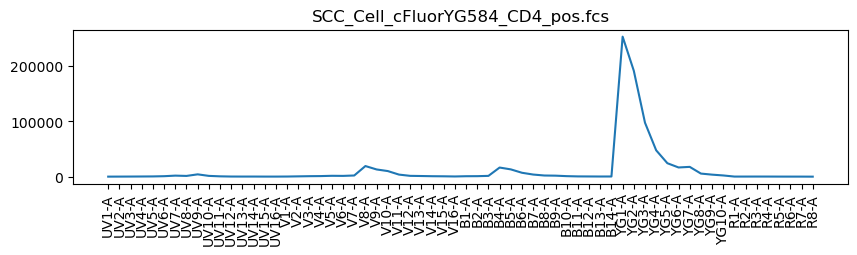

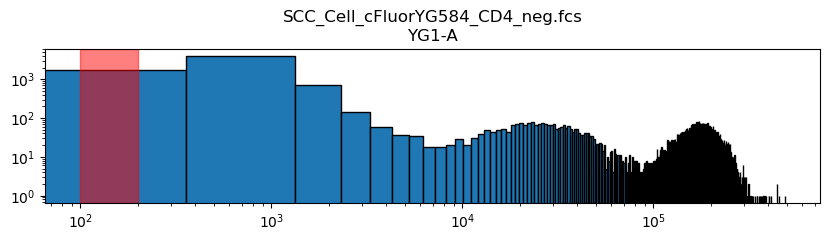

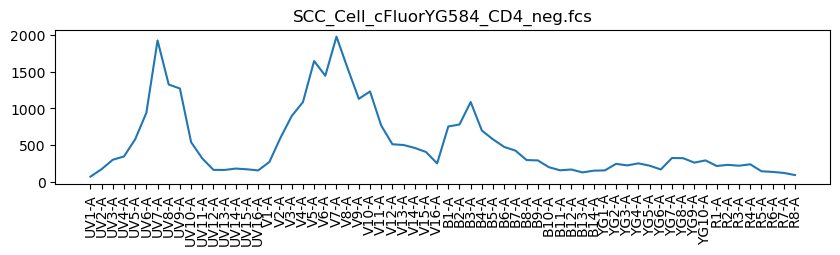

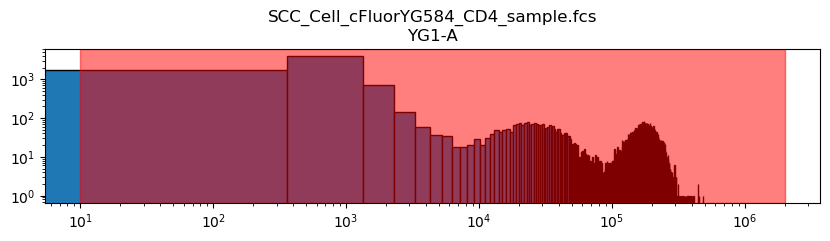

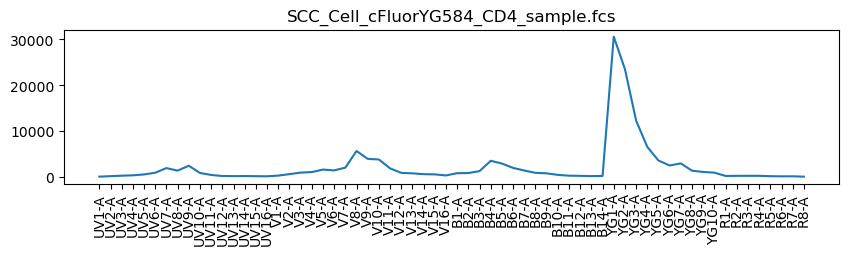

In [113]:
path = Data_dir+"/scc_Aurora5L/cFluorYG584.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG1-A'

min = 240000
max = 300000
filename = 'SCC_Cell_cFluorYG584_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorYG584_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorYG584_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

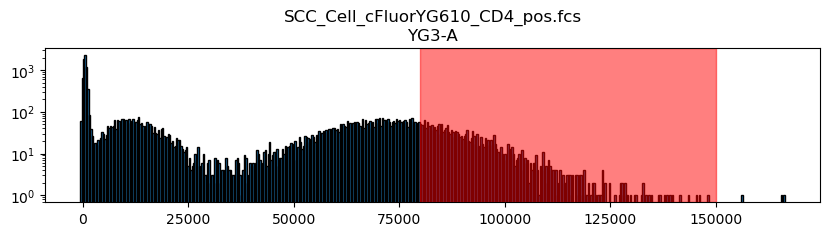

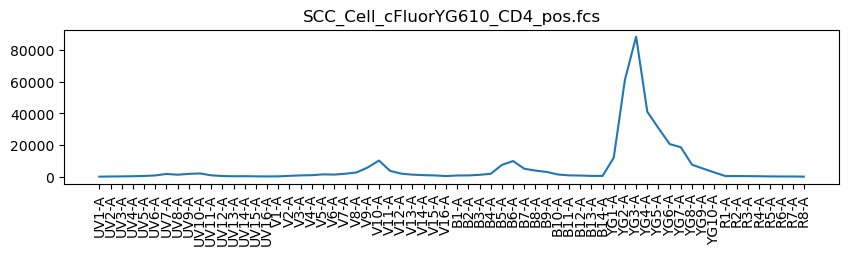

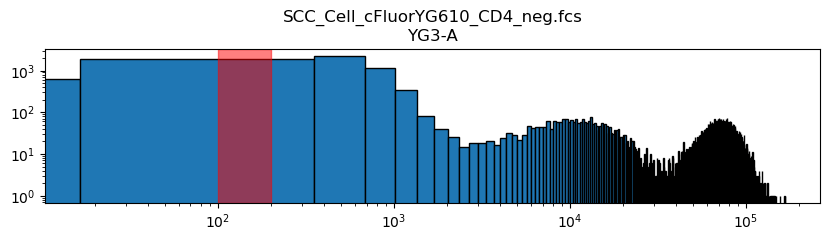

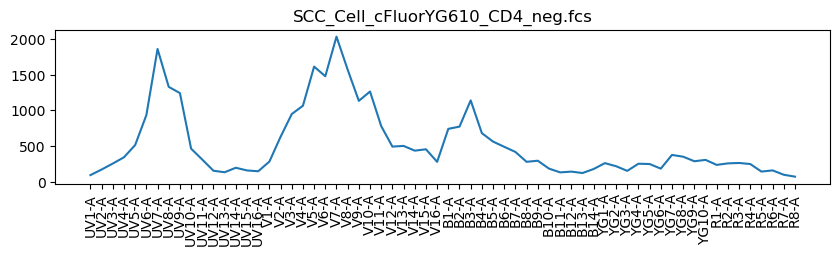

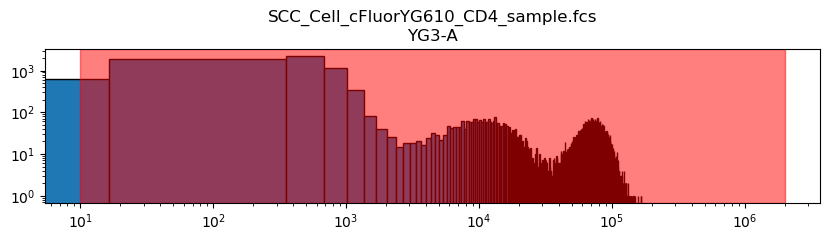

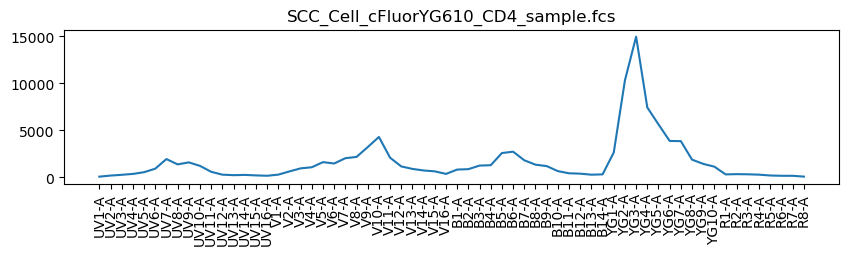

In [115]:
path = Data_dir+"/scc_Aurora5L/cFluorYG610.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG3-A'

min = 80000
max = 150000
filename = 'SCC_Cell_cFluorYG610_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_cFluorYG610_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_cFluorYG610_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

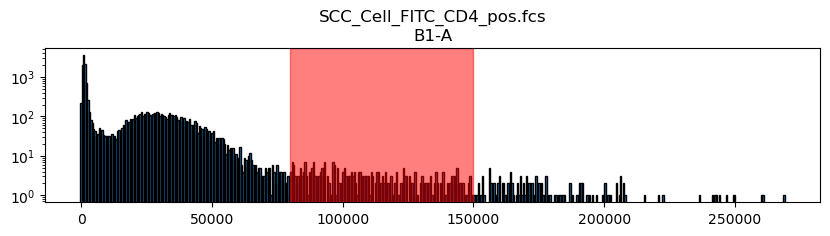

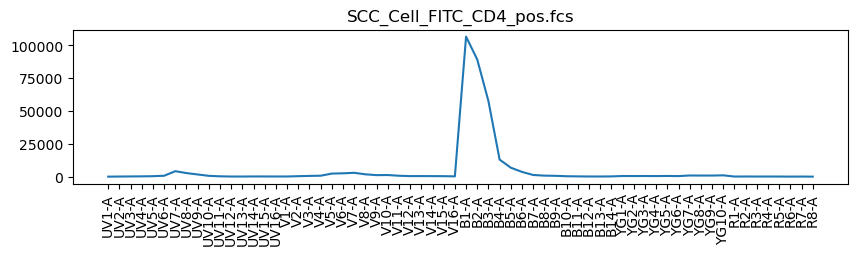

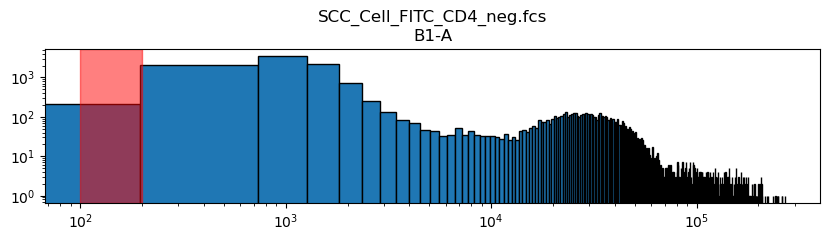

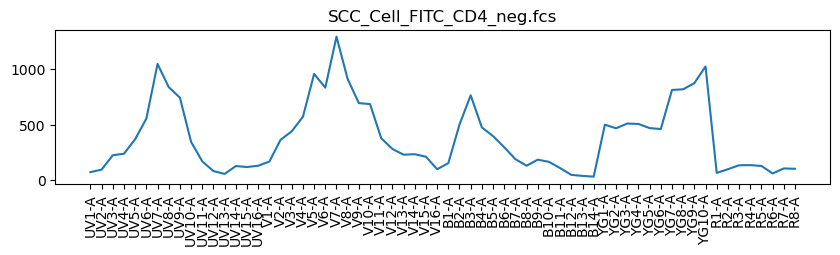

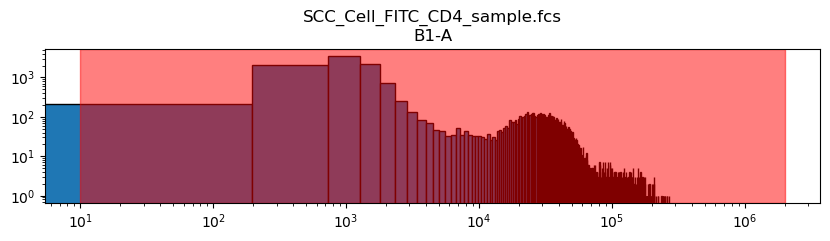

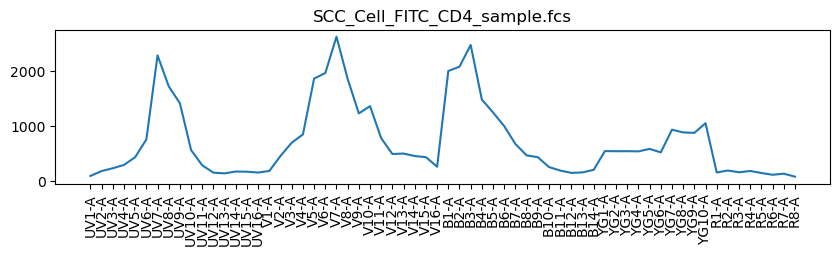

In [117]:
path = Data_dir+"/scc_Aurora5L/FITC.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B1-A'

min = 80000
max = 150000
filename = 'SCC_Cell_FITC_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_FITC_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_FITC_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

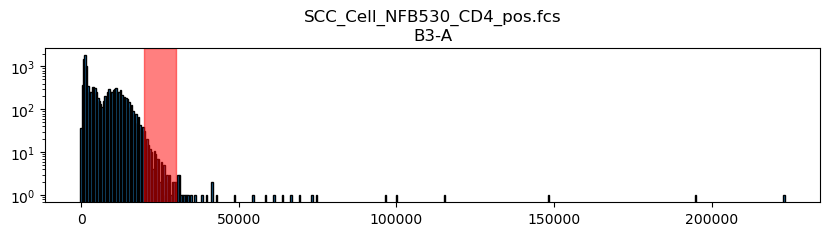

len(data_sub): 158


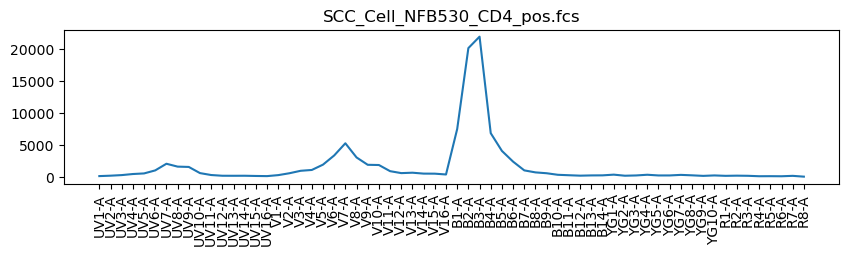

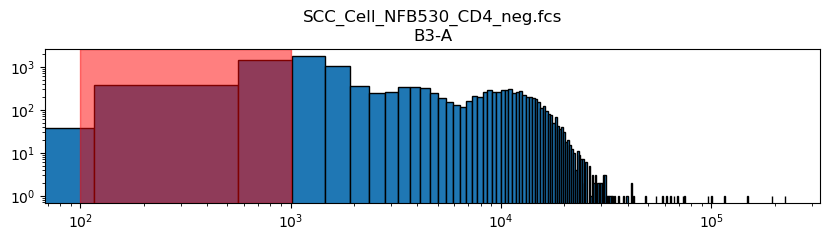

len(data_sub): 1795


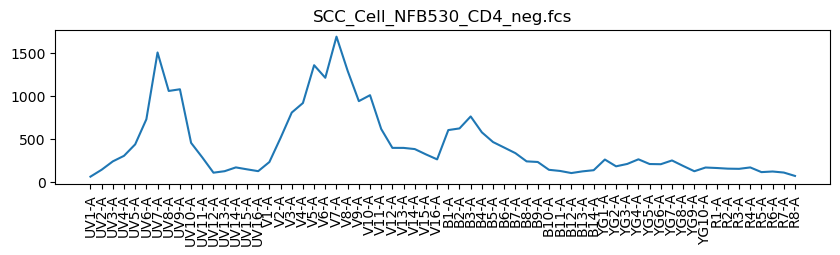

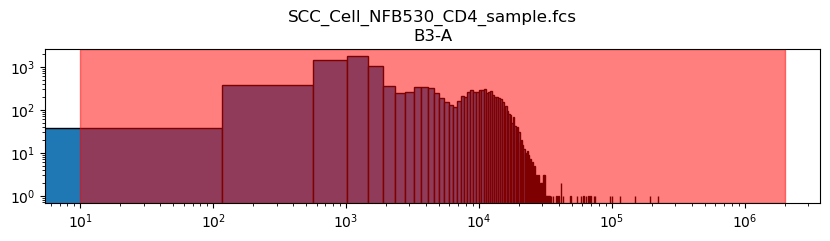

len(data_sub): 12772


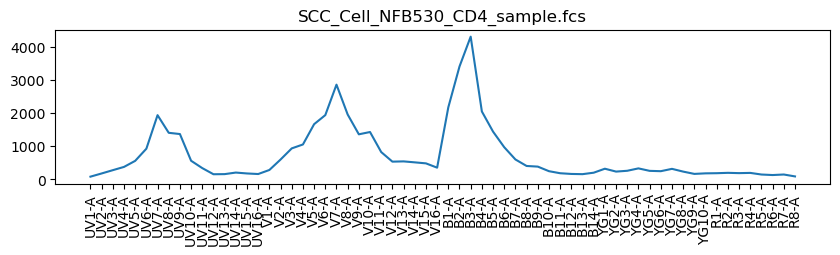

In [17]:
path = Data_dir+"/scc_Aurora5L/NovaBlue530.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B3-A'

min = 20000
max = 30000
filename = 'SCC_Cell_NFB530_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Cell_NFB530_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFB530_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

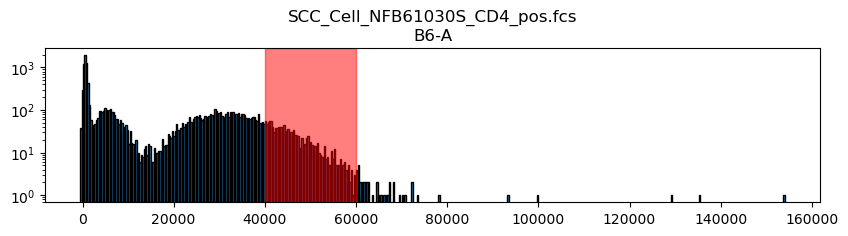

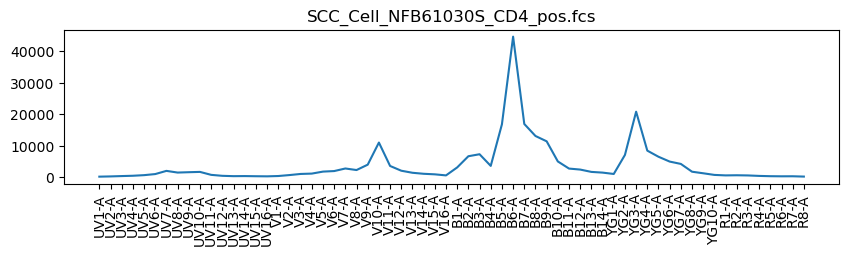

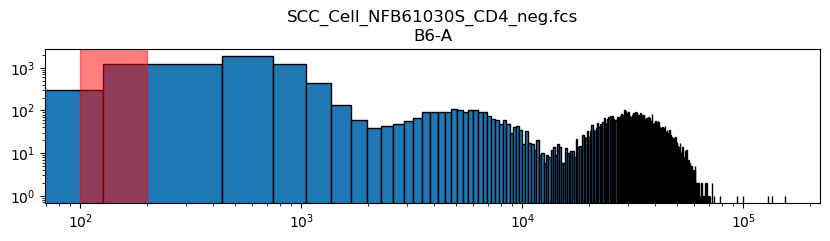

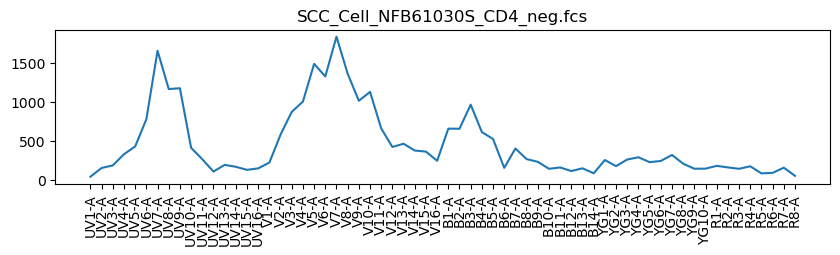

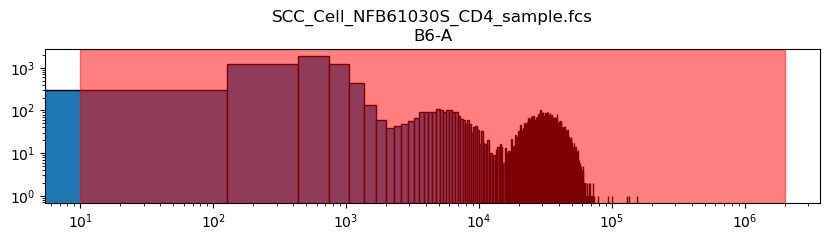

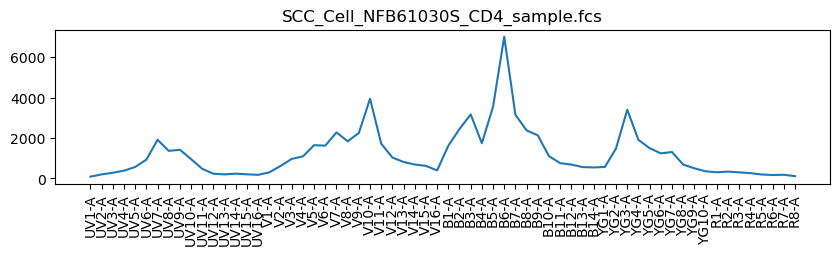

In [122]:
path = Data_dir+"/scc_Aurora5L/NovaBlue61030S.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B6-A'

min = 40000
max = 60000
filename = 'SCC_Cell_NFB61030S_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_NFB61030S_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFB61030S_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

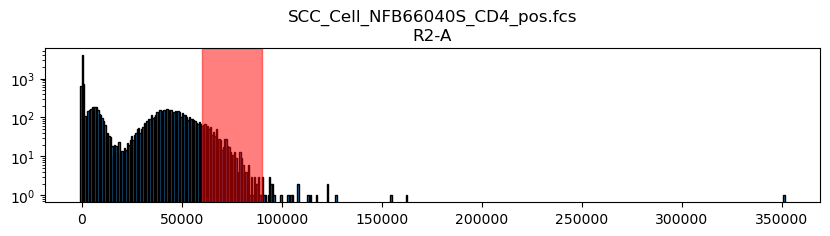

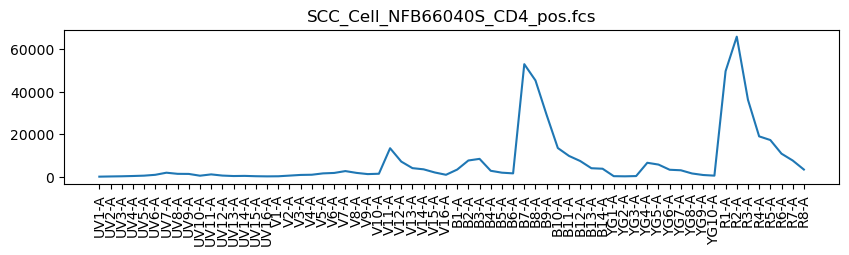

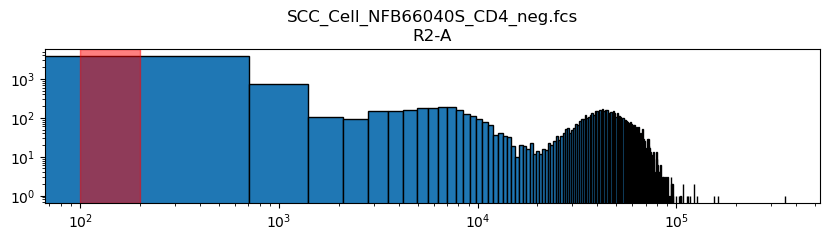

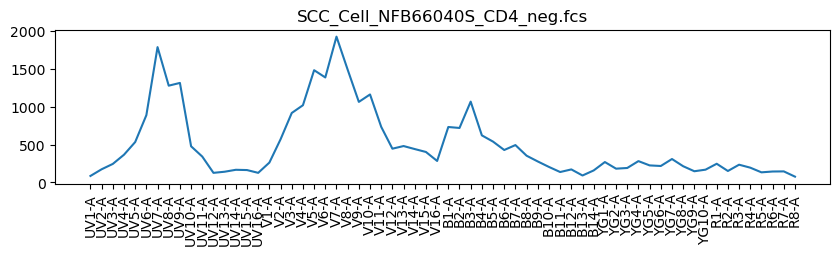

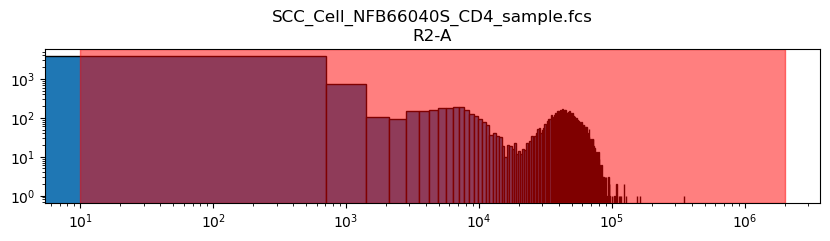

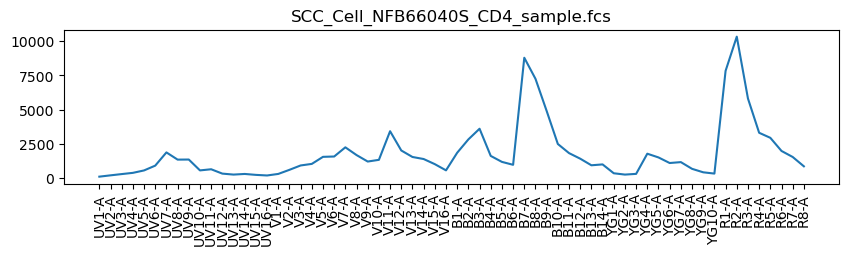

In [124]:
path = Data_dir+"/scc_Aurora5L/NovaBlue66040S.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'R2-A'

min = 60000
max = 90000
filename = 'SCC_Cell_NFB66040S_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_NFB66040S_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFB66040S_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

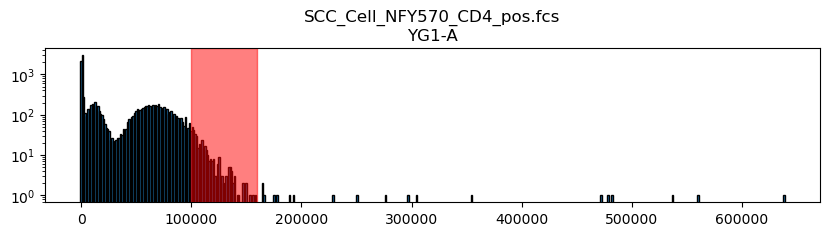

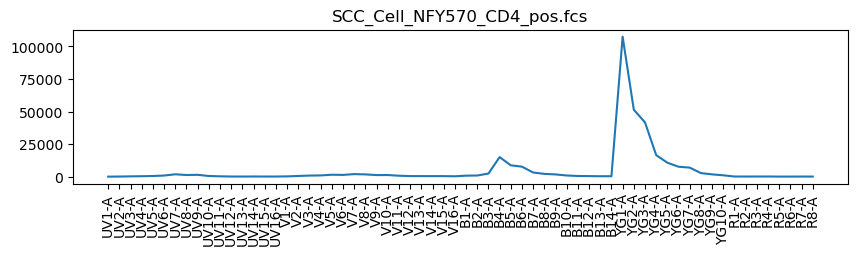

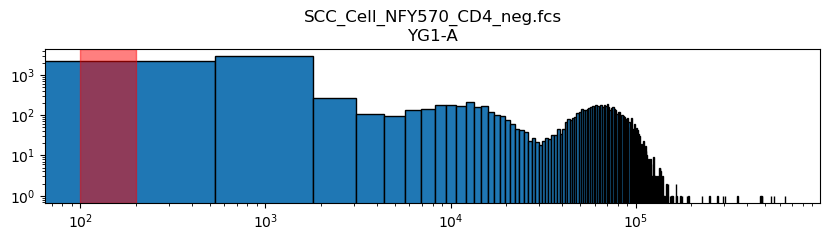

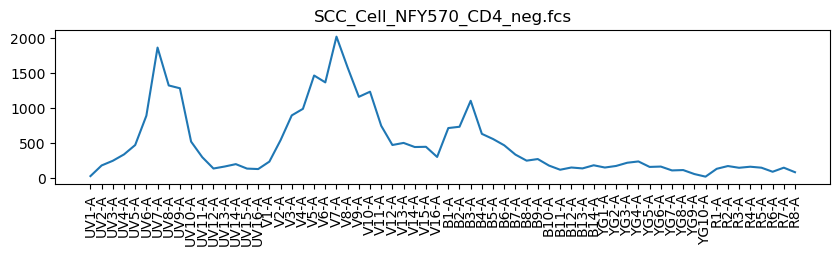

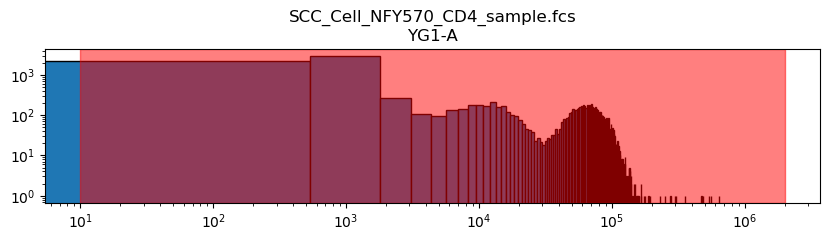

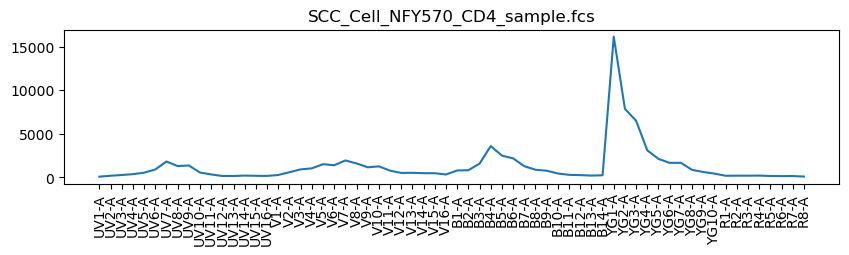

In [126]:
path = Data_dir+"/scc_Aurora5L/NovaYellow570.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG1-A'

min = 100000
max = 160000
filename = 'SCC_Cell_NFY570_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_NFY570_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFY570_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

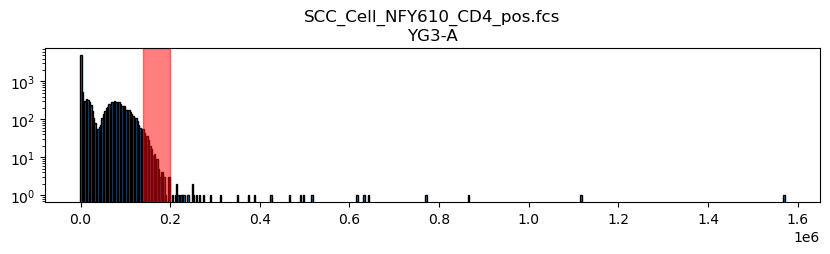

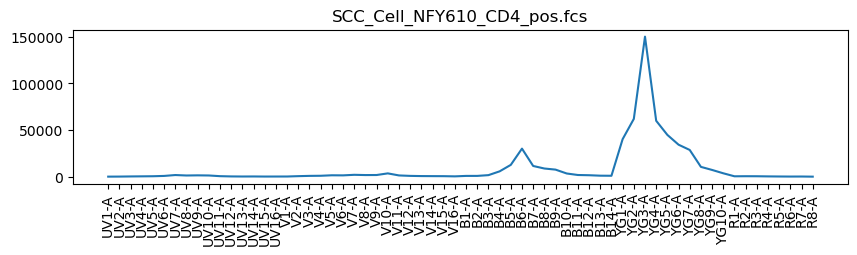

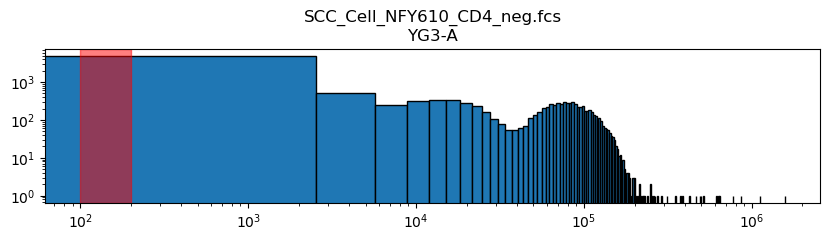

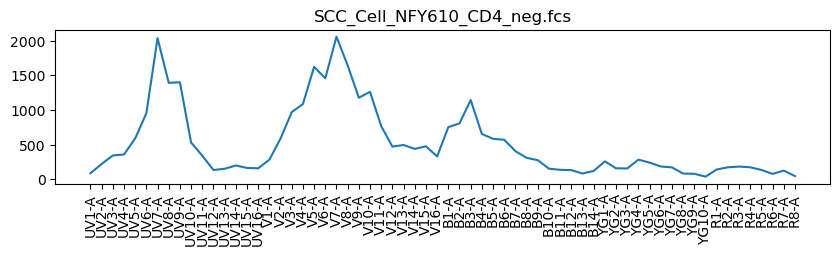

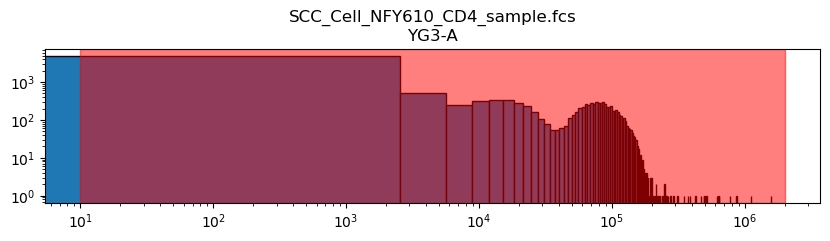

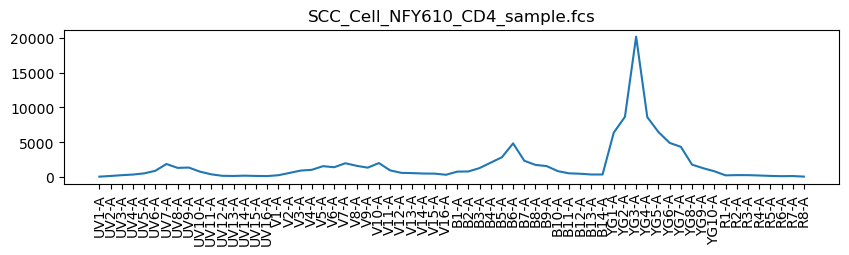

In [129]:
path = Data_dir+"/scc_Aurora5L/NovaYellow610.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG3-A'

min = 140000
max = 200000
filename = 'SCC_Cell_NFY610_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_NFY610_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFY610_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

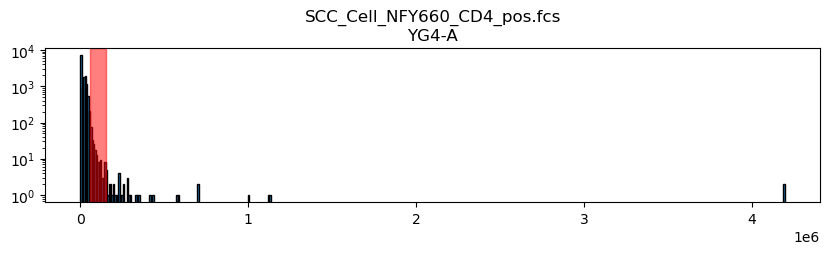

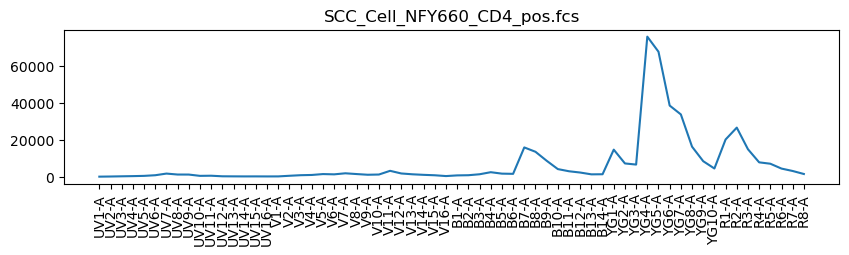

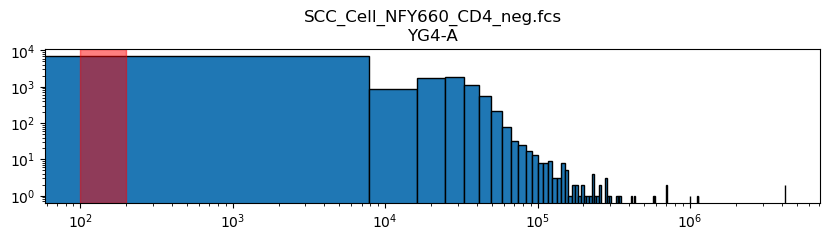

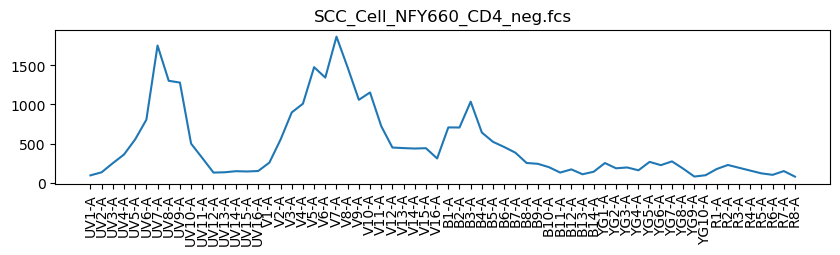

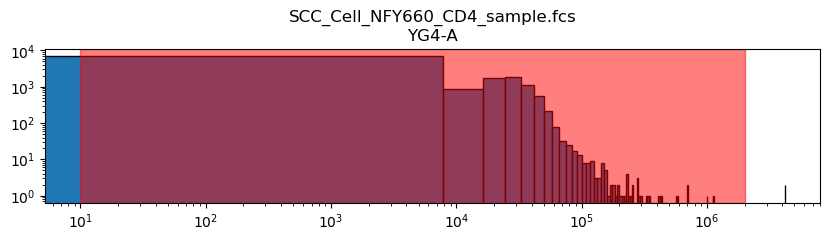

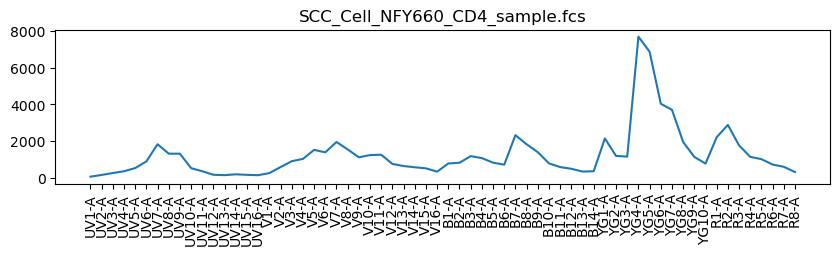

In [132]:
path = Data_dir+"/scc_Aurora5L/NovaYellow660.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG4-A'

min = 60000
max = 150000
filename = 'SCC_Cell_NFY660_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_NFY660_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_NFY660_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

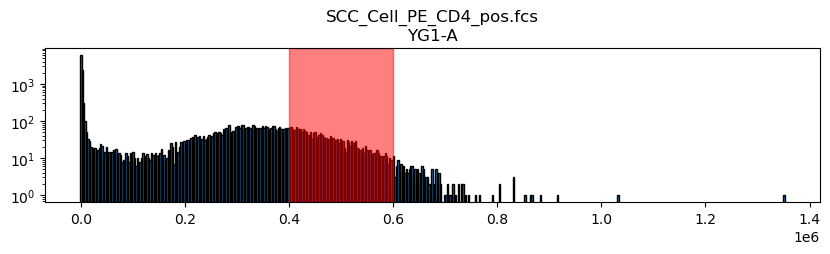

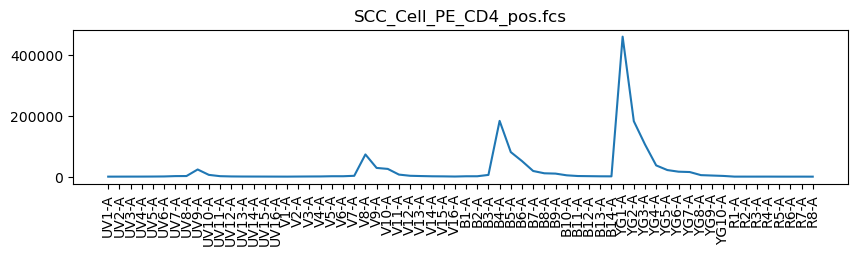

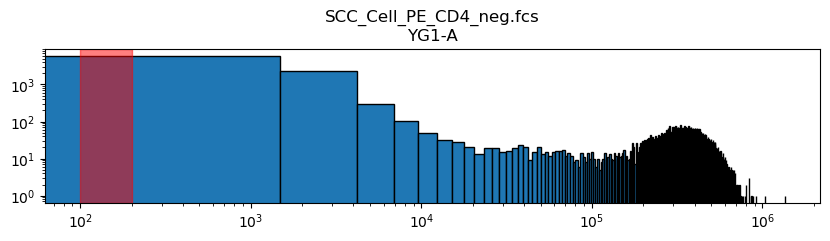

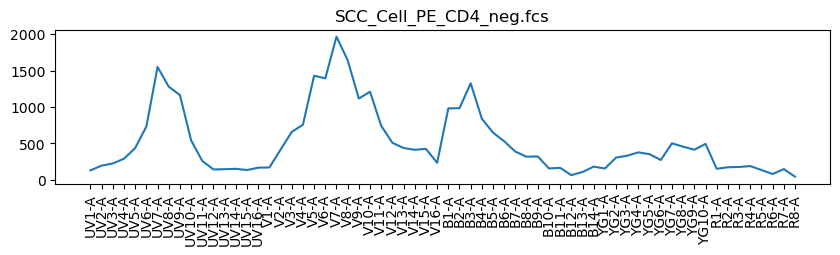

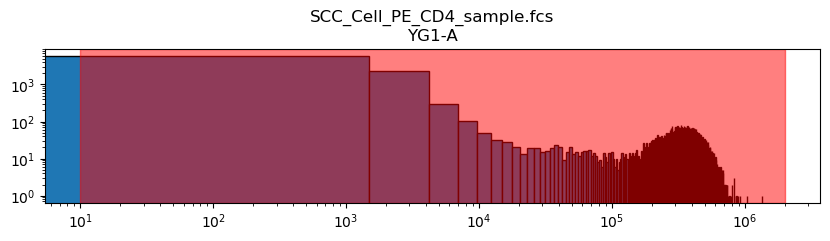

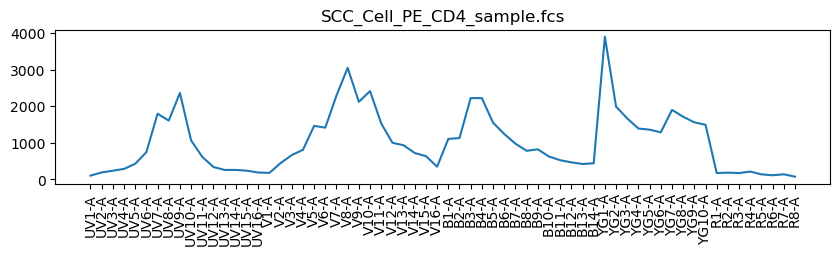

In [134]:
path = Data_dir+"/scc_Aurora5L/PE.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG1-A'

min = 400000
max = 600000
filename = 'SCC_Cell_PE_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_PE_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_PE_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

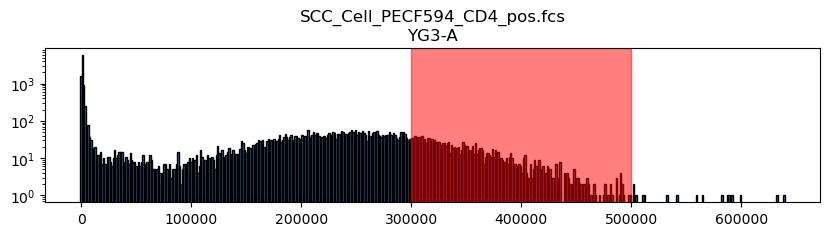

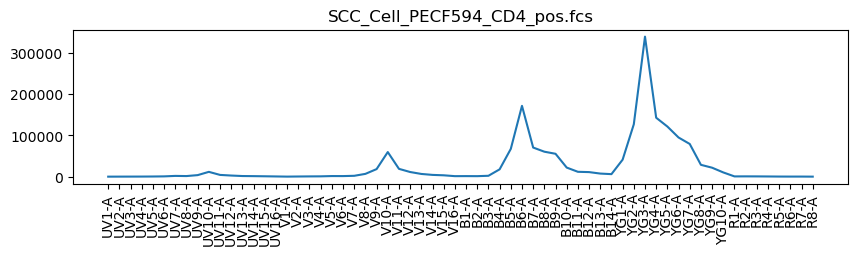

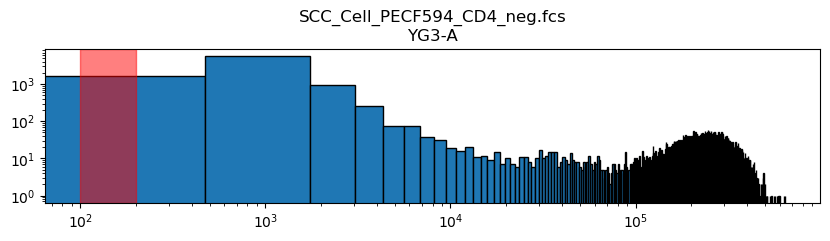

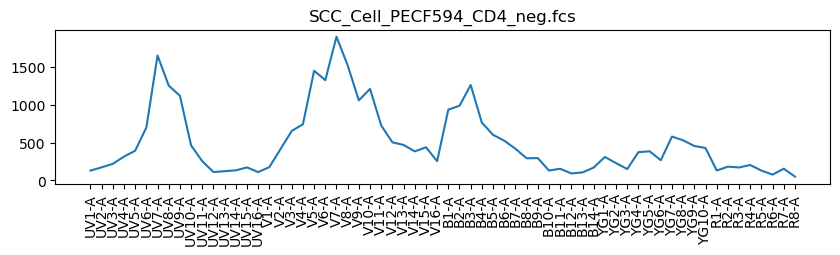

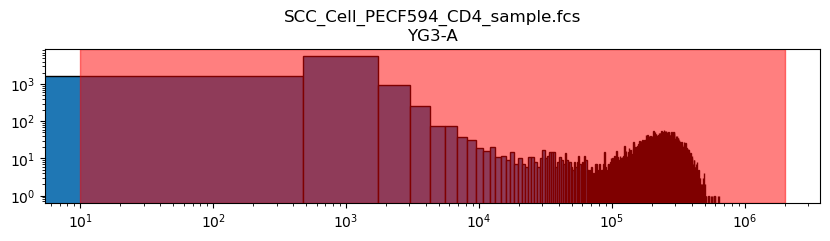

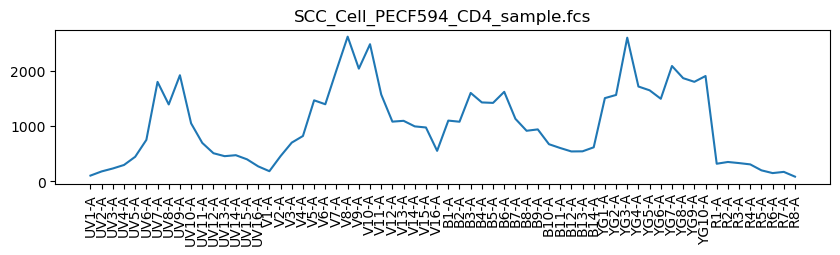

In [136]:
path = Data_dir+"/scc_Aurora5L/PECF594.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG3-A'

min = 300000
max = 500000
filename = 'SCC_Cell_PECF594_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_PECF594_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_PECF594_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

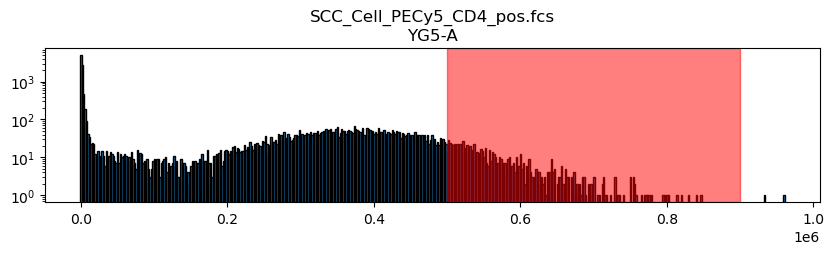

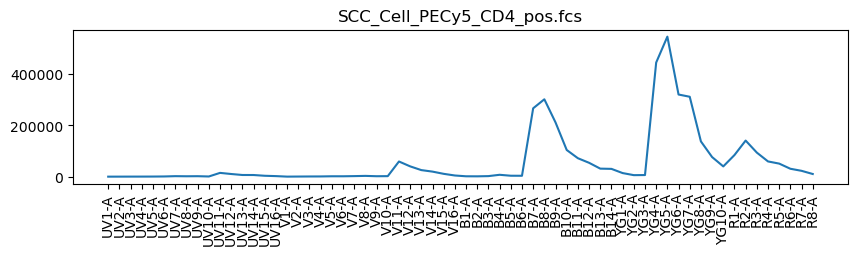

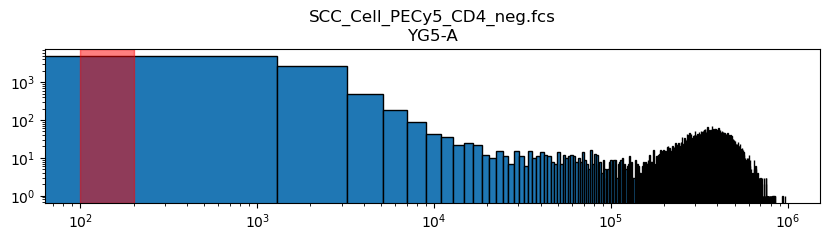

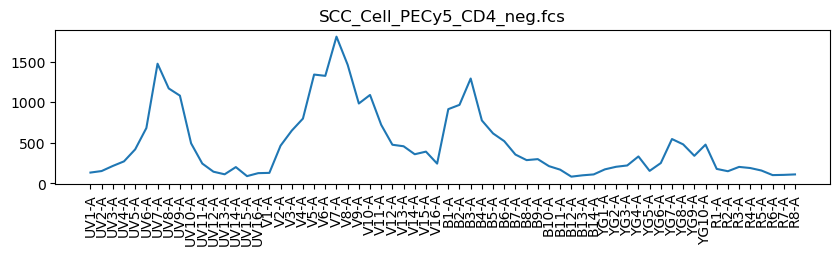

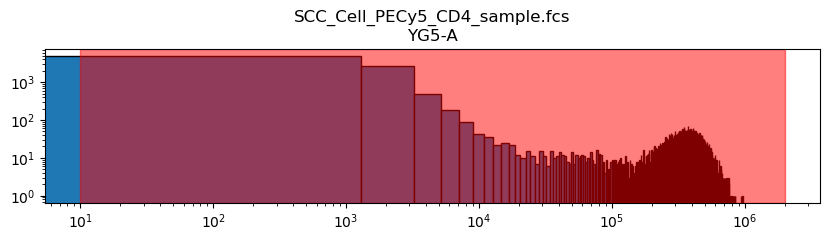

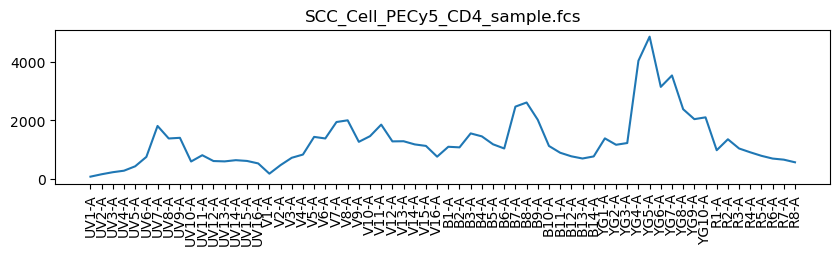

In [140]:
path = Data_dir+"/scc_Aurora5L/PECy5.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG5-A'

min = 500000
max = 900000
filename = 'SCC_Cell_PECy5_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_PECy5_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_PECy5_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

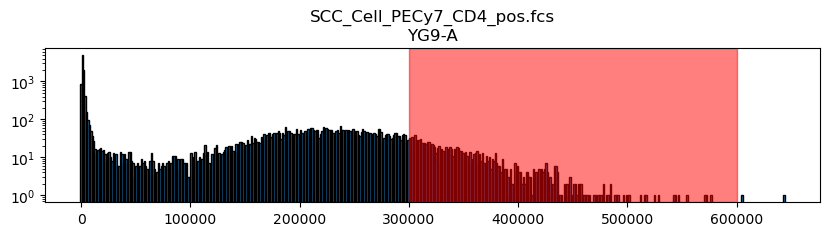

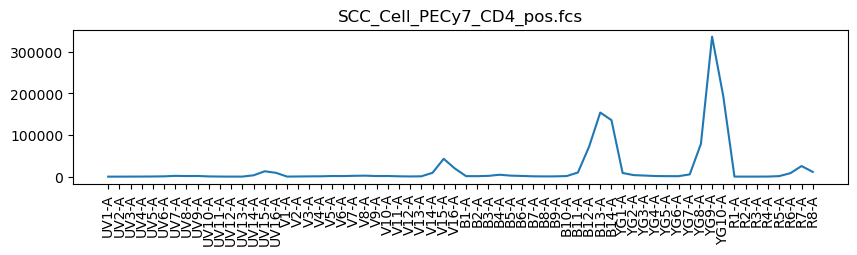

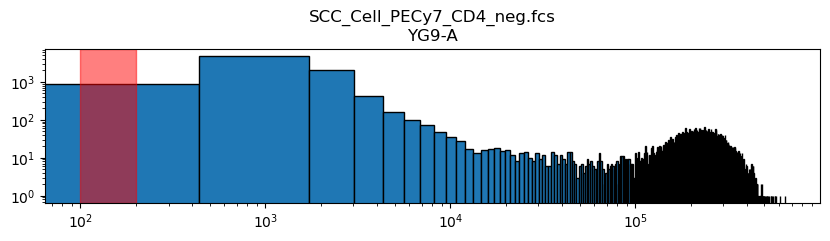

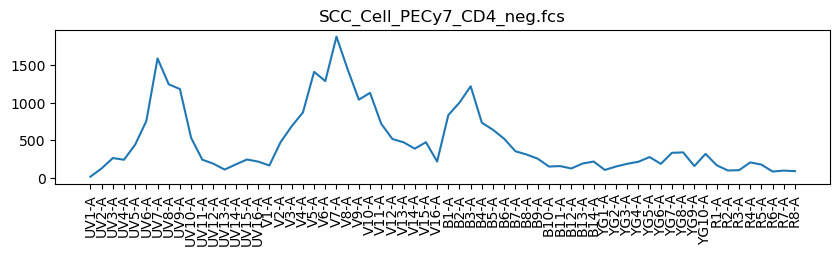

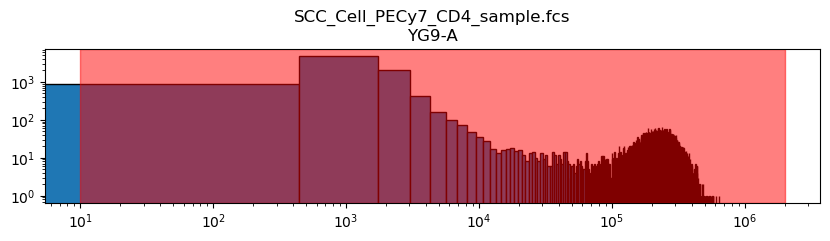

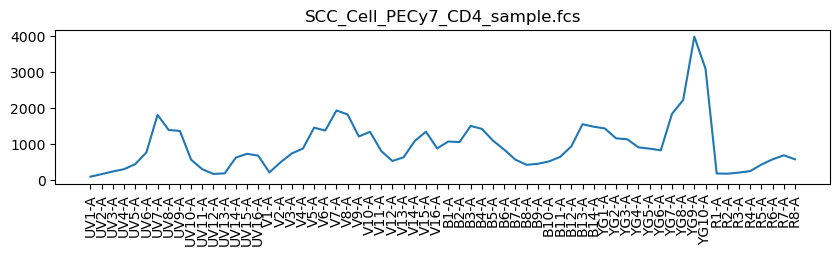

In [142]:
path = Data_dir+"/scc_Aurora5L/PECy7.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'YG9-A'

min = 300000
max = 600000
filename = 'SCC_Cell_PECy7_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_PECy7_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_PECy7_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

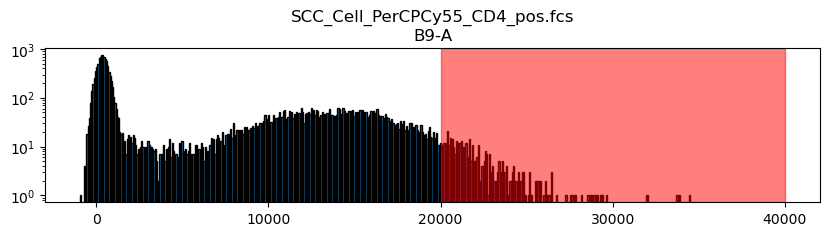

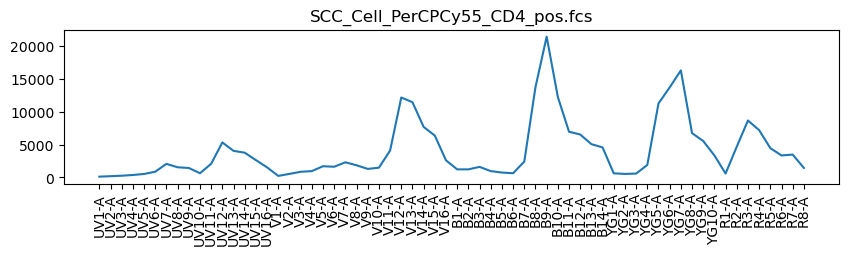

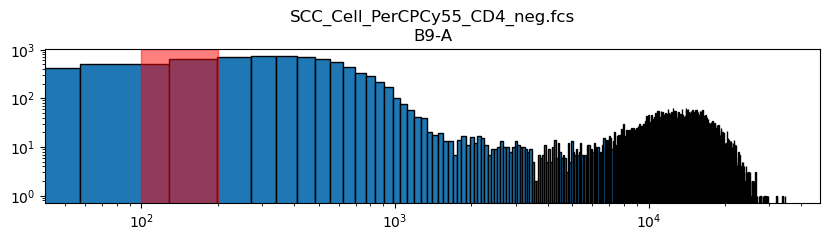

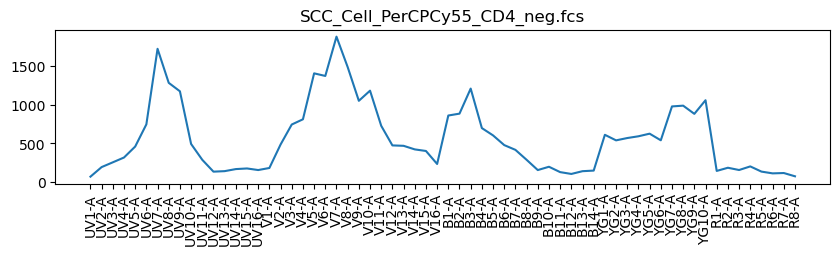

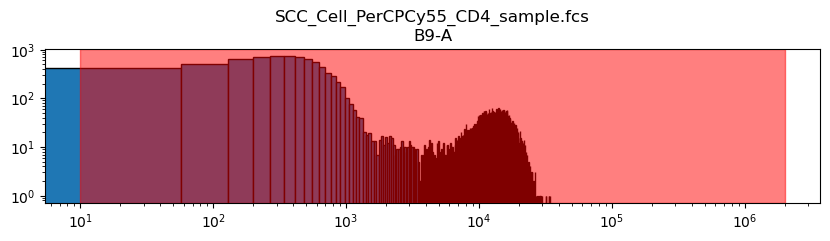

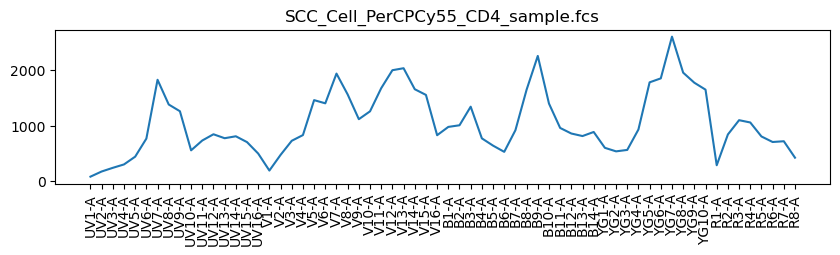

In [144]:
path = Data_dir+"/scc_Aurora5L/PerCPCy55.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)

peak_channel = 'B9-A'

min = 20000
max = 40000
filename = 'SCC_Cell_PerCPCy55_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 200
filename = 'SCC_Cell_PerCPCy55_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000000
filename = 'SCC_Cell_PerCPCy55_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")